#Лабораторная работа 1

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
import math

In [ ]:
def Taylor(x, k):
  res = 0
  for i in range(k):
    res += (x ** i) / math.factorial(i)

  return res

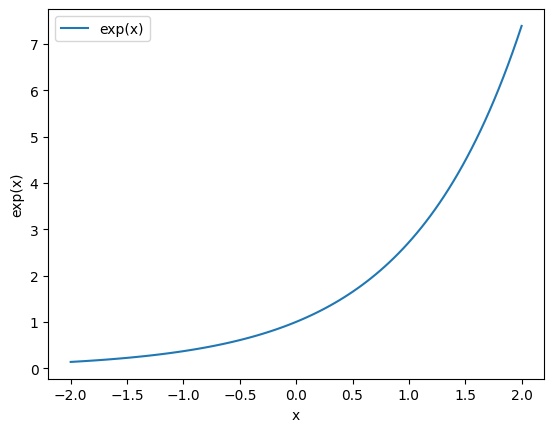

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

y = []
x = np.linspace(-2, 2, 100)

for point in x:
  y.append(np.exp(point))

plt.plot(x, y, label='exp(x)')

plt.xlabel('x')
plt.ylabel('exp(x)')

plt.legend()

plt.show()


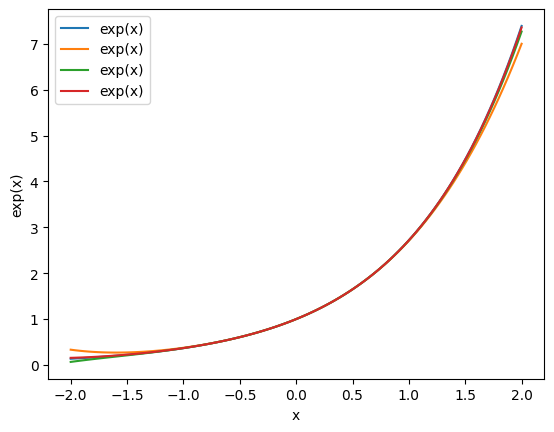

In [ ]:
y2 = []
y3 = []
y4 = []

for point in x:
  y2.append(Taylor(point, 5))
  y3.append(Taylor(point, 6))
  y4.append(Taylor(point, 7))

plt.plot(x, y, x, y2, x, y3, x, y4, label='exp(x)')


plt.xlabel('x')
plt.ylabel('exp(x)')

plt.legend()

plt.show()

In [ ]:
print('Taylor -', Taylor(1.5, 5))
print('Numpy -', np.exp(1.5))

Taylor - 4.3984375
Numpy - 4.4816890703380645


In [ ]:
!pip install sumpy
import sumpy

  Using cached sumpy-2022.1.tar.gz (138 kB)
  Preparing metadata (setup.py) ... done
  Using cached pytools-2024.1.13-py3-none-any.whl.metadata (3.0 kB)
  Using cached loopy-2024.1.tar.gz (621 kB)
  Preparing metadata (setup.py) ... done
  Using cached boxtree-2023.1.tar.gz (384 kB)
  Preparing metadata (setup.py) ... done
  Using cached arraycontext-2021.1.tar.gz (29 kB)
  Preparing metadata (setup.py) ... done
  Using cached pyrsistent-0.20.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (27 kB)
  Using cached pymbolic-2022.2.tar.gz (104 kB)
  Preparing metadata (setup.py) ... done
  Using cached pyvkfft-2024.1.4.tar.gz (27.0 MB)
  Preparing metadata (setup.py) ... done
  Using cached Mako-1.3.5-py3-none-any.whl.metadata (2.9 kB)
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.7/117.7 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

ModuleNotFoundError: No module named 'sumpy'

In [ ]:
from scipy.integrate import nquad, quad

def f(x,y,z):
	return (x+y+z)/(np.sqrt(2*x**2 + 4*y**2 + 5*z**2))

def a(x, y):
  return [0, np.sqrt(1-x**2-y**2)]
def b(x):
  return [0, np.sqrt(1-x**2)]
def c():
  return [0,1]

res, _ = nquad(lambda z, y, x: f(x,y,z), [a,b,c])

print(res)


0.4178153638027288


In [ ]:
def impulse(x):
    a = 0
    b = 1
    A = 2
    if a <= x <= b:
        return A
    else:
        return 0

result, _ = quad(impulse, -1, 2)

print("Result:", result)


NameError: name 'quad' is not defined

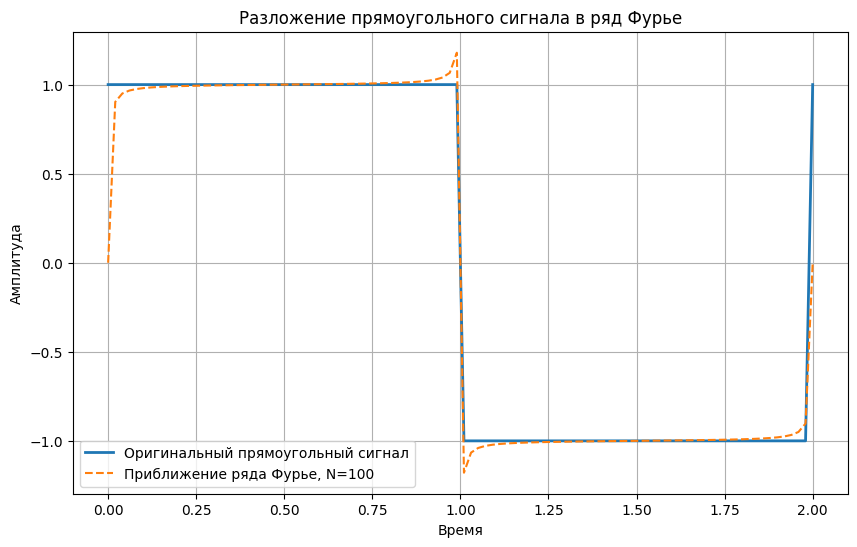

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Параметры сигнала
T = 2  # Период
N = 100  # Количество гармоник для ряда Фурье
t = np.linspace(0, T, 1000)  # Время

# Функция прямоугольного сигнала (базовый импульс)
def rectangular_signal(t, T):
    return np.where(np.mod(t, T) < T / 2, 1, -1)

# Вычисляем прямоугольный сигнал
signal = rectangular_signal(t, T)

# Разложение в ряд Фурье
def fourier_series_approx(t, T, N):
    a0 = 0  # Среднее значение (в данном случае 0)
    series_sum = a0 / 2  # Начальное значение ряда

    for n in range(1, N + 1):
        bn = (2 / (n * np.pi)) * (1 - np.cos(n * np.pi))  # Коэффициенты bn для ряда Фурье
        series_sum += bn * np.sin(n * (2 * np.pi / T) * t)

    return series_sum

# Приближение с помощью ряда Фурье
approx_signal = fourier_series_approx(t, T, N)

# Визуализация
plt.figure(figsize=(10, 6))
plt.plot(t, signal, label="Оригинальный прямоугольный сигнал", linewidth=2)
plt.plot(t, approx_signal, label=f"Приближение ряда Фурье, N={N}", linestyle='--')
plt.title("Разложение прямоугольного сигнала в ряд Фурье")
plt.xlabel("Время")
plt.ylabel("Амплитуда")
plt.legend()
plt.grid(True)
plt.show()


[-4.         -3.91919192 -3.83838384 -3.75757576 -3.67676768 -3.5959596
 -3.51515152 -3.43434343 -3.35353535 -3.27272727 -3.19191919 -3.11111111
 -3.03030303 -2.94949495 -2.86868687 -2.78787879 -2.70707071 -2.62626263
 -2.54545455 -2.46464646 -2.38383838 -2.3030303  -2.22222222 -2.14141414
 -2.06060606 -1.97979798 -1.8989899  -1.81818182 -1.73737374 -1.65656566
 -1.57575758 -1.49494949 -1.41414141 -1.33333333 -1.25252525 -1.17171717
 -1.09090909 -1.01010101 -0.92929293 -0.84848485 -0.76767677 -0.68686869
 -0.60606061 -0.52525253 -0.44444444 -0.36363636 -0.28282828 -0.2020202
 -0.12121212 -0.04040404  0.04040404  0.12121212  0.2020202   0.28282828
  0.36363636  0.44444444  0.52525253  0.60606061  0.68686869  0.76767677
  0.84848485  0.92929293  1.01010101  1.09090909  1.17171717  1.25252525
  1.33333333  1.41414141  1.49494949  1.57575758  1.65656566  1.73737374
  1.81818182  1.8989899   1.97979798  2.06060606  2.14141414  2.22222222
  2.3030303   2.38383838  2.46464646  2.54545455  2.6

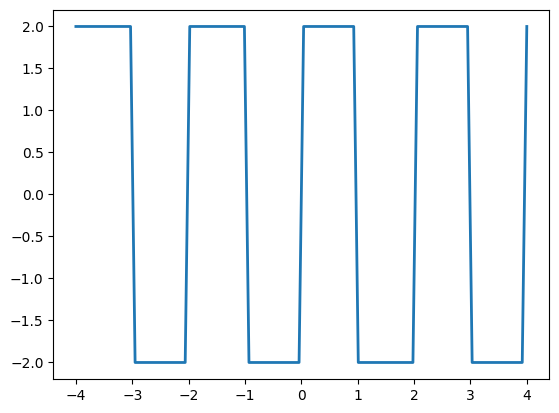

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math

def rectangle_func(t,T,y):
  points = []
  for time in t:
    if math.floor(time) % 2 == 0:
      points.append(y)
    else:
      points.append(-y)

  return points

t = np.linspace(-4,4,100)
points = rectangle_func(t, 2, 2)

plt.plot(t, points, label="Прямоугольный сигнал", linewidth=2)

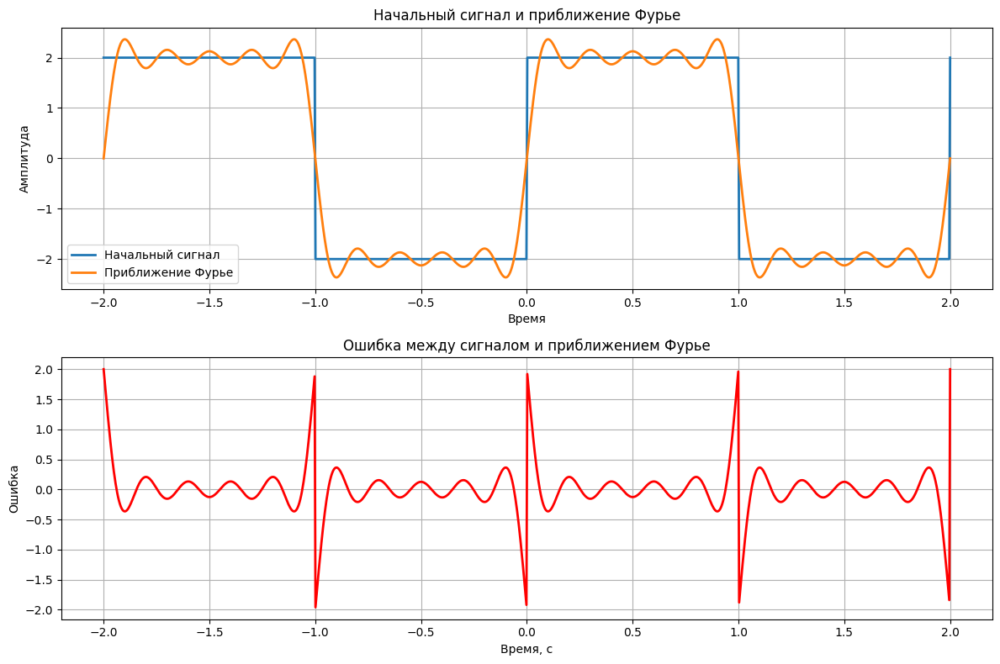

<ipython-input-12-10488fee13b2>:34: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  integral_b1, _ = quad(lambda t: func(t) * np.sin(2 * np.pi * n * t / T), 0, T/2)
<ipython-input-12-10488fee13b2>:35: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on 

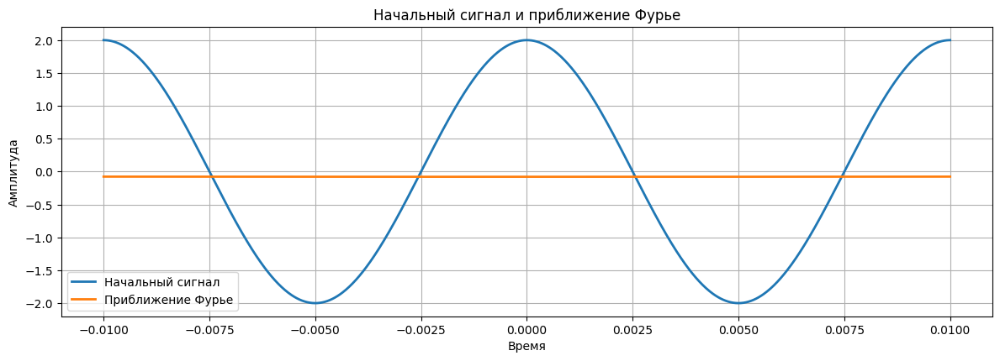

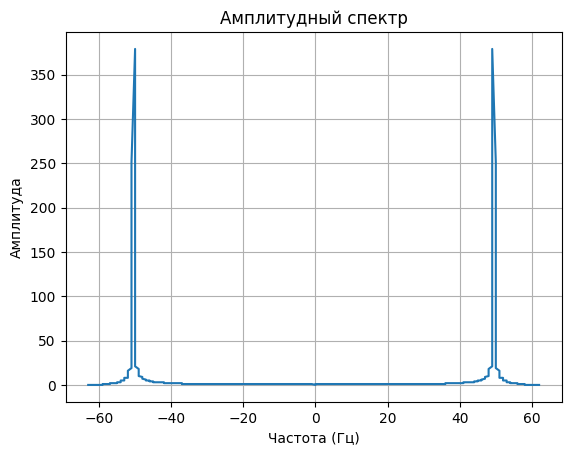

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import quad
import math

T = 2
value = 2
N = 10
A = 2
f = 100
t = np.linspace(-T, T, 1000)

def rectangle_func(t):
    if np.floor(t) % 2 == 0:
        return value
    else:
        return -value

def cos_func(t):
    return A * np.cos(2 * np.pi * t * f)

def furye(t, func):
    integral1, _ = quad(func, 0, T/2)
    integral2, _ = quad(func, T/2, T)
    a0 = 2 / T * (integral1 + integral2)

    buf = 0

    for n in range(1, N + 1):
        integral_a1, _ = quad(lambda t: func(t) * np.cos(2 * np.pi * n * t / T), 0, T/2)
        integral_a2, _ = quad(lambda t: func(t) * np.cos(2 * np.pi * n * t / T), T/2, T)
        an = 2 / T * (integral_a1 + integral_a2)

        integral_b1, _ = quad(lambda t: func(t) * np.sin(2 * np.pi * n * t / T), 0, T/2)
        integral_b2, _ = quad(lambda t: func(t) * np.sin(2 * np.pi * n * t / T), T/2, T)
        bn = 2 / T * (integral_b1 + integral_b2)

        buf += an * np.cos(2 * np.pi * n * t / T) + bn * np.sin(2 * np.pi * n * t / T)

    res = a0 / 2 + buf
    return res

def func_approx(func):
    signal = []
    signal_furye = []

    for point in t:
        y1 = func(point)
        signal.append(y1)

        y2 = furye(point, func)
        signal_furye.append(y2)

    plt.figure(figsize=(12, 8))

    plt.subplot(2, 1, 1)
    plt.plot(t, signal, label='Начальный сигнал', linewidth=2)
    plt.plot(t, signal_furye, label='Приближение Фурье', linewidth=2)
    plt.title('Начальный сигнал и приближение Фурье')
    plt.xlabel('Время')
    plt.ylabel('Амплитуда')
    plt.legend()
    plt.grid(True)

    if func == rectangle_func:
      eps = np.array(signal) - np.array(signal_furye)
      plt.subplot(2, 1, 2)
      plt.plot(t, eps, label='Ошибка', color='r', linewidth=2)
      plt.title('Ошибка между сигналом и приближением Фурье')
      plt.xlabel('Время, с')
      plt.ylabel('Ошибка')
      plt.grid(True)

    plt.tight_layout()
    plt.show()

func_approx(rectangle_func)



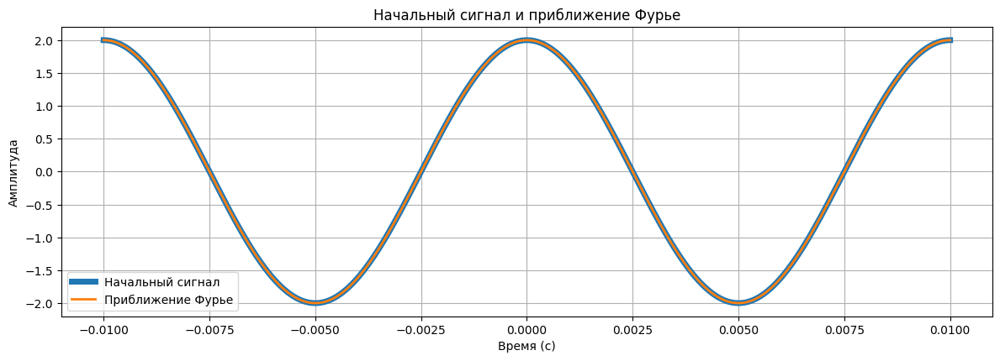

ValueError: x and y must have same first dimension, but have shapes (1000,) and (600,)

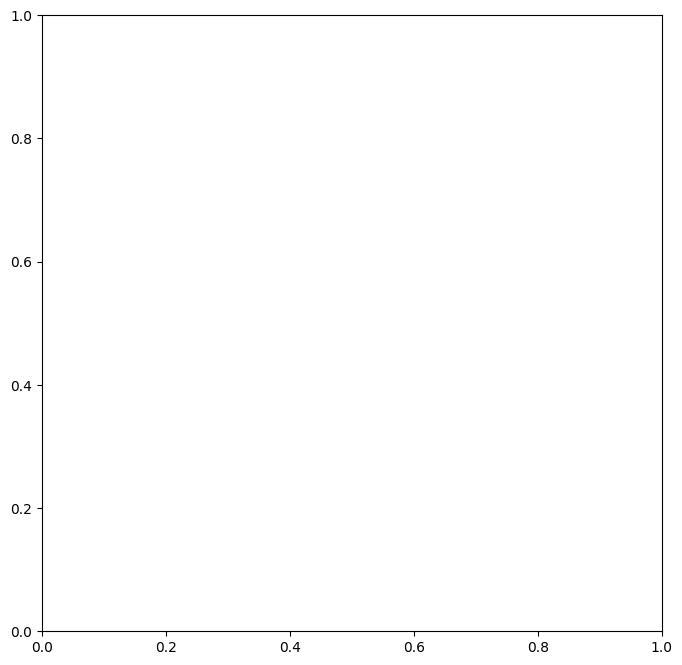

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import quad
from scipy.fftpack import fft

A = 2
f = 100
T = 1 / f
N = 10

t = np.linspace(-T, T, 1000)

def cos_signal(t):
    return A * np.cos(2 * np.pi * f * t)

def furye(t, func):
    integral1, _ = quad(func, 0, T/2)
    integral2, _ = quad(func, T/2, T)
    a0 = 2 / T * (integral1 + integral2)

    buf = 0

    for n in range(1, N + 1):
        integral_a1, _ = quad(lambda t: func(t) * np.cos(2 * np.pi * n * t / T), 0, T/2)
        integral_a2, _ = quad(lambda t: func(t) * np.cos(2 * np.pi * n * t / T), T/2, T)
        an = 2 / T * (integral_a1 + integral_a2)

        integral_b1, _ = quad(lambda t: func(t) * np.sin(2 * np.pi * n * t / T), 0, T/2)
        integral_b2, _ = quad(lambda t: func(t) * np.sin(2 * np.pi * n * t / T), T/2, T)
        bn = 2 / T * (integral_b1 + integral_b2)

        buf += an * np.cos(2 * np.pi * n * t / T) + bn * np.sin(2 * np.pi * n * t / T)

    res = a0 / 2 + buf
    return res

def func_approx(func):
    signal = []
    signal_furye = []

    for point in t:
        y1 = func(point)
        signal.append(y1)

        y2 = furye(point, func)
        signal_furye.append(y2)

    plt.figure(figsize=(12, 8))

    plt.subplot(2, 1, 1)
    plt.plot(t, signal, label='Начальный сигнал', linewidth=5)
    plt.plot(t, signal_furye, label='Приближение Фурье', linewidth=2)
    plt.title('Начальный сигнал и приближение Фурье')
    plt.xlabel('Время (с)')
    plt.ylabel('Амплитуда')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

def spectr():


func_approx(cos_signal)

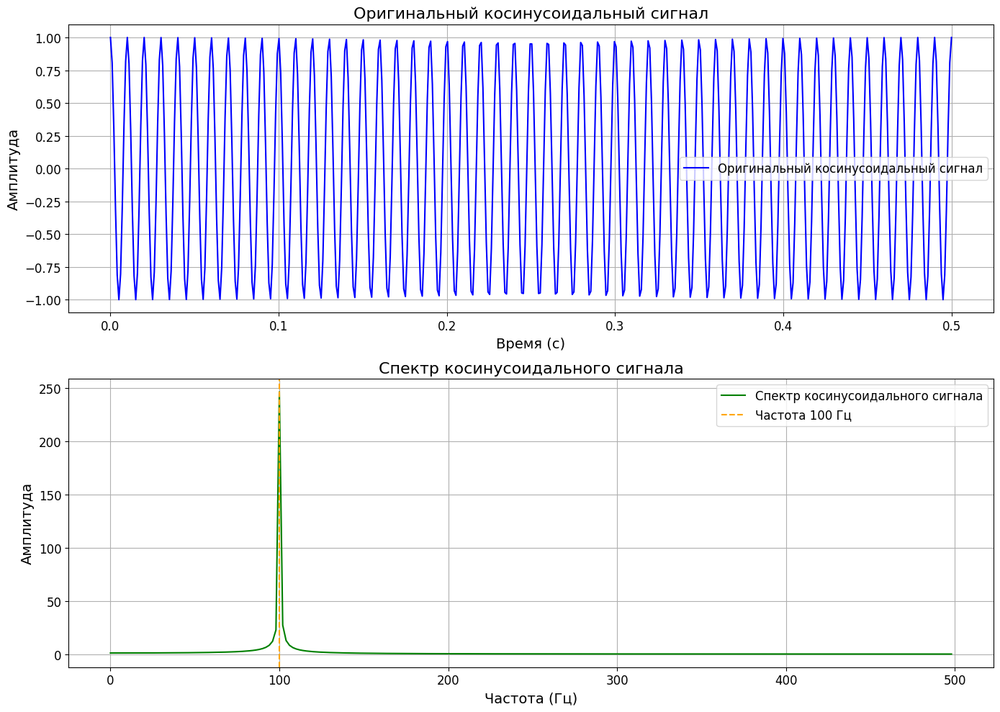

Спектральный коэффициент: 246.15


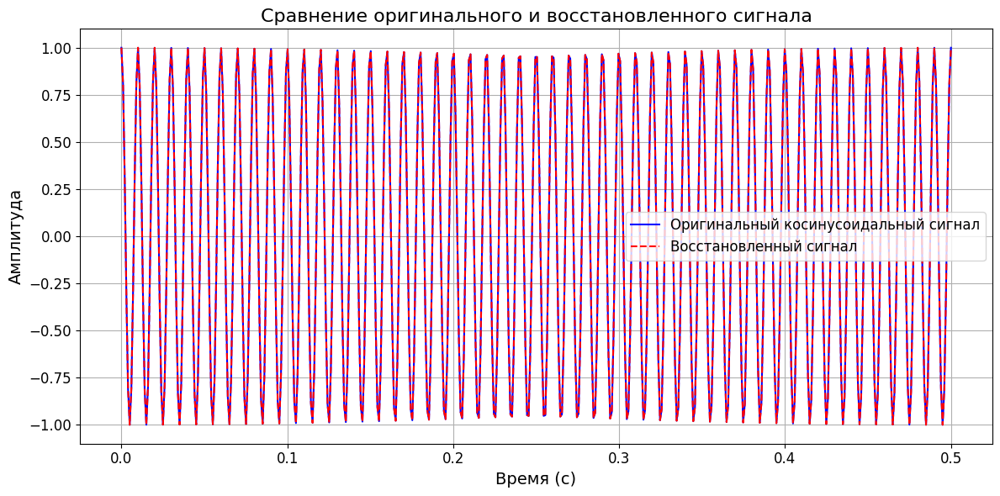

In [ ]:
from scipy.fft import fft, ifft, fftfreq

f = 100
A = 1
Fs = 1000  # Частота дискретизации
T = 1.0 / Fs  # Период дискретизации
L = 100

t = np.linspace(0, L * T, L)

w1 = 2 * np.pi * f
x_cos = A * np.cos(w1 * t)

X_f = fft(x_cos)
freqs = fftfreq(L, T)[:L // 2]

x_cos_restored = ifft(X_f).real

plt.figure(figsize=(14, 10))

plt.subplot(2, 1, 1)
plt.plot(t, x_cos, label='Оригинальный косинусоидальный сигнал', color='blue')
plt.title('Оригинальный косинусоидальный сигнал', fontsize=16)
plt.xlabel('Время (с)', fontsize=14)
plt.ylabel('Амплитуда', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.subplot(2, 1, 2)
plt.plot(freqs, np.abs(X_f[:L // 2]), label='Спектр косинусоидального сигнала', color='green')
plt.axvline(f, color='orange', linestyle='--', label='Частота 100 Гц')
plt.title('Спектр косинусоидального сигнала', fontsize=16)
plt.xlabel('Частота (Гц)', fontsize=14)
plt.ylabel('Амплитуда', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

index = np.argmax(np.abs(X_f))
an = np.abs(X_f[index])
print(f'Спектральный коэффициент: {an:.2f}')

plt.figure(figsize=(12, 6))
plt.plot(t, x_cos, label='Оригинальный косинусоидальный сигнал', color='blue', linewidth=1.5)
plt.plot(t, x_cos_restored, label='Восстановленный сигнал', linestyle='--', color='red', linewidth=1.5)
plt.title('Сравнение оригинального и восстановленного сигнала', fontsize=16)
plt.xlabel('Время (с)', fontsize=14)
plt.ylabel('Амплитуда', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


Text(0, 0.5, 'Амплитуда')

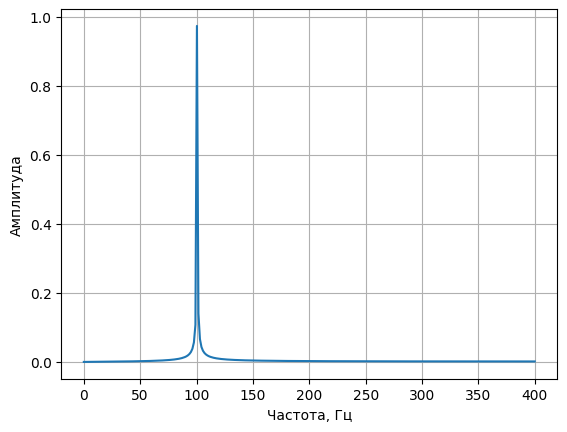

In [ ]:
import numpy as np
from scipy.fftpack import fft
import matplotlib.pyplot as plt

N = 600
fmax=800
T = 1.0/fmax
f=100
x = np.linspace(0.0, N*T, N)
y = np.sin(f * 2.0*np.pi*x)
xf = np.linspace(0.0, fmax/2, N//2)
yff = fft(y)
plt.plot(xf, 2.0/N * np.abs(yff[0:N//2]))
plt.grid()
plt.xlabel('Частота, Гц')
plt.ylabel('Амплитуда')

In [ ]:
f1 = 150
f2 = 50

#Лабораторная работа 2

In [ ]:
import numpy as np
from scipy.fftpack import fft, ifft, fftfreq
import matplotlib.pyplot as plt
import time

**Задание** 1

FFT быстрее DFT_slow в 310.0 раз


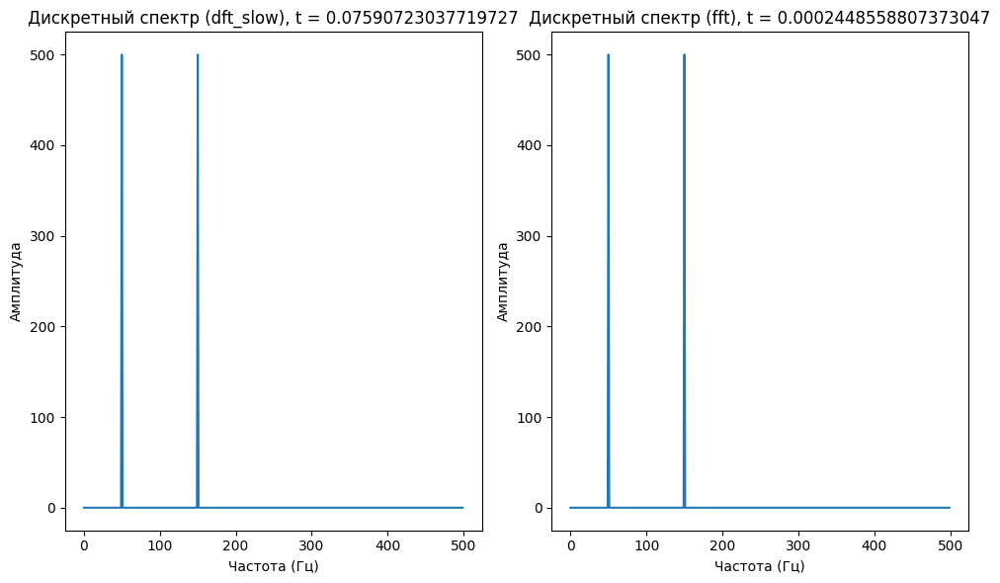

In [ ]:
Fs = 1000
T = 1 / Fs
L = 1000
t = np.linspace(0, L*T, L, endpoint=False)

f1 = 50
f2 = 150
signal = np.cos(2 * np.pi * f1 * t) + np.cos(2 * np.pi * f2 * t)

def dft_slow(x):
  x = np.asarray(x, dtype=float)
  N = x.shape[0]
  n = np.arange(N)
  k = n.reshape((N, 1))
  M = np.exp(-2j * np.pi * k * n / N)
  return np.dot(M, x)

def dft_fast(x):
    return fft(x)

# Время выполнения для DFT
start_time_dft = time.time()
dft_result = dft_slow(signal)
end_time_dft = time.time()
dft_time = end_time_dft - start_time_dft

# Время выполннния для FFT
start_time_fft = time.time()
fft_result = dft_fast(signal)
end_time_fft = time.time()
fft_time = end_time_fft - start_time_fft

frequencies = fftfreq(L, T)

plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.plot(frequencies[:L // 2], np.abs(dft_result)[:L // 2])
plt.title(f'Дискретный спектр (dft_slow), t = {dft_time}')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')

plt.subplot(1, 2, 2)
plt.plot(frequencies[:L // 2], np.abs(fft_result)[:L // 2])
plt.title(f'Дискретный спектр (fft), t = {fft_time}')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')

print(f'FFT быстрее DFT_slow в {dft_time // fft_time} раз')
plt.tight_layout()
plt.show()

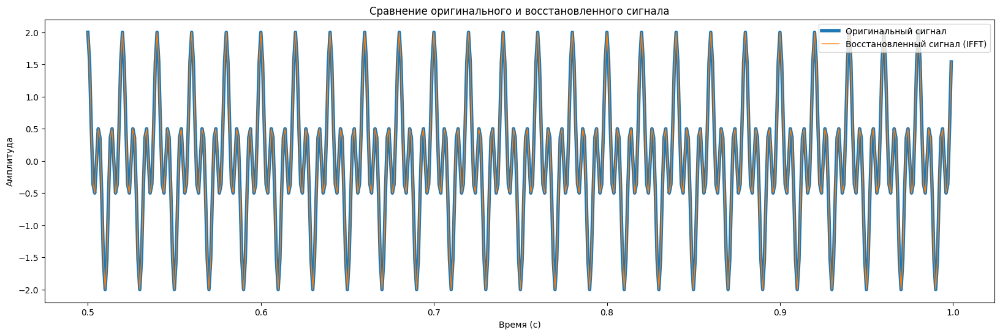

In [ ]:
old_signal = ifft(fft_result).real

plt.figure(figsize=(20, 6))
plt.plot(t[500:1000], signal[500:1000], label="Оригинальный сигнал", linewidth=4)
plt.plot(t[500:1000], old_signal[500:1000], label="Восстановленный сигнал (IFFT)", linewidth=1)
plt.title('Сравнение оригинального и восстановленного сигнала')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')
plt.legend()
plt.show()

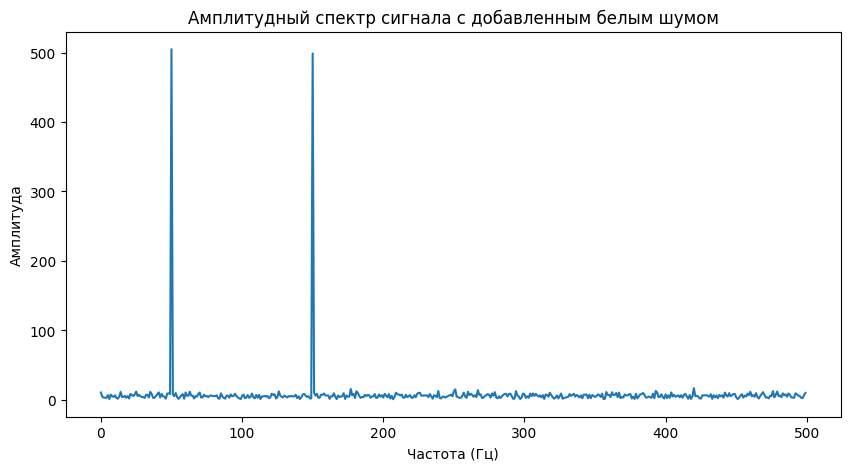

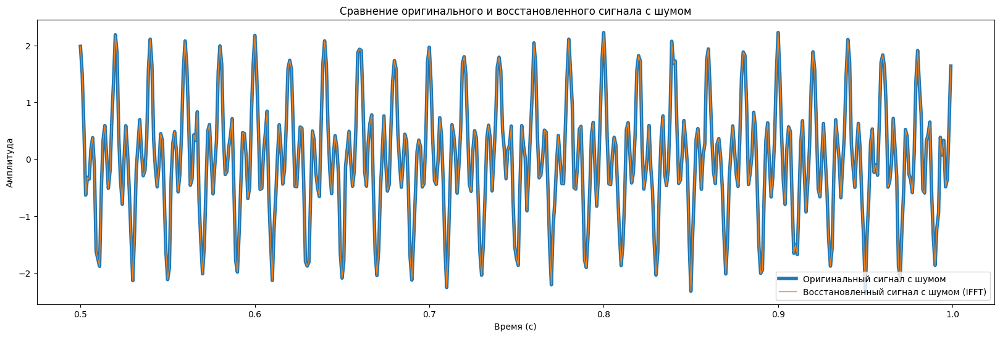

In [ ]:
noise_amplitude = 0.2
noise = noise_amplitude * np.random.normal(size=signal.shape)
signal_with_noise = signal + noise

fft_with_noise = fft(signal_with_noise)

plt.figure(figsize=(10, 5))
plt.plot(frequencies[:L // 2], np.abs(fft_with_noise)[:L // 2])
plt.title('Амплитудный спектр сигнала с добавленным белым шумом')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')
plt.show()

old_signal_with_noise = ifft(fft_with_noise).real

plt.figure(figsize=(20, 6))
plt.plot(t[500:1000], signal_with_noise[500:1000], label="Оригинальный сигнал с шумом", linewidth=4)
plt.plot(t[500:1000], old_signal_with_noise[500:1000], label="Восстановленный сигнал с шумом (IFFT)", linewidth=1)
plt.title('Сравнение оригинального и восстановленного сигнала с шумом')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')
plt.legend()
plt.show()


**Задание 2**

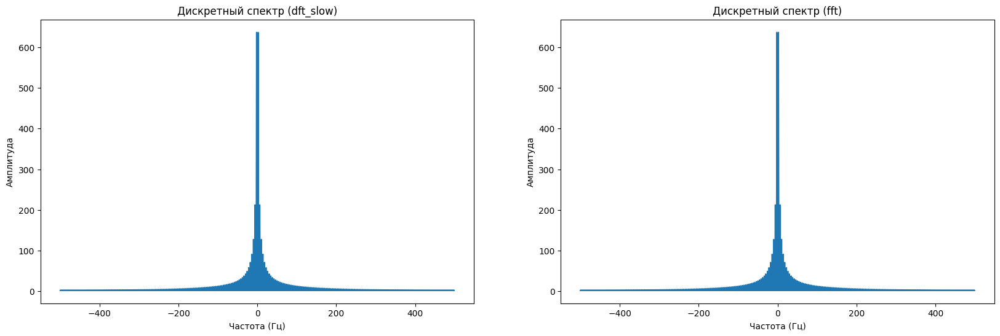

In [ ]:
A = 2
T = 2
Fs = 1000
t = np.linspace(0, 4, 1000)

rec_signal = np.where(np.mod(t, T) < T / 2, 1, -1)

dft_result_rec = dft_slow(rec_signal)
fft_result_rec = dft_fast(rec_signal)

rec_frequencies = fftfreq(fft_result_rec.size, 1 / Fs)

plt.figure(figsize=(20, 6))

plt.subplot(1, 2, 1)
plt.plot(rec_frequencies, np.abs(dft_result_rec))
plt.title('Дискретный спектр (dft_slow)')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')

plt.subplot(1, 2, 2)
plt.plot(rec_frequencies, np.abs(fft_result_rec))
plt.title('Дискретный спектр (fft)')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')

plt.show()


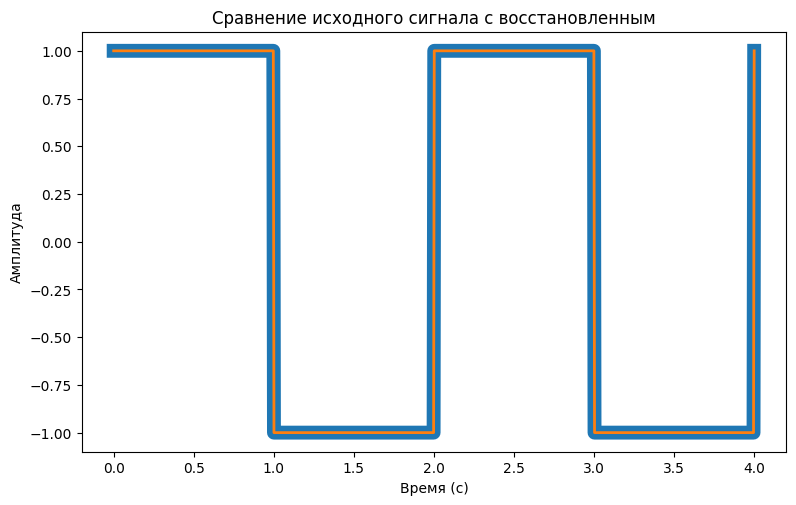

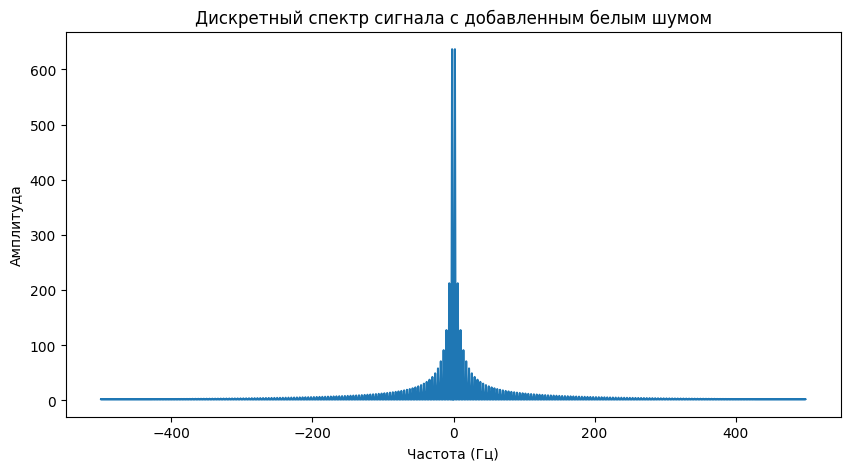

In [ ]:
old_rec_signal = ifft(fft_result_rec).real

plt.figure(figsize=(20, 12))

plt.subplot(2, 2, 1)
plt.plot(t, rec_signal, linewidth = 10)
plt.plot(t, old_rec_signal, linewidth = 2)
plt.title('Сравнение исходного сигнала с восстановленным')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')

old_rec_fft = fft(old_rec_signal)

plt.figure(figsize=(10, 5))
plt.plot(rec_frequencies, np.abs(old_rec_fft))
plt.title('Дискретный спектр сигнала с добавленным белым шумом')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')
plt.show()


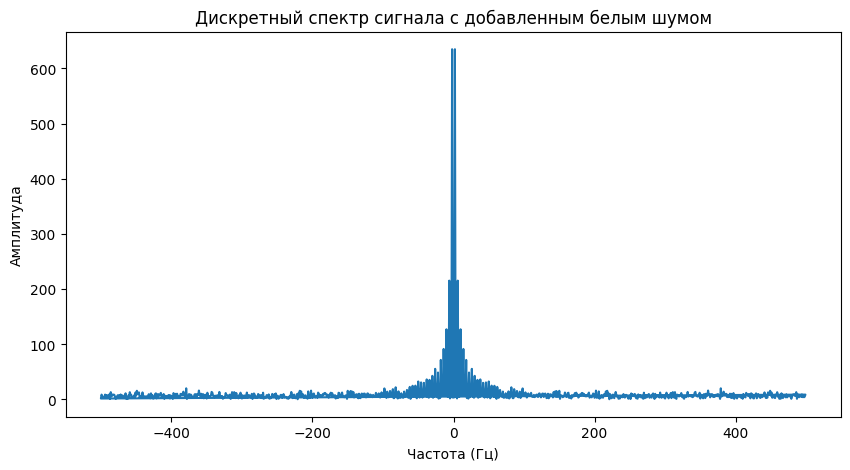

In [ ]:
noise = noise_amplitude * np.random.normal(size=rec_signal.shape)
rec_signal_with_noise = rec_signal + noise

rec_fft_with_noise = fft(rec_signal_with_noise)

plt.figure(figsize=(10, 5))
plt.plot(rec_frequencies, np.abs(rec_fft_with_noise))
plt.title('Дискретный спектр сигнала с добавленным белым шумом')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')
plt.show()


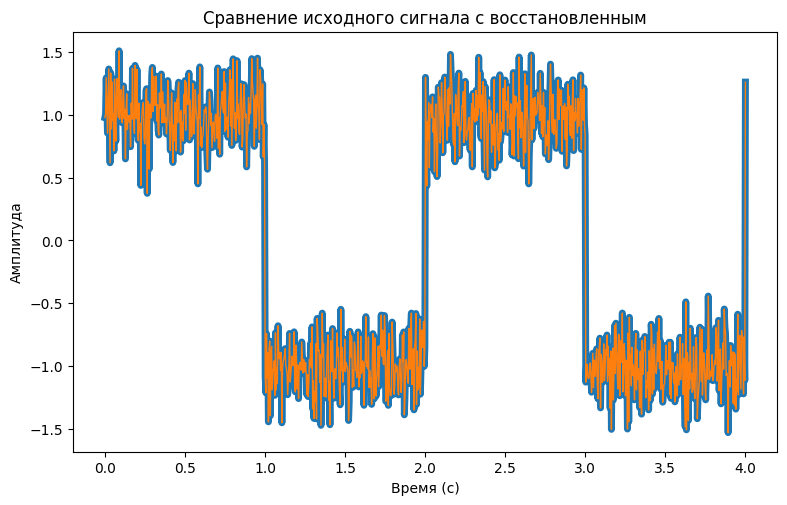

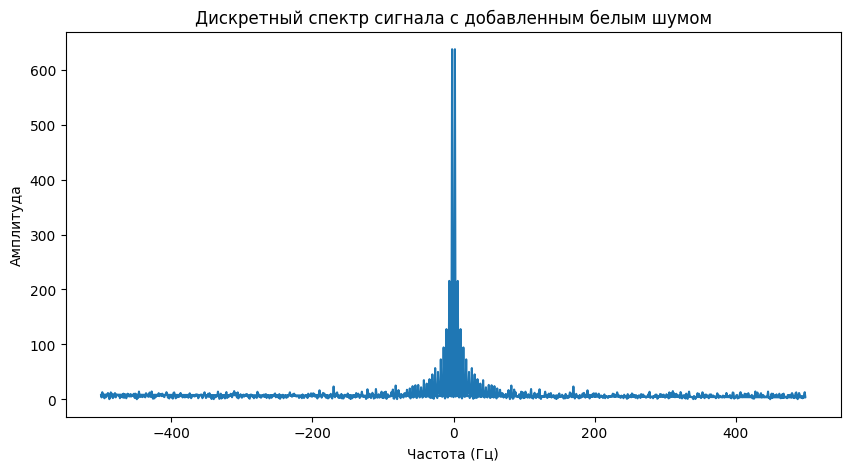

In [ ]:
noise = noise_amplitude * np.random.normal(size=rec_signal.shape)
rec_signal_with_noise = rec_signal + noise

rec_fft_with_noise = fft(rec_signal_with_noise)

old_rec_signal_with_noise = ifft(rec_fft_with_noise).real

plt.figure(figsize=(20, 12))

plt.subplot(2, 2, 1)
plt.plot(t, rec_signal_with_noise, linewidth = 5)
plt.plot(t, old_rec_signal_with_noise, linewidth = 1)
plt.title('Сравнение исходного сигнала с восстановленным')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')

old_rec_fft_with_noise = fft(old_rec_signal_with_noise)

plt.figure(figsize=(10, 5))
plt.plot(rec_frequencies, np.abs(old_rec_fft_with_noise))
plt.title('Дискретный спектр сигнала с добавленным белым шумом')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')
plt.show()


**Задание 3**

0.0130615234375 0.00014734268188476562


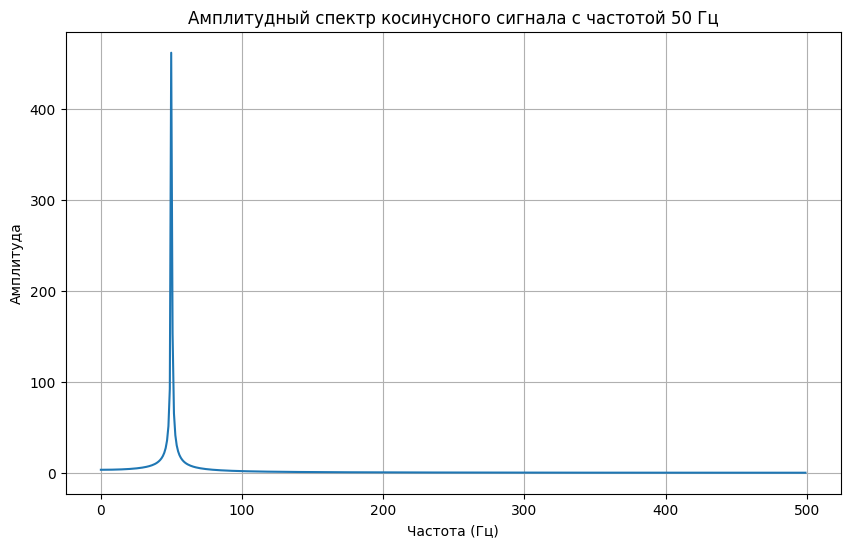

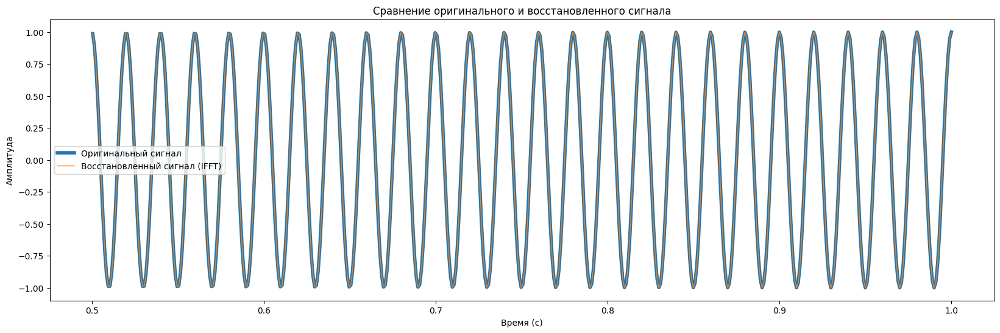

In [ ]:
def my_fft(signal):

    N = len(signal)
    if N <= 1:
        return signal

    arr1, arr2 = signal[::2], signal[1::2]

    arr1 = my_fft(arr1)
    arr2 = my_fft(arr2)

    T = []
    for i in range(N//2):
      T.append(np.exp(-2j * np.pi * i / N) * arr2[i])

    result = []

    for i in range(N//2):
      result.append(arr1[i]+T[i])
    for i in range(N//2):
      result.append(arr1[i]-T[i])

    return result

Fs = 1000
T = 1.0 / Fs
L = 1024
t = np.linspace(0, L * T, L)

f_cos = 50
signal = np.cos(2 * np.pi * f_cos * t)

# Время выполнения для DFT
start_time_my_fft = time.time()
my_fft_result = my_fft(signal)
end_time_my_fft = time.time()
my_fft_time = end_time_my_fft - start_time_my_fft

# Время выполннния для FFT
start_time_fft = time.time()
fft_result = fft(signal)
end_time_fft = time.time()
fft_time = end_time_fft - start_time_fft

print(my_fft_time, fft_time)

frequencies = np.fft.fftfreq(L, T)

plt.figure(figsize=(10, 6))
plt.plot(frequencies[:L//2], np.abs(fft_result)[:L//2])
plt.title('Амплитудный спектр косинусного сигнала с частотой 50 Гц')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')
plt.grid()
plt.show()

old_signal = ifft(my_fft_result).real

plt.figure(figsize=(20, 6))
plt.plot(t[500:1000], signal[500:1000], label="Оригинальный сигнал", linewidth=5)
plt.plot(t[500:1000], old_signal[500:1000], label="Восстановленный сигнал", linewidth=1)
plt.title('Сравнение оригинального и восстановленного сигнала')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')
plt.legend()
plt.show()

#Лабораторная работа 3

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
import math

from scipy.fftpack import fft, ifft, fftfreq
from scipy import signal

**Задание 1**

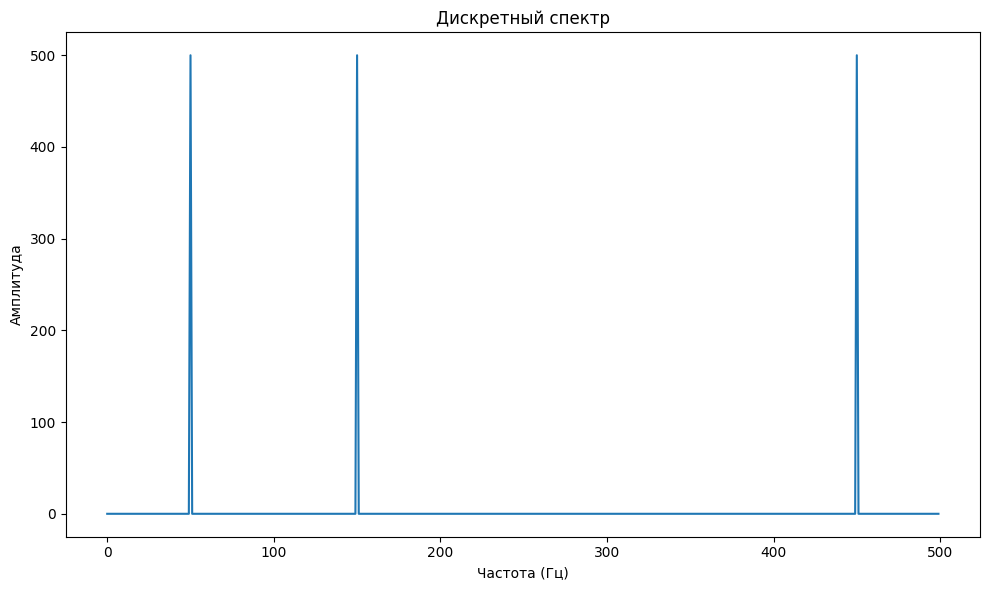

In [ ]:
Fs = 1000
T = 1 / Fs
L = 1000
t = np.linspace(0, L*T, L, endpoint=False)

f1 = 50
f2 = 150
f3 = 450
signal = np.cos(2 * np.pi * f1 * t) + np.cos(2 * np.pi * f2 * t) + np.cos(2 * np.pi * f3 * t)

def dft_fast(x):
    return fft(x)

fft_result = dft_fast(signal)

frequencies = fftfreq(L, T)

plt.figure(figsize=(10, 6))
plt.plot(frequencies[:L // 2], np.abs(fft_result)[:L // 2])
plt.title('Дискретный спектр')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')

plt.tight_layout()
plt.show()

**Задание 2**

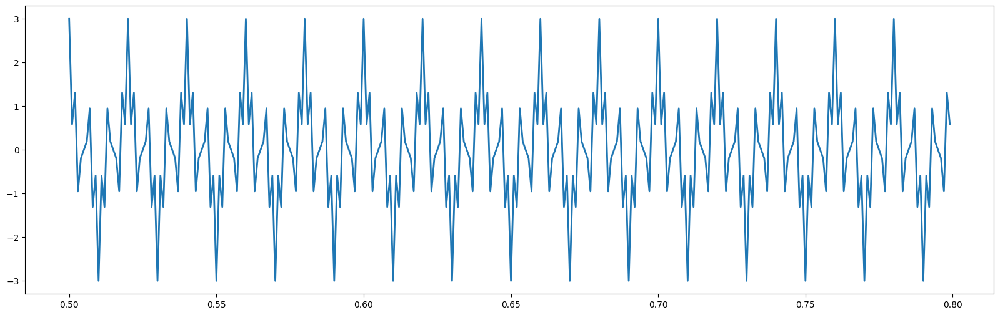

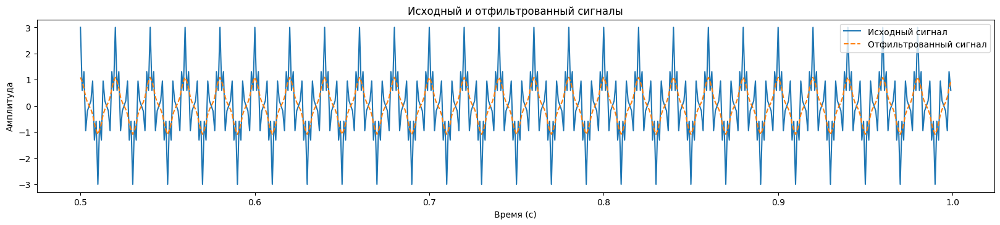

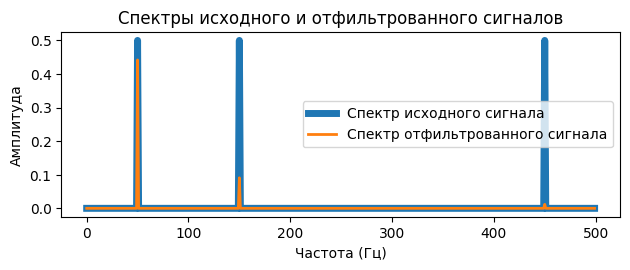

In [ ]:
def H(w,wc):
  return wc**2/(-(w**2) + 1j*np.sqrt(2)*w*wc + 1)

cutoff_freq = 70

wc = cutoff_freq
w = frequencies

H_w = H(w, wc)

filtered_fft_signal = fft_result * abs(H_w)

plt.figure(figsize=(20, 6))
plt.plot(t[500:800], signal[500:800], label="Оригинальный сигнал", linewidth=2)

filtered_signal = np.fft.ifft(filtered_fft_signal)

plt.figure(figsize=(20, 8))

plt.subplot(2, 1, 1)
plt.plot(t[500:1000], signal[500:1000], label='Исходный сигнал')
plt.plot(t[500:1000], np.real(filtered_signal)[500:1000], label='Отфильтрованный сигнал', linestyle='--')
plt.title('Исходный и отфильтрованный сигналы')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')
plt.legend()
plt.show()

fft_magnitude_original = np.abs(fft_result) / len(t)
fft_magnitude_filtered = np.abs(filtered_fft_signal) / len(t)

positive_freqs = frequencies[:len(frequencies)//2]
positive_magnitude_original = fft_magnitude_original[:len(fft_magnitude_original)//2]
positive_magnitude_filtered = fft_magnitude_filtered[:len(fft_magnitude_filtered)//2]

plt.subplot(2, 1, 2)
plt.plot(positive_freqs, positive_magnitude_original, label='Спектр исходного сигнала', linewidth = 5)
plt.plot(positive_freqs, positive_magnitude_filtered, label='Спектр отфильтрованного сигнала', linewidth = 2)
plt.title('Спектры исходного и отфильтрованного сигналов')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')
plt.legend()

plt.tight_layout()
plt.show()

**Задание 3**

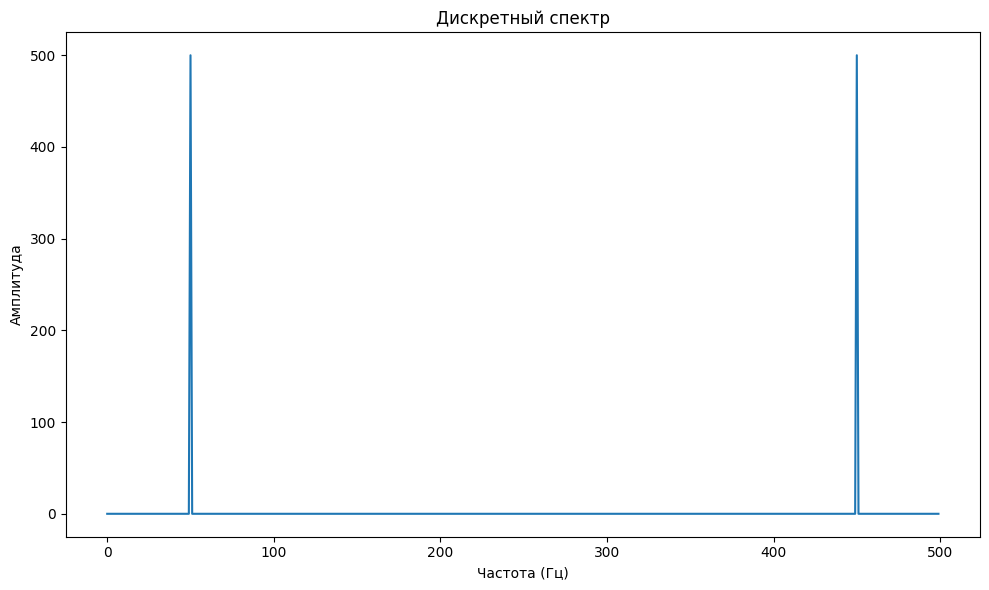

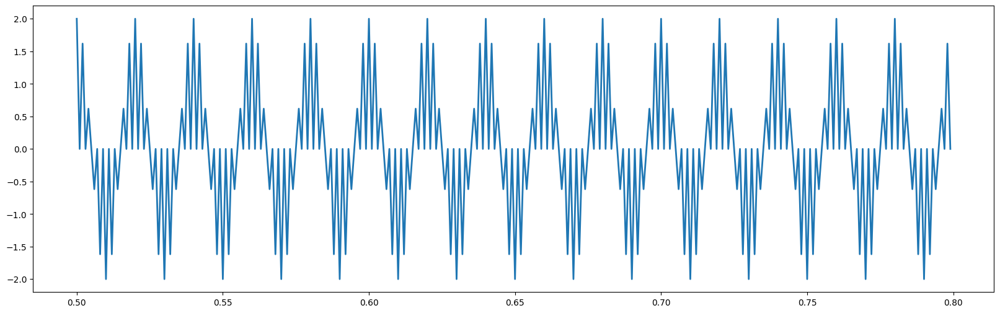

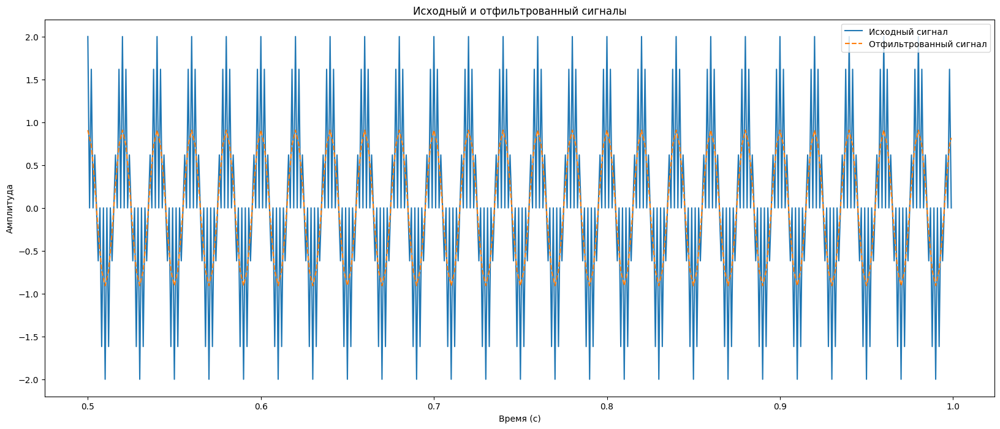

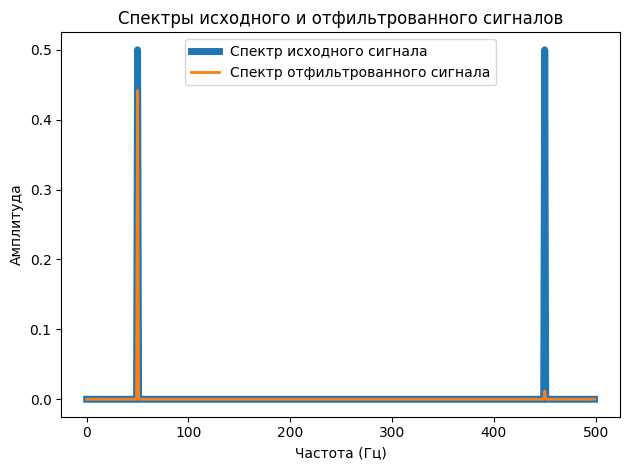

In [ ]:
Fs = 1000
T = 1 / Fs
L = 1000
t = np.linspace(0, L*T, L, endpoint=False)

f1 = 50
f2 = 150
f3 = 450
signal = np.cos(2 * np.pi * f1 * t) + np.cos(2 * np.pi * f3 * t)

def dft_fast(x):
    return fft(x)

fft_result = dft_fast(signal)

frequencies = fftfreq(L, T)

plt.figure(figsize=(10, 6))
plt.plot(frequencies[:L // 2], np.abs(fft_result)[:L // 2])
plt.title('Дискретный спектр')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')

plt.tight_layout()
plt.show()

def H(w,wc):
  return wc**2/(-(w**2) + 1j*np.sqrt(2)*w*wc + 1)

cutoff_freq = 70
wc = cutoff_freq
w = frequencies

H_w = H(w, wc)

filtered_fft_signal = fft_result * abs(H_w)

plt.figure(figsize=(20, 6))
plt.plot(t[500:800], signal[500:800], label="Оригинальный сигнал", linewidth=2)
plt.show()

filtered_signal = np.fft.ifft(filtered_fft_signal)

plt.figure(figsize=(20, 8))

plt.plot(t[500:1000], signal[500:1000], label='Исходный сигнал')
plt.plot(t[500:1000], np.real(filtered_signal)[500:1000], label='Отфильтрованный сигнал', linestyle='--')
plt.title('Исходный и отфильтрованный сигналы')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')
plt.legend()
plt.show()

fft_magnitude_original = np.abs(fft_result) / len(t)
fft_magnitude_filtered = np.abs(filtered_fft_signal) / len(t)

positive_freqs = frequencies[:len(frequencies)//2]
positive_magnitude_original = fft_magnitude_original[:len(fft_magnitude_original)//2]
positive_magnitude_filtered = fft_magnitude_filtered[:len(fft_magnitude_filtered)//2]

plt.plot(positive_freqs, positive_magnitude_original, label='Спектр исходного сигнала', linewidth = 5)
plt.plot(positive_freqs, positive_magnitude_filtered, label='Спектр отфильтрованного сигнала', linewidth = 2)
plt.title('Спектры исходного и отфильтрованного сигналов')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')
plt.legend()

plt.tight_layout()
plt.show()

**Задание 4**

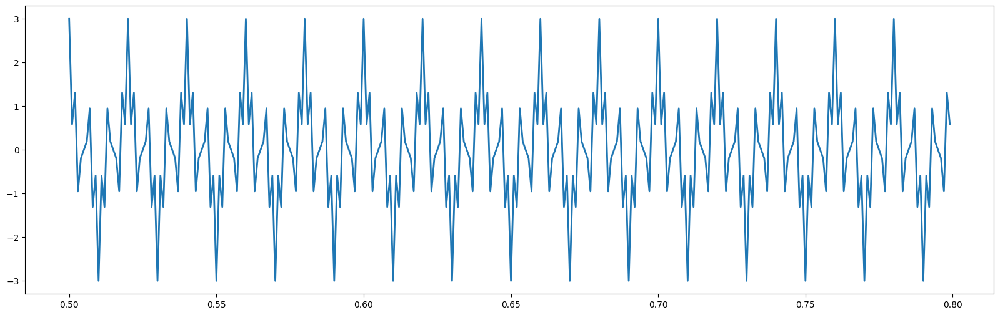

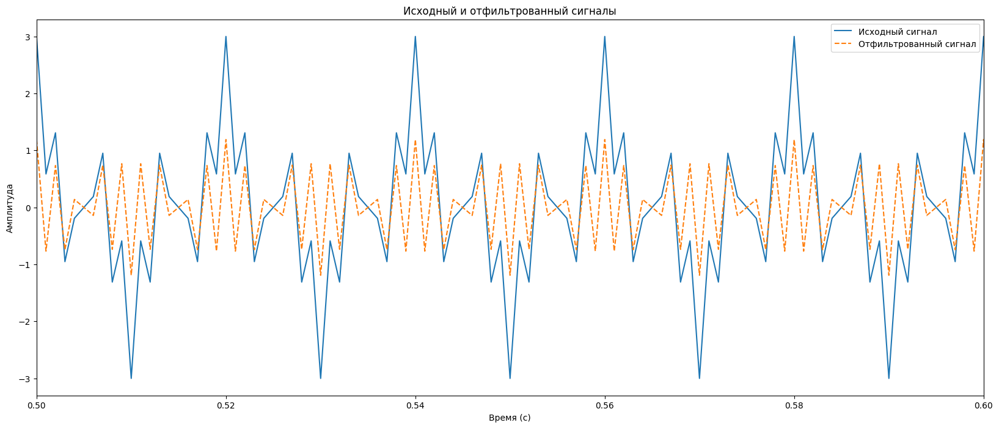

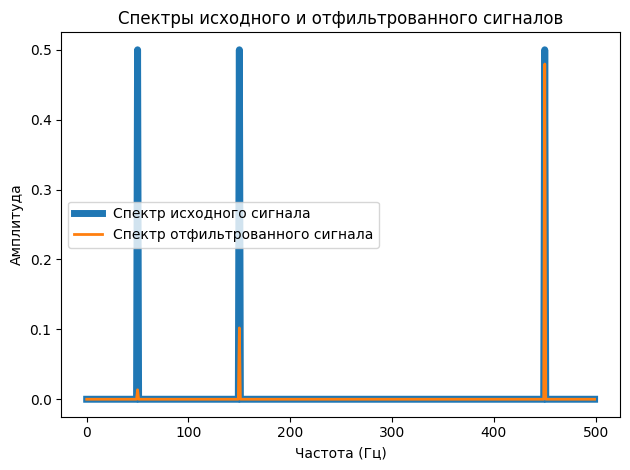

In [ ]:
Fs = 1000
T = 1 / Fs
L = 1000
t = np.linspace(0, L*T, L, endpoint=False)

f1 = 50
f2 = 150
f3 = 450
signal = np.cos(2 * np.pi * f1 * t)  + np.cos(2 * np.pi * f2 * t) + np.cos(2 * np.pi * f3 * t)

def dft_fast(x):
    return fft(x)

fft_result = dft_fast(signal)

frequencies = fftfreq(L, T)

def H(w,wc):
  return w**2/(-wc**2 + 1j*np.sqrt(2)*w*wc + 1)

cutoff_freq = 300
wc = cutoff_freq
w = frequencies

H_w = H(w, wc)

filtered_fft_signal = fft_result * abs(H_w)

plt.figure(figsize=(20, 6))
plt.plot(t[500:800], signal[500:800], label="Оригинальный сигнал", linewidth=2)
plt.show()

filtered_signal = np.fft.ifft(filtered_fft_signal)

plt.figure(figsize=(20, 8))

plt.plot(t[500:1000], signal[500:1000], label='Исходный сигнал')
plt.plot(t[500:1000], np.real(filtered_signal)[500:1000], label='Отфильтрованный сигнал', linestyle='--')
plt.title('Исходный и отфильтрованный сигналы')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')
plt.xlim(0.5, 0.6)
plt.legend()
plt.show()

fft_magnitude_original = np.abs(fft_result) / len(t)
fft_magnitude_filtered = np.abs(filtered_fft_signal) / len(t)

positive_freqs = frequencies[:len(frequencies)//2]
positive_magnitude_original = fft_magnitude_original[:len(fft_magnitude_original)//2]
positive_magnitude_filtered = fft_magnitude_filtered[:len(fft_magnitude_filtered)//2]

plt.plot(positive_freqs, positive_magnitude_original, label='Спектр исходного сигнала', linewidth = 5)
plt.plot(positive_freqs, positive_magnitude_filtered, label='Спектр отфильтрованного сигнала', linewidth = 2)
plt.title('Спектры исходного и отфильтрованного сигналов')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')
plt.legend()

plt.tight_layout()
plt.show()

**Задание 5**

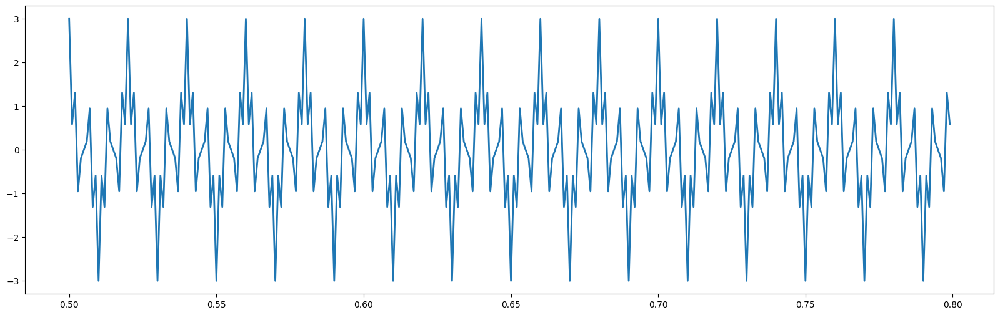

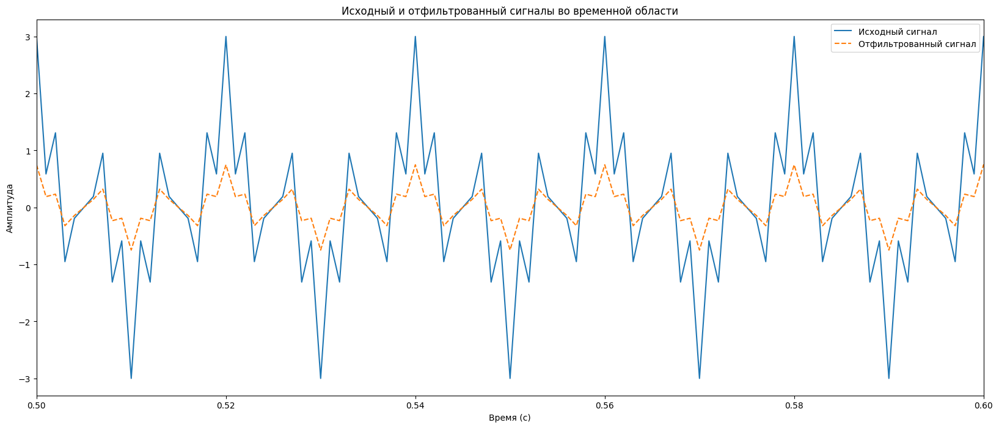

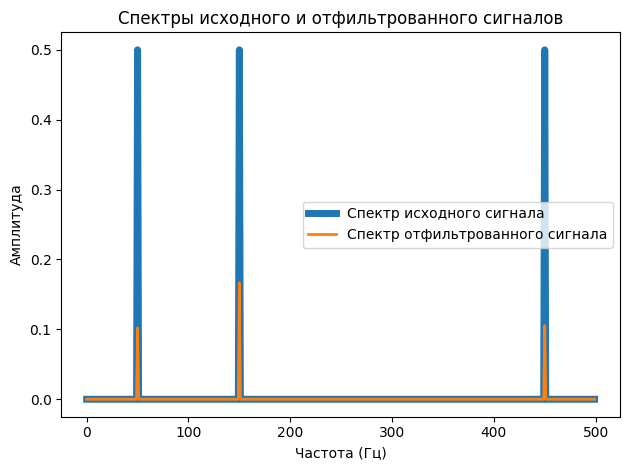

In [ ]:
def H_low(w,wc):
  return wc**2/(-(w**2) + 1j*np.sqrt(2)*w*wc + 1)

def H_high(w,wc):
  return w**2/(-(wc**2) + 1j*np.sqrt(2)*w*wc + 1)

def PF(w, wc):
  return abs(H_low(w, wc-delta_low))*abs(H_high(w,wc+delta_high))

Fs = 1000
T = 1 / Fs
L = 1000
t = np.linspace(0, L*T, L, endpoint=False)

f1 = 50
f2 = 150
f3 = 450
signal = np.cos(2 * np.pi * f1 * t)  + np.cos(2 * np.pi * f2 * t) + np.cos(2 * np.pi * f3 * t)

def dft_fast(x):
    return fft(x)

fft_result = dft_fast(signal)

frequencies = fftfreq(L, T)

cutoff_freq = 150
delta_high = 10
delta_low = -10
wc = np.pi * cutoff_freq
w = np.pi * frequencies

H_pf = PF(w, wc)

filtered_fft_signal = fft_result * H_pf

plt.figure(figsize=(20, 6))
plt.plot(t[500:800], signal[500:800], label="Оригинальный сигнал", linewidth=2)
plt.show()

filtered_signal = np.fft.ifft(filtered_fft_signal)

plt.figure(figsize=(20, 8))

plt.plot(t[500:1000], signal[500:1000], label='Исходный сигнал')
plt.plot(t[500:1000], np.real(filtered_signal)[500:1000], label='Отфильтрованный сигнал', linestyle='--')
plt.title('Исходный и отфильтрованный сигналы во временной области')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')
plt.xlim(0.5, 0.6)
plt.legend()
plt.show()

fft_magnitude_original = np.abs(fft_result) / len(t)
fft_magnitude_filtered = np.abs(filtered_fft_signal) / len(t)

positive_freqs = frequencies[:len(frequencies)//2]
positive_magnitude_original = fft_magnitude_original[:len(fft_magnitude_original)//2]
positive_magnitude_filtered = fft_magnitude_filtered[:len(fft_magnitude_filtered)//2]

plt.plot(positive_freqs, positive_magnitude_original, label='Спектр исходного сигнала', linewidth = 5)
plt.plot(positive_freqs, positive_magnitude_filtered, label='Спектр отфильтрованного сигнала', linewidth = 2)
plt.title('Спектры исходного и отфильтрованного сигналов')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')
plt.legend()

plt.tight_layout()
plt.show()

**Задание 6**

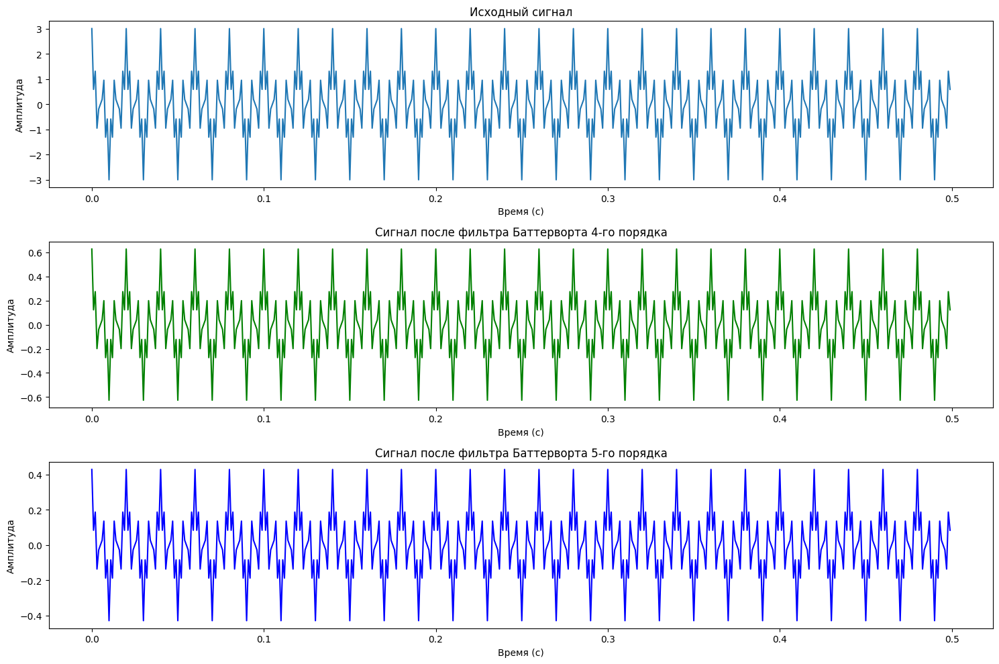

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

Fs = 1000
T = 1 / Fs
L = 1000
t = np.linspace(0, L*T, L, endpoint=False)

f1 = 50
f2 = 150
f3 = 450
signal = np.cos(2 * np.pi * f1 * t) + np.cos(2 * np.pi * f2 * t) + np.cos(2 * np.pi * f3 * t)

cutoff_freq = 100
wc = 2 * np.pi * cutoff_freq

def butterworth_poles(n, wc):
    poles = []
    for k in range(1, n + 1):
        pole = wc * np.exp(1j * (np.pi * (2 * k + n - 1) / (2 * n)))
        poles.append(pole)
    return np.array(poles)

def bilinear_transform(poles, wc, T):
    z_poles = []
    for pole in poles:
        z_p = (2 / T) * (1 - pole) / (1 + pole)
        z_poles.append(z_p)
    return np.array(z_poles)

def apply_butterworth_filter(signal, poles, wc, T):
    s = np.fft.fft(signal)
    filtered_signal_fft = np.copy(s)
    for p in poles:
        filtered_signal_fft /= (1 - p * T)
    return np.real(np.fft.ifft(filtered_signal_fft))

poles_4 = butterworth_poles(4, wc)
poles_5 = butterworth_poles(5, wc)

filtered_signal_4 = apply_butterworth_filter(signal, poles_4, wc, T)
filtered_signal_5 = apply_butterworth_filter(signal, poles_5, wc, T)

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
plt.plot(t[:500], signal[:500], label='Исходный сигнал')
plt.title('Исходный сигнал')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')

plt.subplot(3, 1, 2)
plt.plot(t[:500], filtered_signal_4[:500], label='Фильтр 4-го порядка', color='green')
plt.title('Сигнал после фильтра Баттерворта 4-го порядка')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')

plt.subplot(3, 1, 3)
plt.plot(t[:500], filtered_signal_5[:500], label='Фильтр 5-го порядка', color='blue')
plt.title('Сигнал после фильтра Баттерворта 5-го порядка')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')

plt.tight_layout()
plt.show()

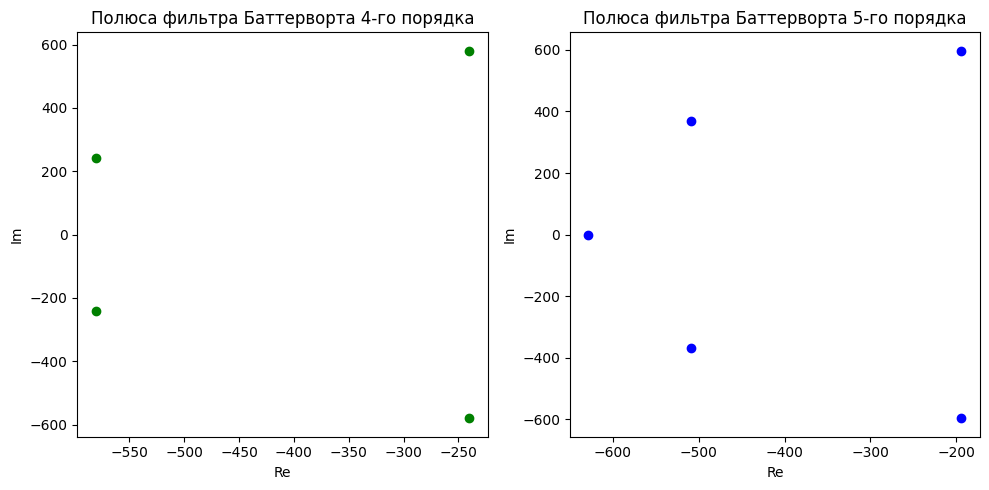

In [ ]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.scatter(np.real(poles_4), np.imag(poles_4), label='Полюса фильтра 4-го порядка', color='green')
plt.title('Полюса фильтра Баттерворта 4-го порядка')
plt.xlabel('Re')
plt.ylabel('Im')

plt.subplot(1, 2, 2)
plt.scatter(np.real(poles_5), np.imag(poles_5), label='Полюса фильтра 5-го порядка', color='blue')
plt.title('Полюса фильтра Баттерворта 5-го порядка')
plt.xlabel('Re')
plt.ylabel('Im')

plt.tight_layout()
plt.show()


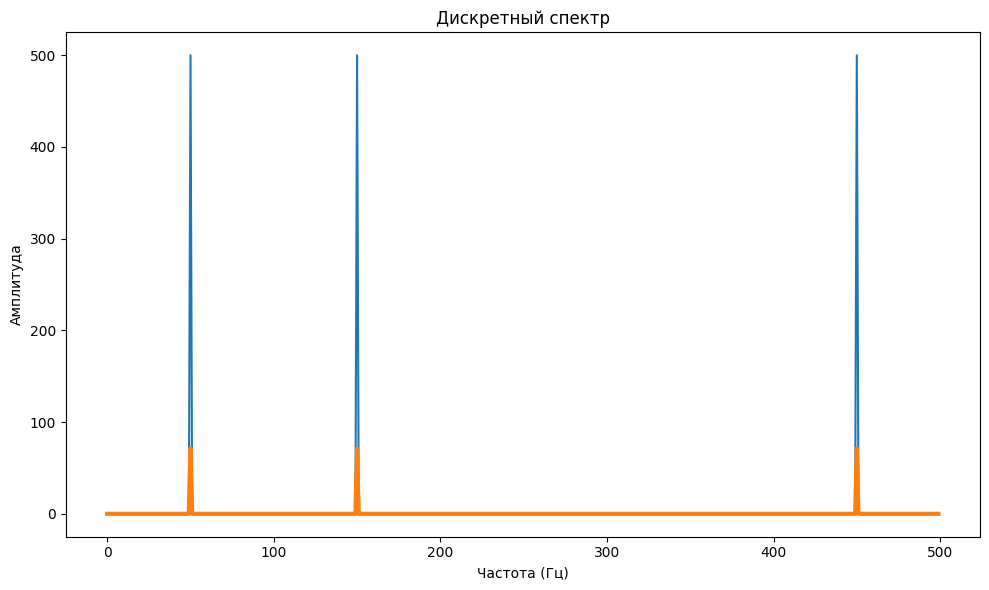

In [ ]:
Fs = 1000
T = 1 / Fs
L = 1000
t = np.linspace(0, L*T, L, endpoint=False)

f1 = 50
f2 = 150
f3 = 450
signal = np.cos(2 * np.pi * f1 * t) + np.cos(2 * np.pi * f2 * t) + np.cos(2 * np.pi * f3 * t)

def dft_fast(x):
    return fft(x)

fft_result = dft_fast(signal)
fft_result_5 = dft_fast(filtered_signal_5)

frequencies = fftfreq(L, T)

plt.figure(figsize=(10, 6))
plt.plot(frequencies[:L // 2], np.abs(fft_result)[:L // 2])
plt.plot(frequencies[:L // 2], np.abs(fft_result_5)[:L // 2], linewidth = 3)
plt.title('Дискретный спектр')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')

plt.tight_layout()
plt.show()

Задание 7

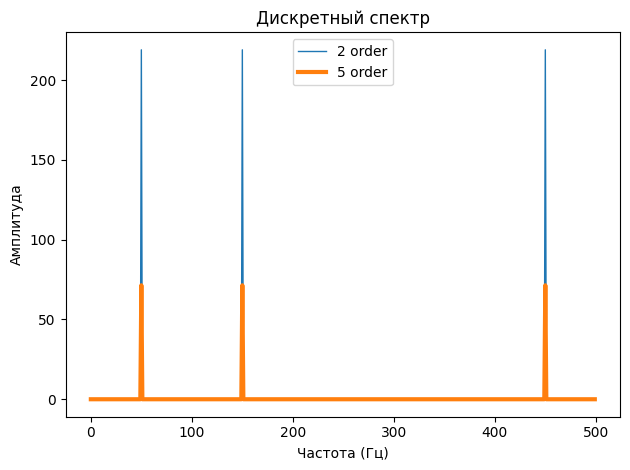

Text(0, 0.5, 'Амплитуда')

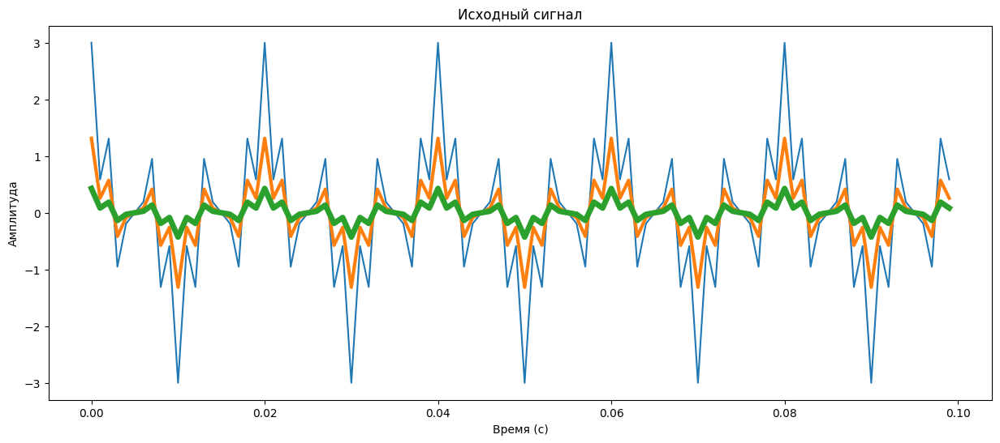

In [ ]:
poles_2 = butterworth_poles(2, wc)

filtered_signal_2 = apply_butterworth_filter(signal, poles_2, wc, T)

fft_result_2 = dft_fast(filtered_signal_2)

plt.plot(frequencies[:L // 2], np.abs(fft_result_2)[:L // 2], linewidth = 1, label = '2 order')
plt.plot(frequencies[:L // 2], np.abs(fft_result_5)[:L // 2],linewidth = 3, label = '5 order')
plt.title('Дискретный спектр')
plt.xlabel('Частота (Гц)')
plt.ylabel('Амплитуда')

plt.legend()
plt.tight_layout()
plt.show()


plt.figure(figsize=(15, 6))

plt.plot(t[:100], signal[:100], label='Исходный сигнал')
plt.plot(t[:100], filtered_signal_2[:100], label='Фильтр 2-го порядка', linewidth = 3)
plt.plot(t[:100], filtered_signal_5[:100], label='Фильтр 2-го порядка', linewidth = 5)

plt.title('Исходный сигнал')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')


Задание 8

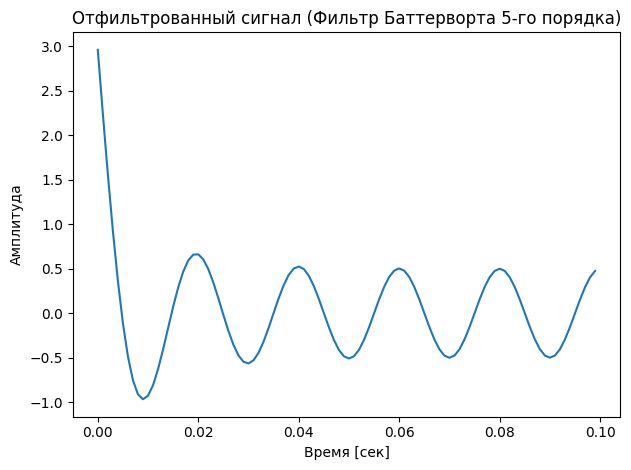

In [ ]:
from scipy.signal import butter, filtfilt

fs = 1000
t = np.linspace(0, 1, fs, endpoint=False)
f1, f2, f3 = 50, 150, 450

signal = np.cos(2 * np.pi * f1 * t) + np.cos(2 * np.pi * f2 * t) + np.cos(2 * np.pi * f3 * t)

order = 5
cutoff = 100
b, a = butter(order, cutoff / fs, btype='low')

filtered_signal_np = filtfilt(b, a, signal)

plt.plot(t[:100], filtered_signal_np[:100])
#plt.plot(t[:100], filtered_signal_5[:100])
plt.title('Отфильтрованный сигнал (Фильтр Баттерворта 5-го порядка)')
plt.xlabel('Время [сек]')
plt.ylabel('Амплитуда')

plt.tight_layout()
plt.show()


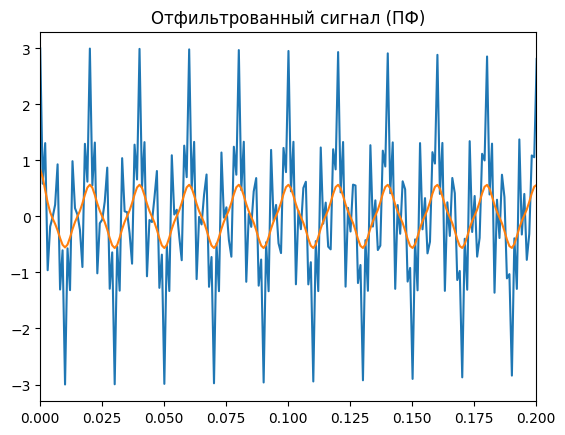

In [ ]:
def butterworth_poles(order):
    poles = []
    for k in range(order):
        theta = (2 * k + 1) * np.pi / (2 * order)
        pole = np.exp(1j * (theta + np.pi / 2))
        poles.append(pole)
    return np.array(poles)

def butterworth_transfer_function(poles, s):
    H_s = 1
    for p in poles:
        H_s /= (s - p)
    return H_s

def custom_butterworth(w, n, wc=100):
    poles = butterworth_poles(n)
    H_f = []

    for omega in w:
        s = 1j * (omega / wc)
        H_s = butterworth_transfer_function(poles, s)
        H_f.append(np.abs(H_s))

    H_f = np.array(H_f) / np.max(H_f)

    return np.real(H_f)

def my_signal(x):
  return np.cos(2*math.pi*50*x) + np.cos(2*math.pi*150*x) + np.cos(2*math.pi*450*x)

N = 1000
fmax = 1000
T = 1.0 / fmax
t = np.linspace(0.0, N * T, N)
signal = my_signal(x)

yff = fft(signal)

freq = np.fft.fftfreq(len(t), T)
freq = np.arange(len(t))

yff_filtered = yff * np.abs(custom_butterworth(freq,5))

filtered_signal = np.fft.ifft(yff_filtered).real
plt.plot(t, signal)
#plt.plot(x, filtered_signal_np)
plt.title("Исходный сигнал")
plt.grid()

plt.plot(t, filtered_signal)
plt.xlim((0, 0.2))
plt.title("Отфильтрованный сигнал (ПФ)")
plt.grid()
plt.show()

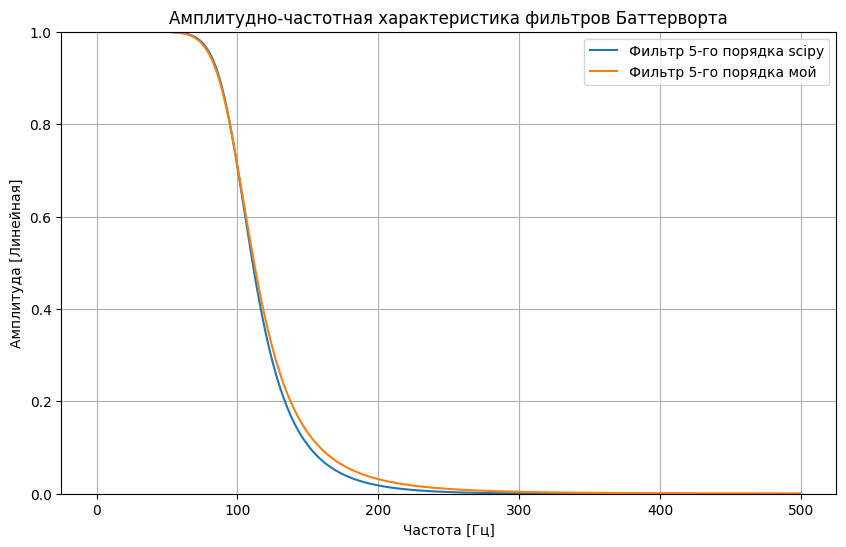

In [ ]:
from scipy.signal import butter, freqz

Fs = 1000
cutoff_freq = 100
order_5 = 5

nyquist_freq = Fs / 2
normalized_cutoff = cutoff_freq / nyquist_freq
xf = np.linspace(0, nyquist_freq, N // 2)

b_5, a_5 = butter(order_5, normalized_cutoff, btype='low', analog=False)

w_5, h_5 = freqz(b_5, a_5, worN=1024)

plt.figure(figsize=(10, 6))

plt.plot(w_5 * nyquist_freq / np.pi, np.abs(h_5), label='Фильтр 5-го порядка scipy')
plt.plot(xf,np.abs(custom_butterworth(freq,5)[0:N//2]), label='Фильтр 5-го порядка мой')

plt.title('Амплитудно-частотная характеристика фильтров Баттерворта')
plt.xlabel('Частота [Гц]')
plt.ylabel('Амплитуда [Линейная]')
plt.grid()
plt.ylim(0, 1)
plt.legend()

plt.show()


Задание 9

<ipython-input-15-8a0d22e71080>:55: ComplexWarning: Casting complex values to real discards the imaginary part
  output[n] -= a[j] * output[n - j]


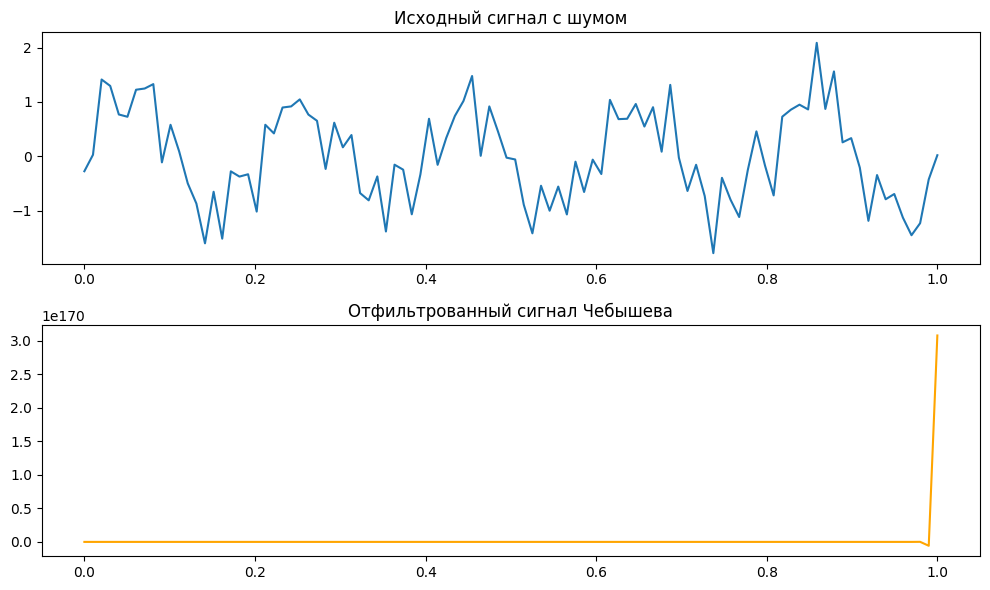

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Функция для вычисления полюсов фильтра Чебышева 1-го рода
def chebyshev1_poles(order, ripple, cutoff_freq, fs):
    # Нормализуем частоту среза
    Wn = 2 * np.pi * cutoff_freq / fs
    # Риппл в линейной шкале
    epsilon = np.sqrt(10**(0.1 * ripple) - 1)
    k = np.sinh(np.arcsinh(1 / epsilon) / order)

    # Полюса фильтра
    poles = []
    for i in range(order):
        angle = (2 * i + 1) * np.pi / (2 * order)
        real_part = -k * np.sin(angle)
        imag_part = k * np.cos(angle)
        poles.append(complex(real_part, imag_part))

    return poles

# Функция для вычисления коэффициентов фильтра
def chebyshev1_coeffs(order, ripple, cutoff_freq, fs):
    poles = chebyshev1_poles(order, ripple, cutoff_freq, fs)

    # Нули для ФНЧ фильтра Чебышева 1-го рода (все на нулевой частоте)
    zeros = [0] * order

    # Сначала получим коэффициенты полинома для числителя (b) и знаменателя (a)
    b = [1]
    a = [1]

    # Сводим полиномы по полюсам (суммируем их рекурсивно)
    for pole in poles:
        a = np.convolve(a, [1, -pole])

    # Нормализуем коэффициенты
    gain = np.abs(np.polyval(a, 0))  # Нормализуем по величине на нулевой частоте
    a = [coef / gain for coef in a]

    return b, a

# Функция для фильтрации сигнала
def chebyshev1_filter(signal, b, a):
    # Фильтрация с использованием рекуррентного фильтра
    output = np.zeros_like(signal)
    for n in range(len(signal)):
        output[n] = b[0] * signal[n]
        for i in range(1, len(b)):
            if n - i >= 0:
                output[n] += b[i] * signal[n - i]

        for j in range(1, len(a)):
            if n - j >= 0:
                output[n] -= a[j] * output[n - j]

    return output

# Параметры фильтра
order = 4           # Порядок фильтра
ripple = 1          # Затухание в децибелах
cutoff_freq = 10    # Частота среза, Гц
fs = 100            # Частота дискретизации, Гц

# Генерация тестового сигнала (сигнал с шумом)
t = np.linspace(0, 1, fs)
signal = np.sin(2 * np.pi * 5 * t) + 0.5 * np.random.randn(len(t))

# Вычисление коэффициентов фильтра
b, a = chebyshev1_coeffs(order, ripple, cutoff_freq, fs)

# Применение фильтрации
filtered_signal = chebyshev1_filter(signal, b, a)

# Визуализация результатов
plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 1)
plt.plot(t, signal, label='Исходный сигнал')
plt.title('Исходный сигнал с шумом')
plt.subplot(2, 1, 2)
plt.plot(t, filtered_signal, label='Отфильтрованный сигнал', color='orange')
plt.title('Отфильтрованный сигнал Чебышева')
plt.tight_layout()
plt.show()


#Лабораторная работа 4

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft, ifft, fftfreq, ifftshift
from scipy import signal

*Задание 1*

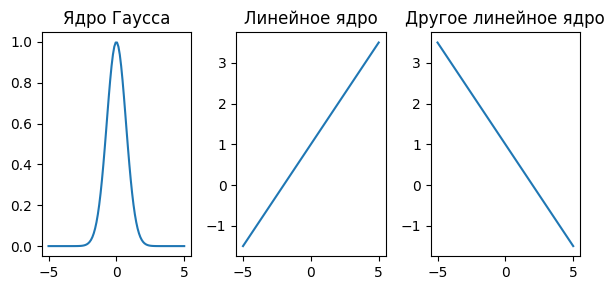

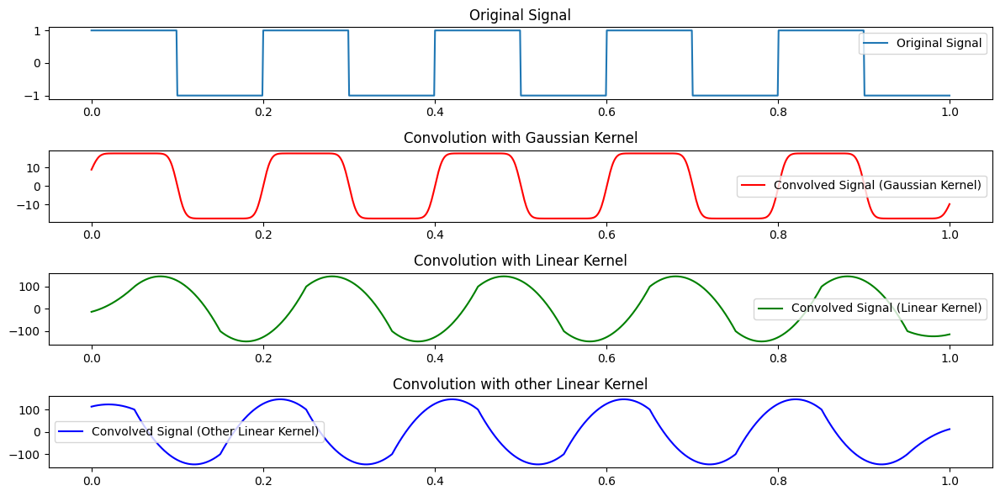

In [ ]:
Fs = 1000
T = 1 / 5
L = 1000
t = np.linspace(0, L * (1 / Fs), L)

rec_signal = np.where(np.mod(t, T) < T / 2, 1, -1)

A = 1
x = np.linspace(-5, 5, 100)
kernel_gauss = A * np.exp(-x**2)

a = 0.5
b = 1
kernel_linear = a * x + b

not_kernel_linear = -a * x + b

convolved_gauss_np = np.convolve(rec_signal, kernel_gauss, mode='same')
convolved_linear_np = np.convolve(rec_signal, kernel_linear, mode='same')
convolved_not_linear_np = np.convolve(rec_signal, not_kernel_linear, mode='same')

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(6, 3))

ax1.plot(x, kernel_gauss)
ax1.set_title("Ядро Гаусса")

ax2.plot(x, kernel_linear)
ax2.set_title("Линейное ядро")

ax3.plot(x, not_kernel_linear)
ax3.set_title('Другое линейное ядро')

plt.tight_layout()
plt.show()


plt.figure(figsize=(12, 6))

plt.subplot(4, 1, 1)
plt.plot(t, rec_signal, label="Original Signal")
plt.title("Original Signal")
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(t, convolved_gauss_np, label="Convolved Signal (Gaussian Kernel)", color='red')
plt.title("Convolution with Gaussian Kernel")
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(t, convolved_linear_np, label="Convolved Signal (Linear Kernel)", color='green')
plt.title("Convolution with Linear Kernel")
plt.legend()

plt.subplot(4,1,4)
plt.plot(t, convolved_not_linear_np, label="Convolved Signal (Other Linear Kernel)", color='blue')
plt.title("Convolution with other Linear Kernel")
plt.legend()


plt.tight_layout()
plt.show()


*Задание 2*

In [ ]:
def my_conv(a, b):
    n = len(a)
    m = len(b)
    M = n + m - 1
    res = []

    final_len = max(n, m)
    start = (M - final_len)//2 + 1
    end = M - start + 1

    for i in range(M):
        summ = 0
        for j in range(m):
            if 0 <= i - j < n:
                summ += a[i - j] * b[j]
        res.append(summ)

    return res[start:end]

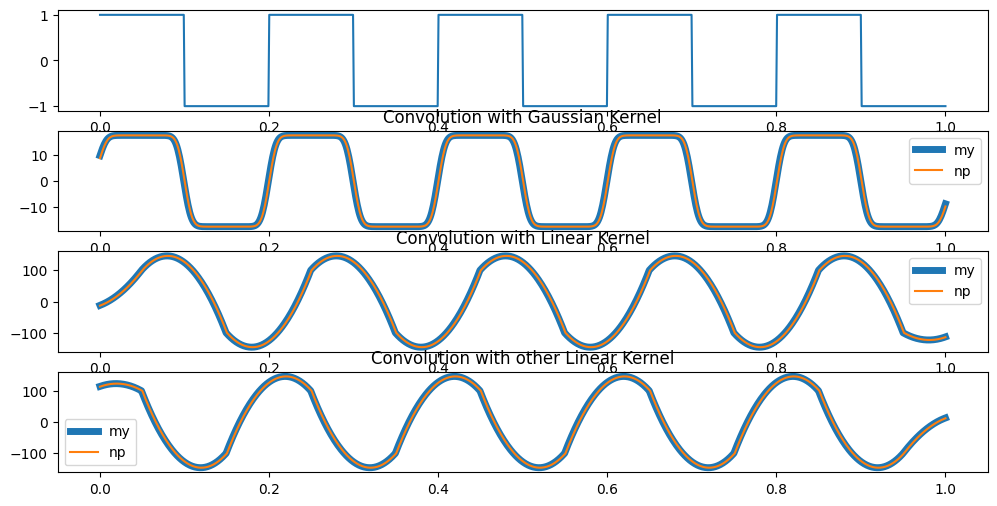

In [ ]:
Fs = 1000
T = 1 / 5
L = 1000
t = np.linspace(0, L * (1 / Fs), L)

rec_signal = np.where(np.mod(t, T) < T / 2, 1, -1)

A = 1
x = np.linspace(-5, 5, 100)
kernel_gauss = A * np.exp(-x**2)

a = 0.5
b = 1
kernel_linear = a * x + b

convolved_gauss = my_conv(rec_signal, kernel_gauss)
convolved_linear = my_conv(rec_signal, kernel_linear)
convolved_not_linear = my_conv(rec_signal, not_kernel_linear)

plt.figure(figsize = (12, 6))

plt.subplot(4,1,1)
plt.plot(t, rec_signal)

plt.subplot(4,1,2)
plt.plot(t, convolved_gauss, label = 'my', linewidth = 5)
plt.plot(t, convolved_gauss_np, label = 'np')
plt.title("Convolution with Gaussian Kernel")
plt.legend()

plt.subplot(4,1,3)
plt.plot(t, convolved_linear, label = 'my', linewidth = 5)
plt.plot(t, convolved_linear_np, label = 'np')
plt.title("Convolution with Linear Kernel")
plt.legend()

plt.subplot(4,1,4)
plt.plot(t, convolved_not_linear, label = 'my', linewidth = 5)
plt.plot(t, convolved_not_linear_np, label = 'np')
plt.title("Convolution with other Linear Kernel")
plt.legend()


plt.show()

*Задание 3*

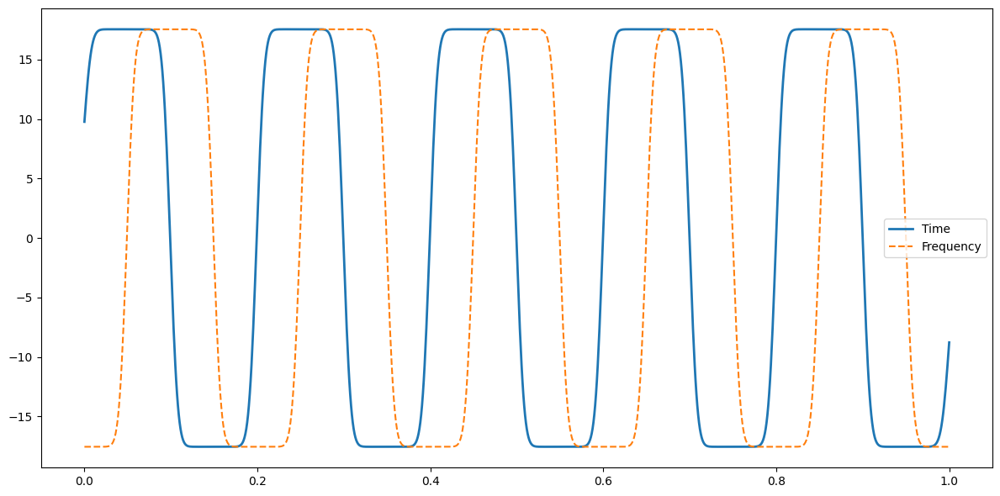

In [ ]:
rec_signal_fft = fft(rec_signal)

kernel_gauss_fft = fft(kernel_gauss, n=L)
product_freq = rec_signal_fft * kernel_gauss_fft
convolved_freq = ifft(product_freq)

plt.figure(figsize=(12, 6))

plt.plot(t, convolved_gauss, label="Time", linewidth=2)
plt.plot(t, np.real(convolved_freq), label="Frequency", linestyle='--')
plt.legend()

plt.tight_layout()
plt.show()

**Задание 4**

In [ ]:
def get_impulse(a=0.0, b=20.0, A=1, period=7.5, fc = 10_000, noise=None):
    t = np.linspace(a, b, fc)
    signal = np.array([(A if ti % (period * 2) >= period else 0) for ti in t])
    if noise:
        for i in range(len(signal)):
            signal[i] += (np.random.rand() * noise)
    return t, signal

In [ ]:
def get_cos_singal(f=[50,150,450], fs=10000, A=2.0, a=-1, b=1, noise=None):
    t = np.linspace(a, b, fs)
    omegas = [2 * np.pi * f_curr for f_curr in f]
    x_cos = np.sum([A * np.cos(omega * t) for omega in omegas], axis=0)
    if noise:
        for i in range(len(x_cos)):
            x_cos[i] += (np.random.rand() * noise)
    return x_cos

In [ ]:
def my_conv(signal, core):
        c = np.ones(max(len(signal), len(core)))
        for i in range(len(c)):
            for k in range(len(core)):
                c[i] += signal[i - k] * core[k]
        return c / sum(core)

def core_of_gausse(x, alpha = 0):
        N = len(x)
        y = np.zeros(N)
        M = (N - 1) /2
        for k in range(N):
            y[k] = np.exp(-0.5 * ((k - M)/(alpha * M))**2)
        return y

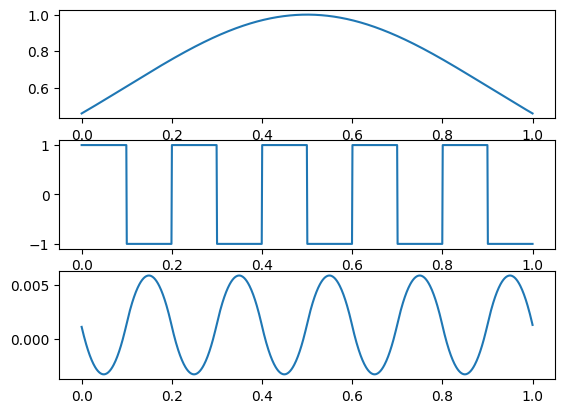

In [ ]:
rec_signal = np.where(np.mod(t, T) < T / 2, 1, -1)
frequencies = fftfreq(len(rec_signal), d=t[1] - t[0])

gaus = core_of_gausse(t, 0.8)

plt.subplot(3, 1, 1)
plt.plot(t, gaus)

plt.subplot(3, 1, 2)
plt.plot(t, rec_signal)
plt.subplot(3, 1, 3)
plt.plot(t, my_conv(rec_signal, gaus))

*Задание 5*

/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


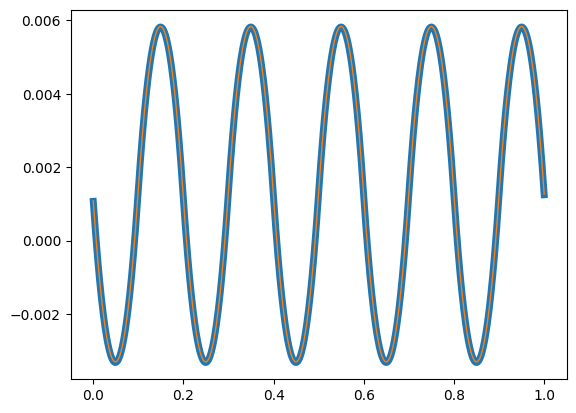

In [ ]:
kernel = core_of_gausse(t, 0.8)
rec_signal_fft = np.fft.fft(rec_signal)
kernel_fft = np.fft.fft(kernel)
multiply_fft = (rec_signal_fft * kernel_fft)
rec_signal_ifft = np.fft.ifft(multiply_fft)

plt.plot(t, rec_signal_ifft/sum(kernel)+0.00125, linewidth = 5)
plt.plot(t, my_conv(rec_signal, gaus), linewidth = 1)
plt.show()

Text(0, 0.5, 'Амплитуда')

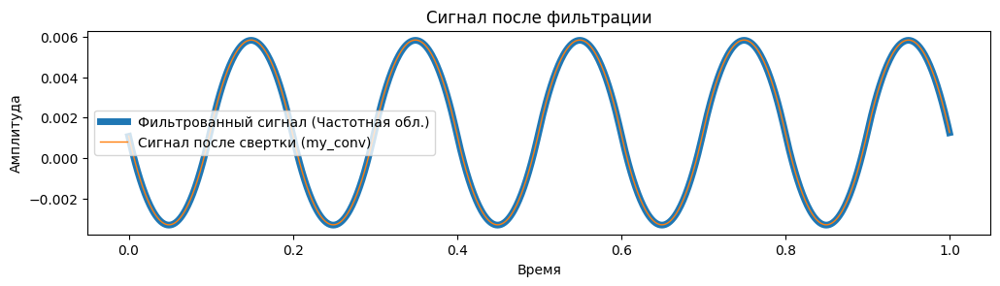

In [ ]:
sampling_rate = 1000
t = np.linspace(0, 1, sampling_rate)

kernel = core_of_gausse(t, 0.8)
rec_signal_fft = np.fft.fft(rec_signal)
kernel_fft = np.fft.fft(kernel)

multiply_fft = rec_signal_fft * kernel_fft
rec_signal_ifft = np.fft.ifft(multiply_fft)

plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(t, rec_signal_ifft.real / sum(kernel) + 0.00125, linewidth=5, label="Фильтрованный сигнал (Частотная обл.)")
plt.plot(t, my_conv(rec_signal, kernel), linewidth=1, label="Сигнал после свертки (my_conv)")
plt.legend()
plt.title("Сигнал после фильтрации")
plt.xlabel("Время")
plt.ylabel("Амплитуда")

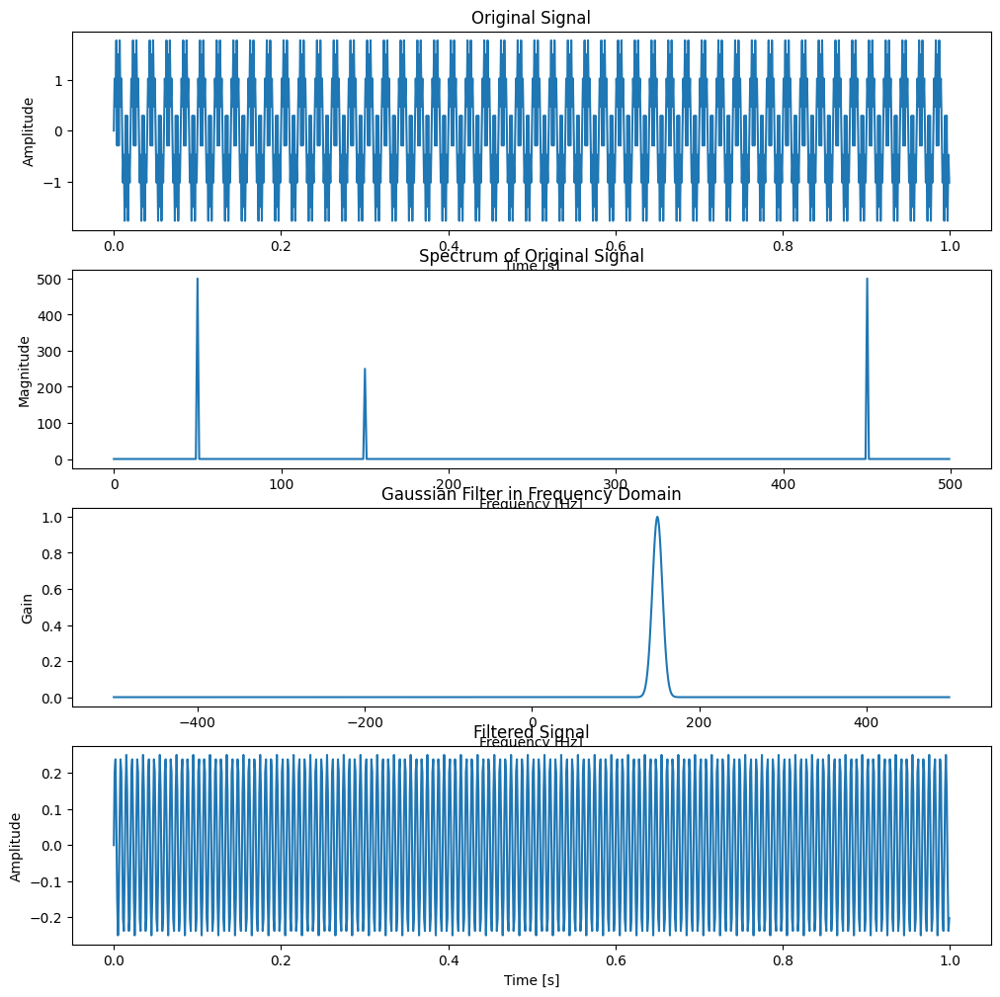

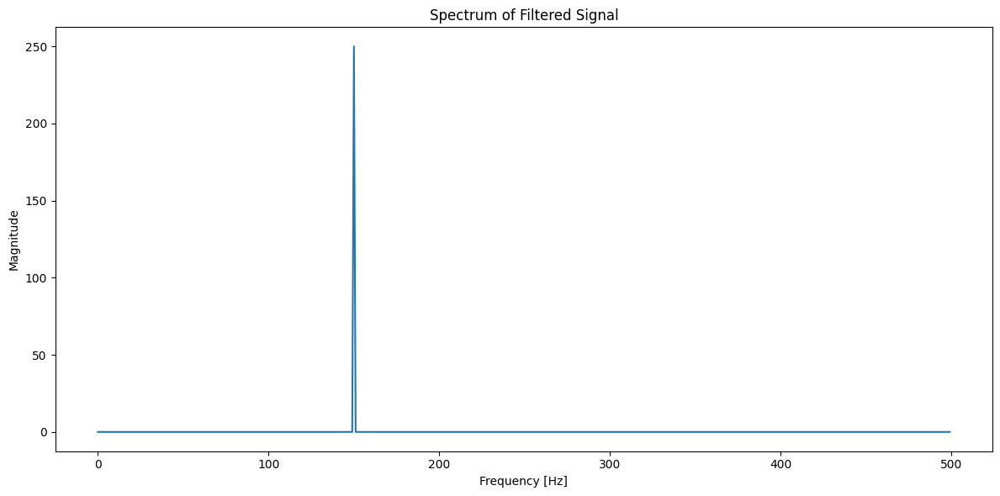

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

duration = 1.0
sampling_rate = 1000
t = np.linspace(0, duration, int(sampling_rate * duration), endpoint=False)

# Создание сигнала
signal = np.sin(2 * np.pi * 50 * t) + 0.5 * np.sin(2 * np.pi * 150 * t) + np.sin(2 * np.pi * 450 * t)

# Определение гауссовского фильтра



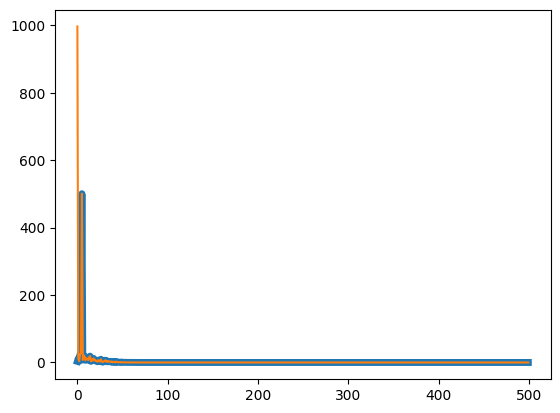

In [ ]:
freqs = np.fft.fftfreq(len(t), 1 / sampling_rate)

plt.plot(freqs[:len(freqs)//2], np.abs(multiply_fft)[:len(freqs)//2], linewidth = 5)
plt.plot(freqs[:len(freqs)//2], np.abs(np.fft.fft(my_conv(rec_signal, kernel))[:len(freqs)//2]))

In [ ]:
def gaussian_kernel(h, p, w):
    s = w * (2 * np.pi - 1) / (4 * np.pi)
    g = np.exp(-5 * ((h - p) / s) ** 2)
    return g

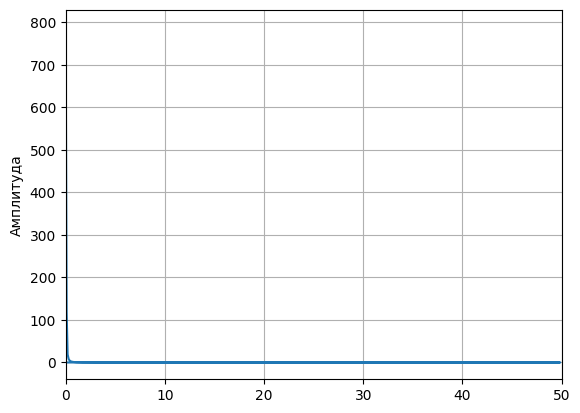

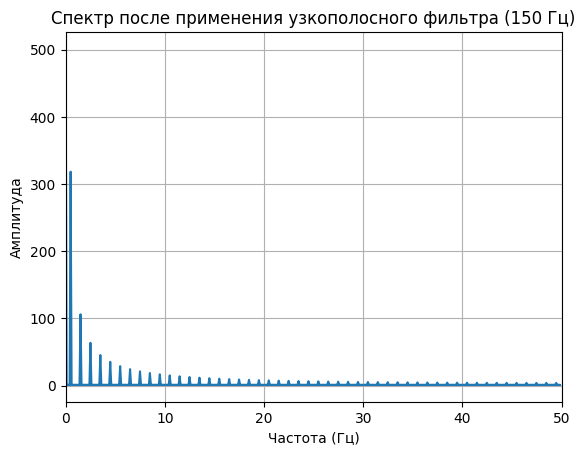

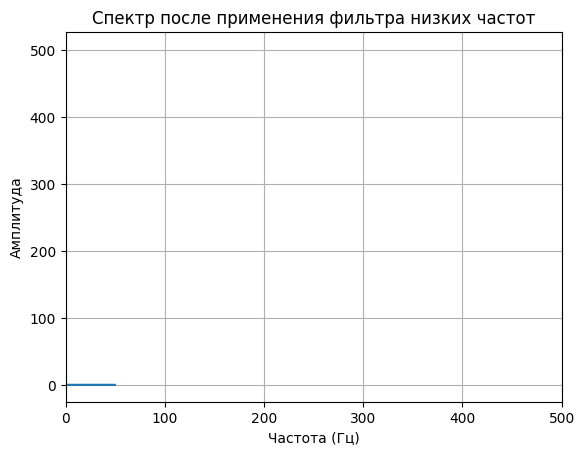

In [ ]:
# gaus_fft = np.fft.fft(gaus)
# x_impuls_fft = np.fft.fft(x_impuls)
# x_conv_fft = np.fft.fft(my_conv(x_impuls, gaus))
# freqs = np.fft.fftfreq(len(t), d=t[1] - t[0])

# plt.plot(freqs[:fc//2], np.abs(gaus_fft)[:fc//2], label='Оригинальный сигнал')
# plt.xlim(0, 50)
# plt.ylabel('Амплитуда')
# plt.grid()
# plt.show()

# plt.plot(freqs[:fc//2], np.abs(x_impuls_fft)[:fc//2], label='После узкополосного фильтра (150 Гц)')
# plt.title('Спектр после применения узкополосного фильтра (150 Гц)')
# plt.xlabel('Частота (Гц)')
# plt.xlim(0, 50)
# plt.ylabel('Амплитуда')
# plt.grid()
# plt.show()

# plt.plot(freqs[:fc//2], np.abs(x_conv_fft)[:fc//2], label='После фильтра низких частот')
# plt.title('Спектр после применения фильтра низких частот')
# plt.xlabel('Частота (Гц)')
# plt.xlim(0, 500)
# plt.ylabel('Амплитуда')
# plt.grid()
# plt.show()

*6 задание*

In [ ]:
def get_planck(N, epsilon):
    a = np.zeros(N)
    for k in range(N):
        if k == 0 or k == N - 1:
            a[k] = 0
        elif 0 < k < epsilon * (N - 1):
            z_a = epsilon * (N - 1) * (1 / k + 1 / (k - epsilon * (N - 1)))
            a[k] = 1 / (np.exp(z_a) + 1)
        elif epsilon * (N - 1) <= k <= (1 - epsilon) * (N - 1):
            a[k] = 1
        elif (1 - epsilon) * (N - 1) < k < N - 1:
            z_b = epsilon * (N - 1) * (1 / (N - 1 - k) + 1 / ((1 - epsilon) * (N - 1) - k))
            a[k] = 1 / (np.exp(z_b) + 1)
    return a

In [ ]:
t, x_impuls = get_impulse(a=-5, b=5, period=1, fc=1000)

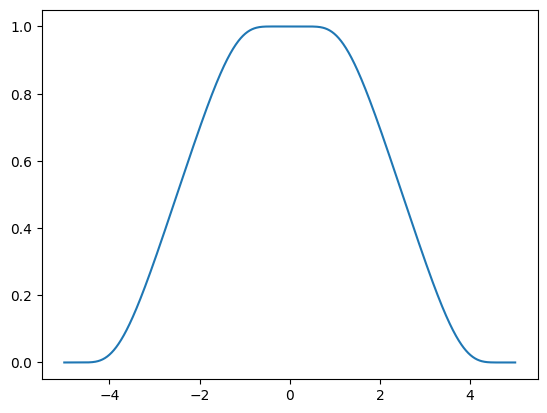

In [ ]:
window = get_planck(N=len(t), epsilon=0.5)

plt.plot(t, window)

In [ ]:
spectrum = np.fft.fft(x_impuls)
frequencies = np.fft.fftfreq(len(x_impuls), 1/fc)
filtered_signal_planck = my_conv(x_impuls, window)
filtered_spectrum_planck = np.fft.fft((filtered_signal_planck))

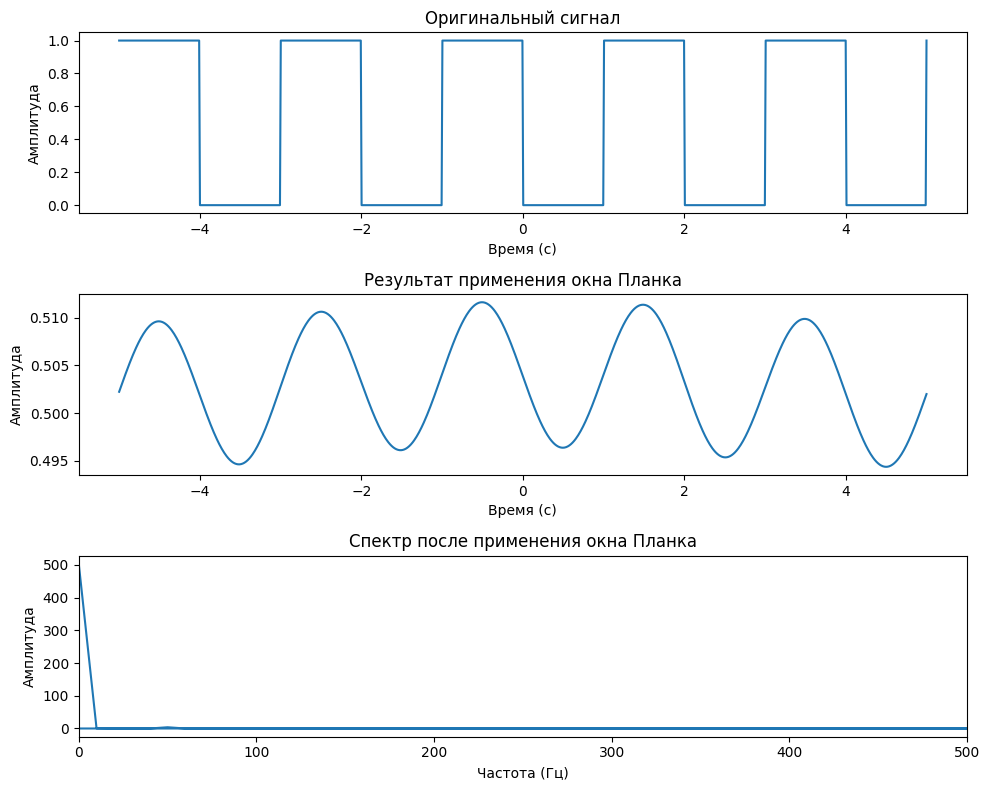

In [ ]:
plt.figure(figsize=(10, 8))

plt.subplot(3, 1, 1)
plt.plot(t, x_impuls)

plt.title("Оригинальный сигнал")
plt.xlabel("Время (с)")
plt.ylabel("Амплитуда")

plt.subplot(3, 1, 2)
plt.plot(t, np.real(filtered_signal_planck))

plt.title("Результат применения окна Планка")
plt.xlabel("Время (с)")
plt.ylabel("Амплитуда")

plt.subplot(3, 1, 3)
plt.plot(frequencies[:fc//2], np.abs(filtered_spectrum_planck)[:fc//2])
plt.title("Спектр после применения окна Планка")
plt.xlabel("Частота (Гц)")
plt.xlim(0, 500)
plt.ylabel("Амплитуда")

plt.tight_layout()
plt.show()

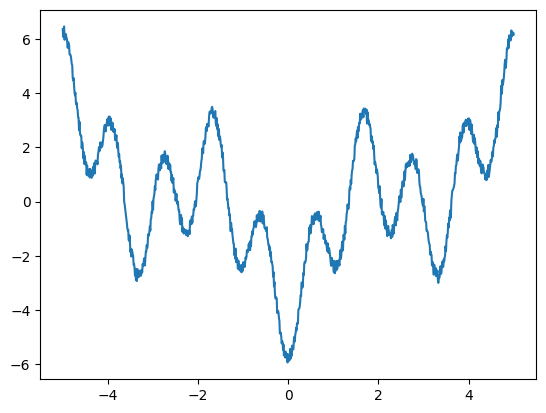

In [ ]:
#t, x_impuls = get_impulse(a=a, b=b, period=1, A=0.1, fc=1000, noise=0.01)
x_impuls=get_cos_singal(f=[50,150,450],a=-10, b=10, fs=1000, noise = 0.5)
plt.plot(t, x_impuls)

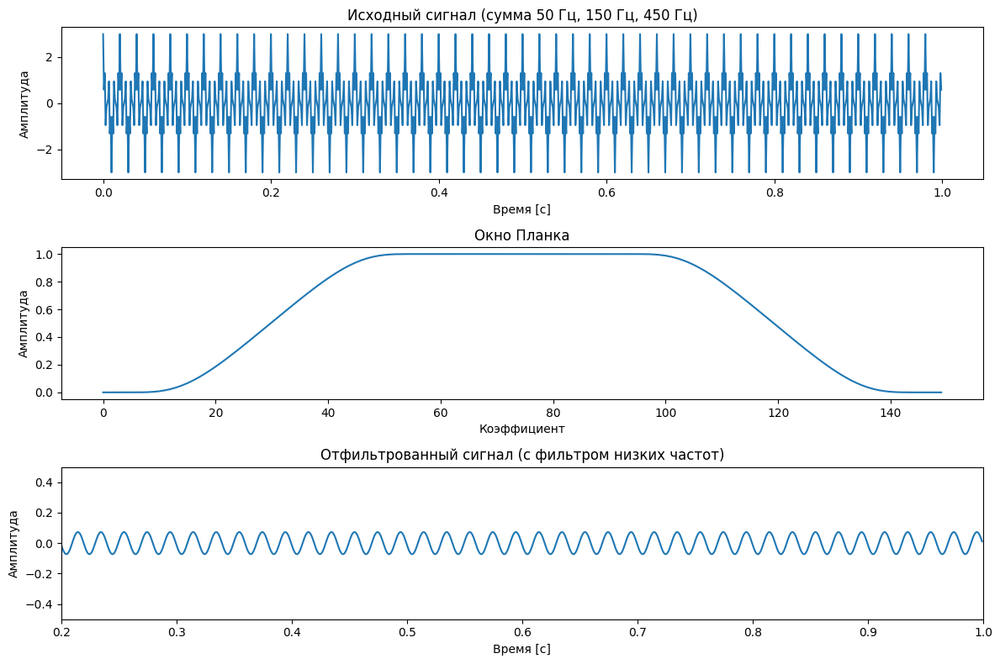

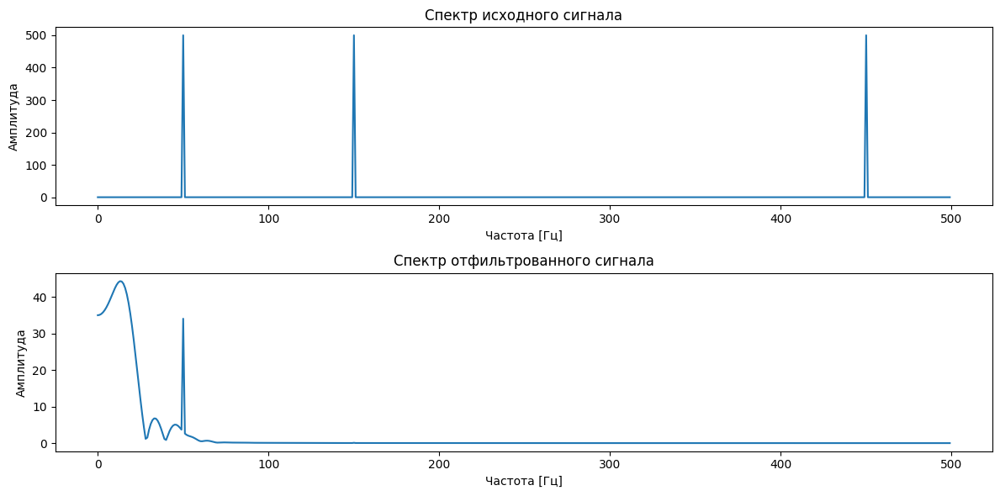

In [ ]:
import scipy.signal as signal

def get_planck(N, epsilon):
    a = np.zeros(N)
    for k in range(N):
        if k == 0 or k == N - 1:
            a[k] = 0
        elif 0 < k < epsilon * (N - 1):
            z_a = epsilon * (N - 1) * (1 / k + 1 / (k - epsilon * (N - 1)))
            a[k] = 1 / (np.exp(z_a) + 1)
        elif epsilon * (N - 1) <= k <= (1 - epsilon) * (N - 1):
            a[k] = 1
        elif (1 - epsilon) * (N - 1) < k < N - 1:
            z_b = epsilon * (N - 1) * (1 / (N - 1 - k) + 1 / ((1 - epsilon) * (N - 1) - k))
            a[k] = 1 / (np.exp(z_b) + 1)
    return a

# Параметры сигнала
fs = 1000  # Частота дискретизации, Гц
t = np.linspace(0, 1, fs, endpoint=False)  # Временной вектор (1 секунда)
f1, f2, f3 = 50, 150, 450  # Частоты 50 Гц, 150 Гц, 450 Гц

# Создание сигнала (сумма косинусоид)
signal_in = np.cos(2 * np.pi * f1 * t) + np.cos(2 * np.pi * f2 * t) + np.cos(2 * np.pi * f3 * t)

# Параметры фильтра
num_taps = 101     # Количество коэффициентов фильтра
epsilon = 0.1      # Параметр для окна Планка

# Применение окна Планка как фильтра низких частот
plank_window = get_planck(num_taps, epsilon)

# Сдвигаем окно Планка в частотной области, чтобы сделать его низкочастотным фильтром
low_pass_filter = np.sinc(np.linspace(-np.pi, np.pi, num_taps)) * plank_window

# Фильтрация сигнала с помощью окна Планка
filtered_signal = signal.lfilter(low_pass_filter, 1.0, signal_in)

# Визуализация сигнала до и после фильтрации
plt.figure(figsize=(12, 8))

# Исходный сигнал
plt.subplot(3, 1, 1)
plt.plot(t, signal_in)
plt.title("Исходный сигнал (сумма 50 Гц, 150 Гц, 450 Гц)")
plt.xlabel("Время [с]")
plt.ylabel("Амплитуда")

# Окно Планка (само по себе)
plt.subplot(3, 1, 2)
plt.plot(plank_window)
plt.title("Окно Планка")
plt.xlabel("Коэффициент")
plt.ylabel("Амплитуда")

# Отфильтрованный сигнал
plt.subplot(3, 1, 3)
plt.plot(t, filtered_signal)
plt.title("Отфильтрованный сигнал (с фильтром низких частот)")
plt.xlabel("Время [с]")
plt.xlim(0.2, 1.0)
plt.ylabel("Амплитуда")
plt.ylim(-0.5, 0.5)

plt.tight_layout()
plt.show()

# Построение спектра до и после фильтрации
frequencies_signal = np.fft.fftfreq(len(t), 1/fs)
spectrum_in = np.abs(np.fft.fft(signal_in))
spectrum_filtered = np.abs(np.fft.fft(filtered_signal))

plt.figure(figsize=(12, 6))

# Спектр до фильтрации
plt.subplot(2, 1, 1)
plt.plot(frequencies_signal[:len(t)//2], spectrum_in[:len(t)//2])
plt.title("Спектр исходного сигнала")
plt.xlabel("Частота [Гц]")
plt.ylabel("Амплитуда")

# Спектр после фильтрации
plt.subplot(2, 1, 2)
plt.plot(frequencies_signal[:len(t)//2], spectrum_filtered[:len(t)//2])
plt.title("Спектр отфильтрованного сигнала")
plt.xlabel("Частота [Гц]")
plt.ylabel("Амплитуда")

plt.tight_layout()
plt.show()

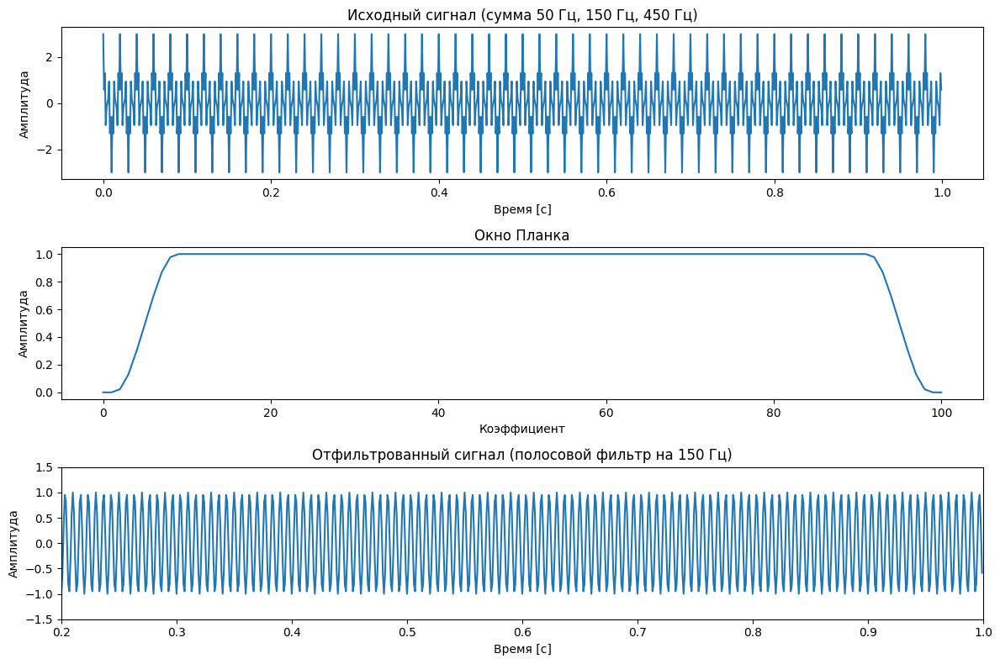

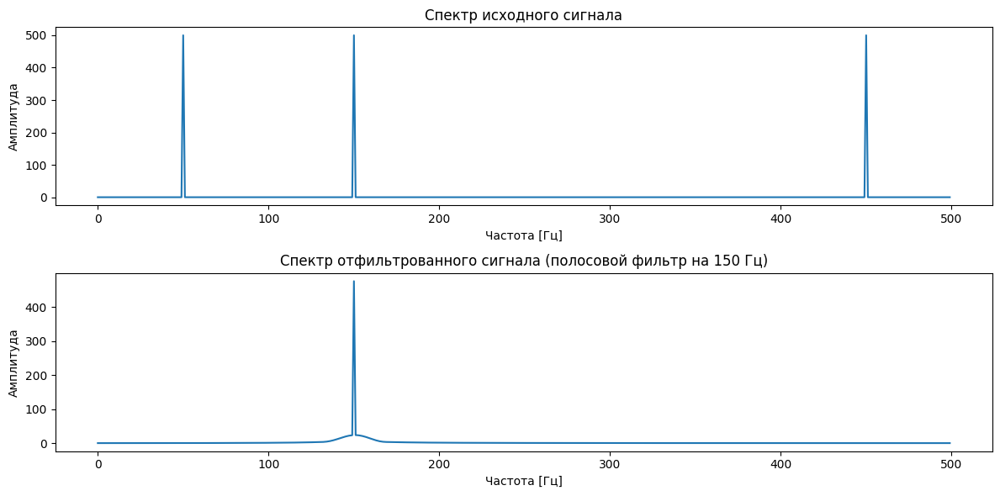

In [ ]:
import scipy.signal as signal

def get_planck(N, epsilon):
    a = np.zeros(N)
    for k in range(N):
        if k == 0 or k == N - 1:
            a[k] = 0
        elif 0 < k < epsilon * (N - 1):
            z_a = epsilon * (N - 1) * (1 / k + 1 / (k - epsilon * (N - 1)))
            a[k] = 1 / (np.exp(z_a) + 1)
        elif epsilon * (N - 1) <= k <= (1 - epsilon) * (N - 1):
            a[k] = 1
        elif (1 - epsilon) * (N - 1) < k < N - 1:
            z_b = epsilon * (N - 1) * (1 / (N - 1 - k) + 1 / ((1 - epsilon) * (N - 1) - k))
            a[k] = 1 / (np.exp(z_b) + 1)
    return a

fs = 1000
t = np.linspace(0, 1, fs, endpoint=False)
f1, f2, f3 = 50, 150, 450

signal_in = np.cos(2 * np.pi * f1 * t) + np.cos(2 * np.pi * f2 * t) + np.cos(2 * np.pi * f3 * t)

num_taps = 101
epsilon = 0.1
bandwidth = 20

plank_window = get_planck(num_taps, epsilon)

low_cutoff = (150 - bandwidth / 2) / (fs / 2)
high_cutoff = (150 + bandwidth / 2) / (fs / 2)

b = signal.firwin(num_taps, [low_cutoff, high_cutoff], pass_zero=False)
b *= plank_window

filtered_signal_1 = signal.lfilter(b, 1.0, signal_in)

plt.figure(figsize=(12, 8))

plt.subplot(3, 1, 1)
plt.plot(t, signal_in)
plt.title("Исходный сигнал (сумма 50 Гц, 150 Гц, 450 Гц)")
plt.xlabel("Время [с]")
plt.ylabel("Амплитуда")

plt.subplot(3, 1, 2)
plt.plot(plank_window)
plt.title("Окно Планка")
plt.xlabel("Коэффициент")
plt.ylabel("Амплитуда")

plt.subplot(3, 1, 3)
plt.plot(t, filtered_signal_1)
plt.title("Отфильтрованный сигнал (полосовой фильтр на 150 Гц)")
plt.xlabel("Время [с]")
plt.xlim(0.2, 1.0)
plt.ylabel("Амплитуда")
plt.ylim(-1.5, 1.5)

plt.tight_layout()
plt.show()

# Построение спектра до и после фильтрации
frequencies_signal = np.fft.fftfreq(len(t), 1/fs)
spectrum_in = np.abs(np.fft.fft(signal_in))
spectrum_filtered_1 = np.abs(np.fft.fft(filtered_signal_1))

plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(frequencies_signal[:len(t)//2], spectrum_in[:len(t)//2])
plt.title("Спектр исходного сигнала")
plt.xlabel("Частота [Гц]")
plt.ylabel("Амплитуда")

plt.subplot(2, 1, 2)
plt.plot(frequencies_signal[:len(t)//2], spectrum_filtered_1[:len(t)//2])
plt.title("Спектр отфильтрованного сигнала (полосовой фильтр на 150 Гц)")
plt.xlabel("Частота [Гц]")
plt.ylabel("Амплитуда")

plt.tight_layout()
plt.show()


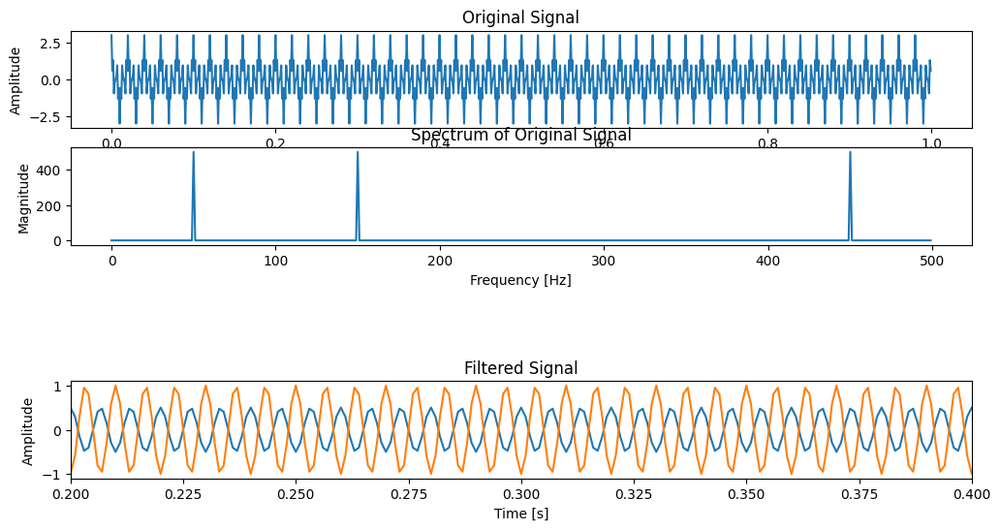

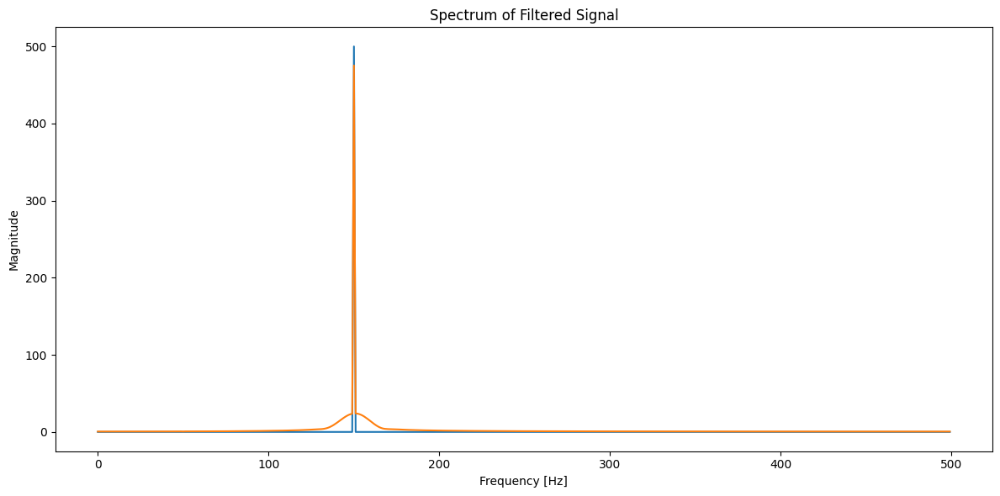

In [ ]:
def gaussian_filter(h, p, w):
    s = w / (4 * np.sqrt(np.log(2)))
    return np.exp(-0.5 * ((h - p) / s) ** 2)

# Преобразование Фурье сигнала
frequencies = np.fft.fftfreq(len(t), d=1/sampling_rate)
fft_signal = np.fft.fft(signal_in)

# Параметры фильтра
p = 150  # Центральная частота (Hz)
w = 20   # Ширина фильтра на полувысоте (FWHM)
gaussian_filter_vals = gaussian_filter(frequencies, p, w)

# Применение гауссовского фильтра в частотной области
filtered_fft_signal = fft_signal * gaussian_filter_vals

# Обратное преобразование Фурье для получения отфильтрованного сигнала
filtered_signal = np.fft.ifft(filtered_fft_signal)

# Визуализация
plt.figure(figsize=(12, 6))

# Исходный сигнал
plt.subplot(4, 1, 1)
plt.plot(t, signal_in)
plt.title('Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

# Спектр исходного сигнала
plt.subplot(4, 1, 2)
plt.plot(frequencies[:len(frequencies)//2], np.abs(fft_signal)[:len(frequencies)//2])
plt.title('Spectrum of Original Signal')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Magnitude')

# Отфильтрованный сигнал
plt.subplot(4, 1, 4)
plt.plot(t, np.real(filtered_signal))
plt.plot(t, filtered_signal_1)
plt.title('Filtered Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.xlim(0.2, 0.4)
# Спектр отфильтрованного сигнала
plt.figure(figsize=(12, 6))
plt.plot(frequencies[:len(frequencies)//2], np.abs(filtered_fft_signal)[:len(frequencies)//2])
plt.plot(frequencies[:len(frequencies)//2], spectrum_filtered_1[:len(frequencies)//2])
plt.title('Spectrum of Filtered Signal')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Magnitude')

plt.tight_layout()
plt.show()


#Лабораторная 5

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft, ifft, fftfreq, ifftshift
from scipy import signal
import scipy.fftpack
import scipy.io.wavfile as wavfile

*Задание 1*

In [ ]:
def morlet_wavelet(t, alpha, omega_0):
    return np.exp(-t**2 / alpha**2) * np.exp(1j * omega_0 * t)

In [ ]:
def morlet_wavelet_frequency(t, alpha, omega_0):
    return alpha * np.sqrt(np.pi) * np.exp(-alpha**2 * ((t - omega_0)**2) / 4)

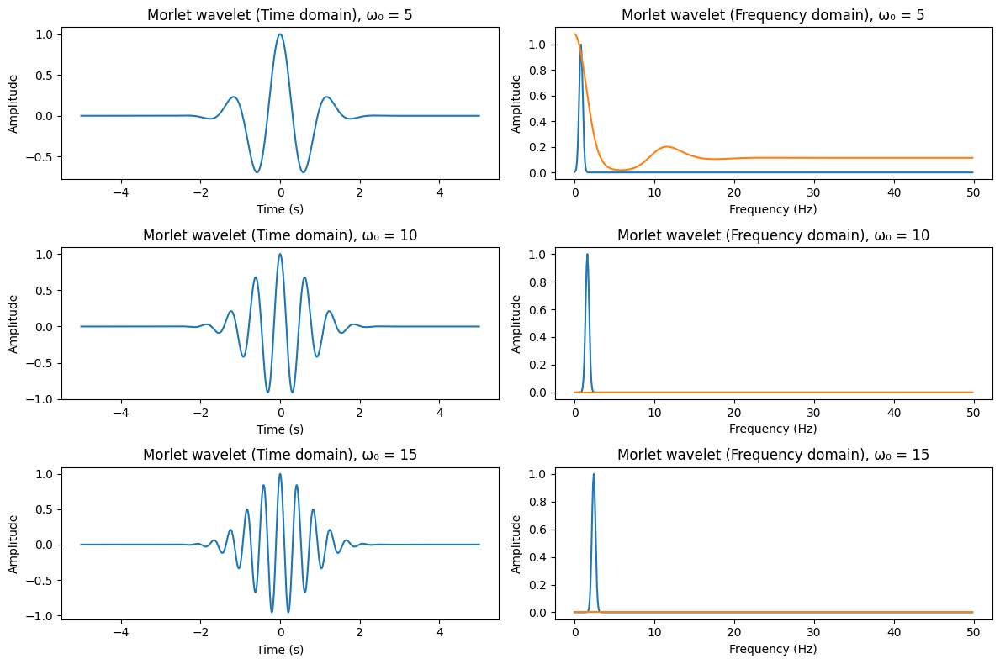

In [ ]:
t = np.linspace(-5, 5, 1000)
alpha = 1
omega_0_values = [5, 10, 15]

plt.figure(figsize=(12, 8))

for i, omega_0 in enumerate(omega_0_values):
    wavelet_t = morlet_wavelet(t, alpha, omega_0)
    fft_wavelet_my = morlet_wavelet_frequency(wavelet_t, alpha, omega_0)
    fft_wavelet = np.fft.fftshift(np.fft.fft(np.real(wavelet_t)))
    fft_wavelet_my /= 0.03
    fft_wavelet /= np.max(fft_wavelet)
    freqs = np.fft.fftshift(np.fft.fftfreq(len(t), t[1] - t[0]))

    plt.subplot(3, 2, 2*i+1)
    plt.plot(t, np.real(wavelet_t))
    plt.title(f"Morlet wavelet (Time domain), ω₀ = {omega_0}")
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    plt.subplot(3, 2, 2*i+2)
    plt.plot(freqs[len(freqs)//2:], np.abs(fft_wavelet)[len(freqs)//2:])
    plt.plot(freqs[len(freqs)//2:], np.abs(fft_wavelet_my)[len(freqs)//2:])
    plt.title(f"Morlet wavelet (Frequency domain), ω₀ = {omega_0}")
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()


*Задание 2*

In [ ]:
def mexican_hat_wavelet(t, sigma):
    return (1 - (t / sigma)**2) * np.exp(-0.5 * (t / sigma)**2)

<Figure size 1200x800 with 0 Axes>

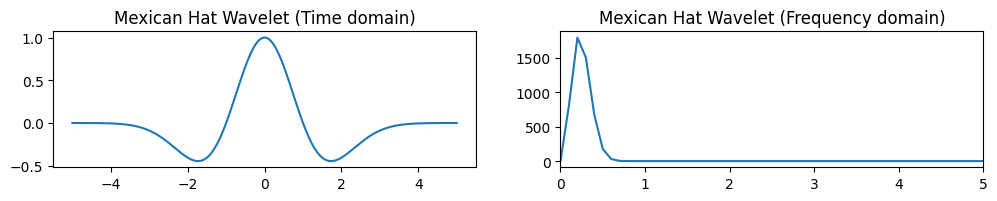

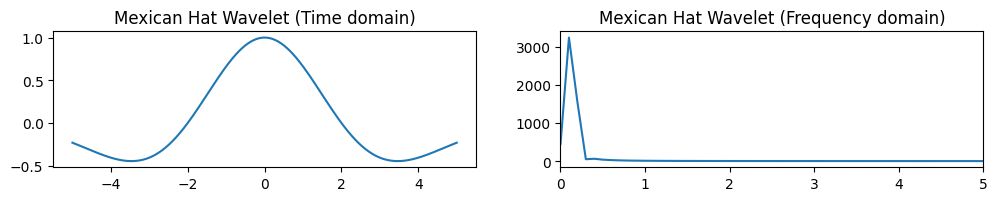

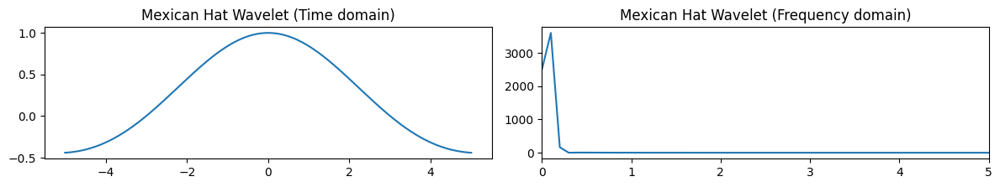

In [ ]:
t = np.linspace(-5, 5, 10000)
sigma_values = [1, 2, 3]

plt.figure(figsize=(12, 8))

for i, sigma in enumerate(sigma_values):
    mexican_hat = mexican_hat_wavelet(t, sigma)

    frequencies = np.fft.fftfreq(len(t), t[1] - t[0])
    mexican_hat_fft = np.fft.fft(mexican_hat)

    plt.figure(figsize=(12, 6))

    plt.subplot(3, 2, 2*i+1)
    plt.plot(t, mexican_hat)
    plt.title('Mexican Hat Wavelet (Time domain)')

    plt.subplot(3, 2, 2*i+2)
    plt.plot(np.fft.fftshift(frequencies), np.fft.fftshift(np.abs(mexican_hat_fft)))
    plt.xlim(0, 5)
    plt.title('Mexican Hat Wavelet (Frequency domain)')

plt.tight_layout()
plt.show()

*Задание 3*

In [ ]:
def haar_wavelet(t):
    return np.where((t >= 0) & (t < 0.5), 1, np.where((t >= 0.5) & (t < 1), -1, 0))

<Figure size 640x480 with 0 Axes>

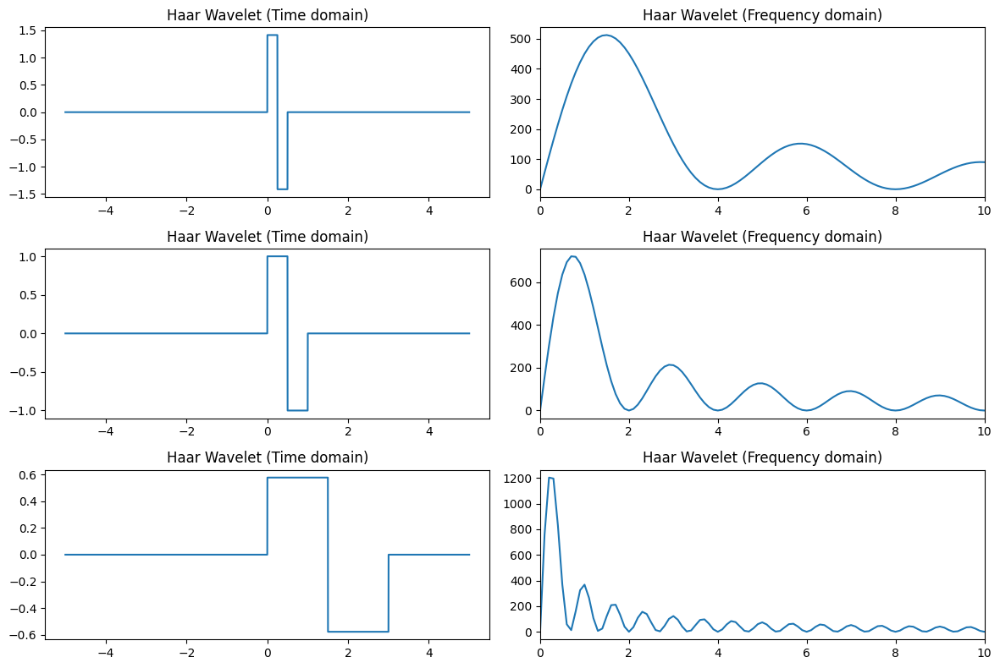

In [ ]:
t = np.linspace(-5, 5, 10000)
alpha_values = [0.5, 1, 3]

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))

for i, alpha in enumerate(alpha_values):
    scaled_t = t / alpha
    haar_wavelet_vals = haar_wavelet(scaled_t) / np.sqrt(alpha)

    frequencies = np.fft.fftfreq(len(t), t[1] - t[0])
    haar_fft = np.fft.fft(haar_wavelet_vals)

    plt.subplot(3, 2, 2*i+1)
    plt.plot(t, haar_wavelet_vals)
    plt.title('Haar Wavelet (Time domain)')

    plt.subplot(3, 2, 2*i+2)
    plt.plot(np.fft.fftshift(frequencies), np.fft.fftshift(np.abs(haar_fft)))
    plt.xlim(0, 10)
    plt.title('Haar Wavelet (Frequency domain)')

plt.tight_layout()
plt.show()

*Задание 4*

In [ ]:
def wavelet_convolution(signal, wavelet):
    return np.convolve(signal, wavelet, mode='same')

/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


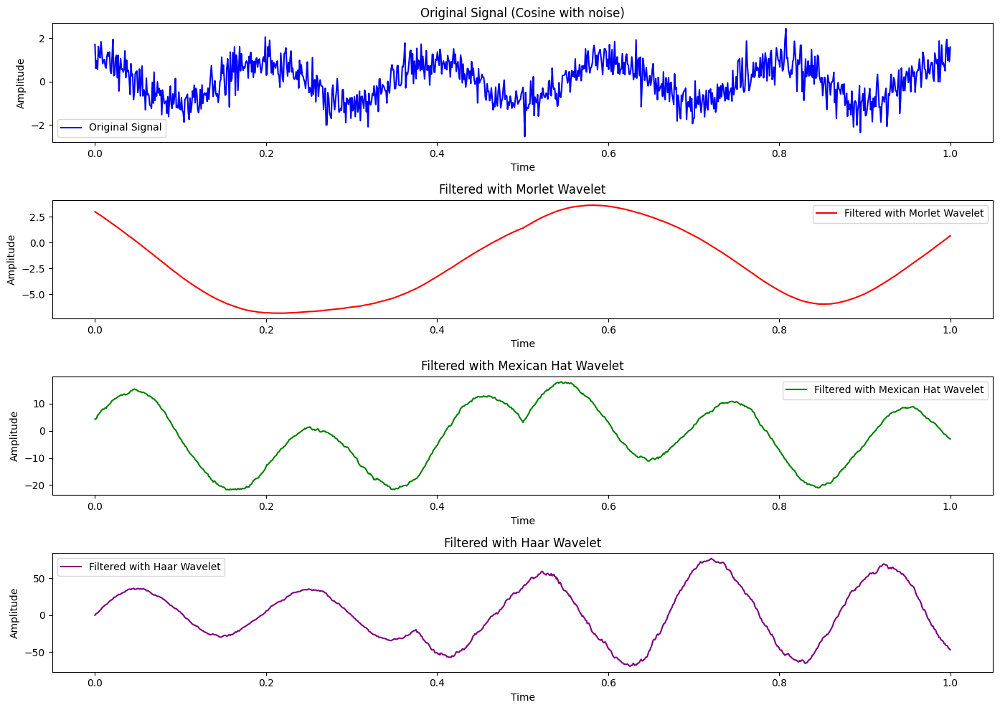

In [ ]:
# Генерация сигнала: косинус с шумом
t = np.linspace(0, 1, 1000)
signal = np.cos(2 * np.pi * 5 * t) + np.random.normal(0, 0.5, t.shape)

t_wavelet = np.linspace(-2, 2, 1000)

morlet = morlet_wavelet(t_wavelet, 1, 1)
mexican_hat = mexican_hat_wavelet(t_wavelet, 1)
scaled_t_wavelet = t_wavelet / alpha
haar = haar_wavelet(scaled_t_wavelet)

# Применение свёртки
filtered_morlet = wavelet_convolution(signal, morlet)
filtered_mexican_hat = wavelet_convolution(signal, mexican_hat)
filtered_haar = wavelet_convolution(signal, haar)

# Визуализация
plt.figure(figsize=(14, 10))

# Оригинальный сигнал
plt.subplot(4, 1, 1)
plt.plot(t, signal, label="Original Signal", color="blue")
plt.title("Original Signal (Cosine with noise)")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.legend()

# Фильтрация Морле
plt.subplot(4, 1, 2)
plt.plot(t, filtered_morlet, label="Filtered with Morlet Wavelet", color="red")
plt.title("Filtered with Morlet Wavelet")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.legend()

# Фильтрация "Мексиканской шляпой"
plt.subplot(4, 1, 3)
plt.plot(t, filtered_mexican_hat, label="Filtered with Mexican Hat Wavelet", color="green")
plt.title("Filtered with Mexican Hat Wavelet")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.legend()

# Фильтрация Хаара
plt.subplot(4, 1, 4)
plt.plot(t, filtered_haar, label="Filtered with Haar Wavelet", color="purple")
plt.title("Filtered with Haar Wavelet")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.legend()

plt.tight_layout()
plt.show()

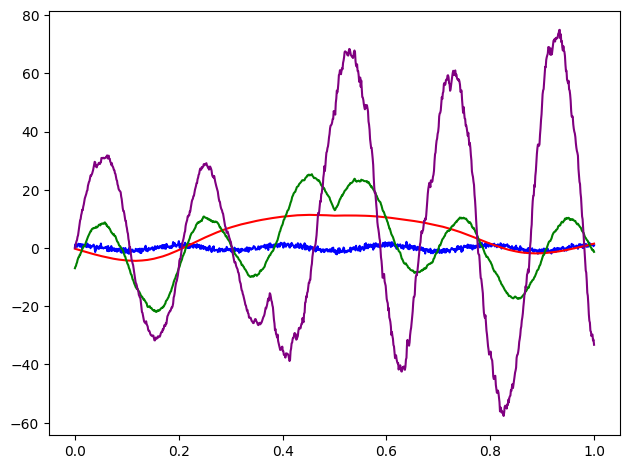

In [ ]:
plt.plot(t, signal, label="Original Signal", color="blue")
plt.plot(t, filtered_morlet, label="Filtered with Morlet Wavelet", color="red")
plt.plot(t, filtered_mexican_hat, label="Filtered with Mexican Hat Wavelet", color="green")
plt.plot(t, filtered_haar, label="Filtered with Haar Wavelet", color="purple")

plt.tight_layout()
plt.show()

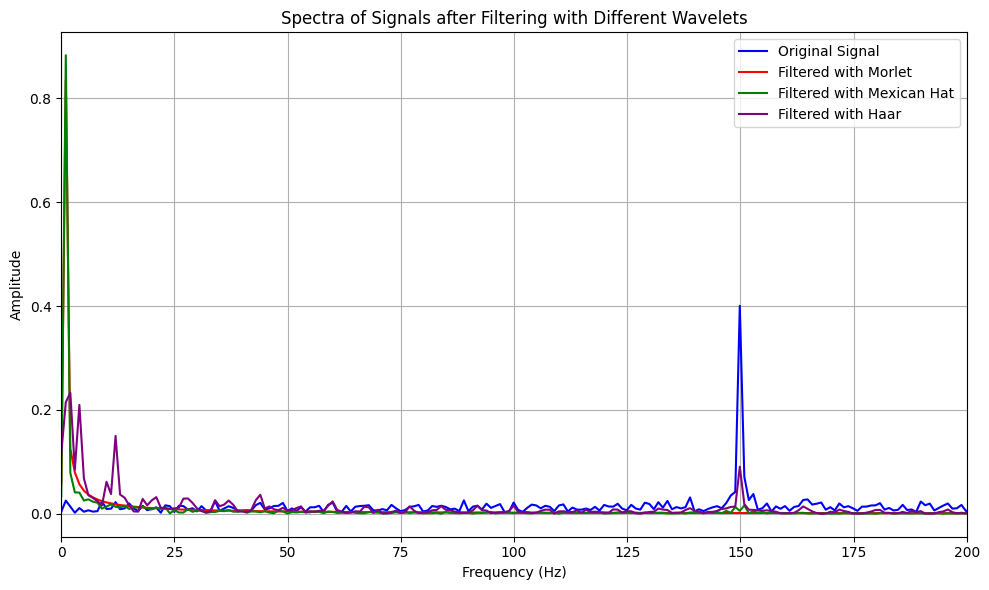

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Генерация сигнала: косинус с шумом
t = np.linspace(0, 1, 1000)
signal = np.cos(2 * np.pi * 150 * t) + np.random.normal(0, 0.5, t.shape)

# Вейвлет Морле
def morlet_wavelet(t, alpha=1, w0=1):
    return np.exp(-t**2 / alpha) * np.cos(w0 * t)

# Вейвлет "Мексиканская шляпа" (Ricker)
def mexican_hat_wavelet(t, sigma=1):
    return (1 - (t / sigma) ** 2) * np.exp(-t ** 2 / (2 * sigma ** 2))

# Вейвлет Хаара
def haar_wavelet(t):
    return np.where((t >= 0) & (t < 0.5), 1, np.where((t >= 0.5) & (t < 1), -1, 0))

# Свёртка сигнала с вейвлетом
def wavelet_convolution(signal, wavelet):
    conv_result = np.convolve(signal, wavelet, mode='same')
    return conv_result / np.max(np.abs(conv_result))  # Нормализация результата свёртки

# Параметры для вейвлетов
t_wavelet = np.linspace(-2, 2, 1000)
alpha = 1

morlet = morlet_wavelet(t_wavelet, 1, 1)
mexican_hat = mexican_hat_wavelet(t_wavelet, 1)
haar = haar_wavelet(t_wavelet / alpha)

# Применение свёртки с нормализацией
filtered_morlet = wavelet_convolution(signal, morlet)
filtered_mexican_hat = wavelet_convolution(signal, mexican_hat)
filtered_haar = wavelet_convolution(signal, haar)

# Расчёт спектра для всех сигналов
def compute_fft(signal):
    fft_result = np.fft.fft(signal)
    fft_magnitude = 2 * np.abs(fft_result) / len(signal)
    frequencies = np.fft.fftfreq(len(signal), d=t[1] - t[0])
    return frequencies[:len(frequencies)//2], fft_magnitude[:len(frequencies)//2]

frequencies, spectrum_signal = compute_fft(signal / np.max(np.abs(signal)))  # Нормализация сигнала
_, spectrum_morlet = compute_fft(filtered_morlet)
_, spectrum_mexican_hat = compute_fft(filtered_mexican_hat)
_, spectrum_haar = compute_fft(filtered_haar)

# Визуализация спектров всех сигналов
plt.figure(figsize=(10, 6))

plt.plot(frequencies, spectrum_signal, label="Original Signal", color="blue")
plt.plot(frequencies, spectrum_morlet, label="Filtered with Morlet", color="red")
plt.plot(frequencies, spectrum_mexican_hat, label="Filtered with Mexican Hat", color="green")
plt.plot(frequencies, spectrum_haar, label="Filtered with Haar", color="purple")

plt.title("Spectra of Signals after Filtering with Different Wavelets")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.xlim(0, 200)  # Увеличим диапазон частот, чтобы видеть основную частоту
plt.legend()

plt.grid(True)
plt.tight_layout()
plt.show()


**Задание 5**

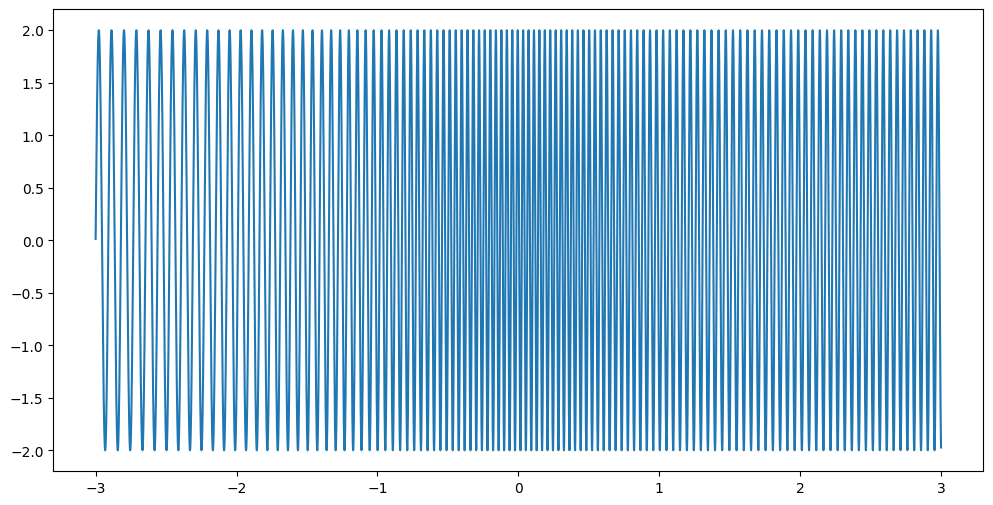

In [ ]:
def get_sin_with_time(fc, A, a, b, noise=None):
    t = np.arange(a, b, 1/fc)
    ln = len(t)
    freqmod = np.exp(-t**2) * 10 + 10
    freqmod = freqmod + np.linspace(0, 10, ln)
    signal = A * np.sin(2 * np.pi * (t + np.cumsum(freqmod)/fc))
    return t, signal

t, signal = get_sin_with_time(fc=10000, A=2, a=-3, b=3)

plt.figure(figsize=(12, 6))
plt.plot(t, signal)

In [ ]:
def spectrogram(start, end, signal, time):
    Freq1 = 50
    Freq2  = np.linspace(start, end, Freq1)
    fwhm  = .2
    pnts = len(time)
    Ws = np.zeros((Freq1, len(time)), dtype=complex)

    for wi in range(0, Freq1):
        gauss = np.exp(-(4 * np.log(2) * time**2) / fwhm**2)
        Ws[wi, :] = np.exp(1j * 2 * np.pi * Freq2[wi] * time) * gauss

    conv = pnts * 2 - 1
    half = int(np.floor(pnts / 2) + 1)
    sigX = scipy.fftpack.fft(signal, conv)
    tf = np.zeros((Freq1, len(time)))

    for fi in range(0, Freq1):
        waveX = scipy.fftpack.fft(Ws[fi, :], conv)
        waveX = waveX / np.max(waveX)
        conv_res = scipy.fftpack.ifft(waveX * sigX)
        conv_res = conv_res[half - 3 : -half]
        tf[fi, :] = np.abs(conv_res)**2

    plt.contourf(time, Freq2, tf)

    plt.xlabel('Время')
    plt.ylabel('Частота')
    plt.title('Частотно-временная характеристика')
    plt.show()

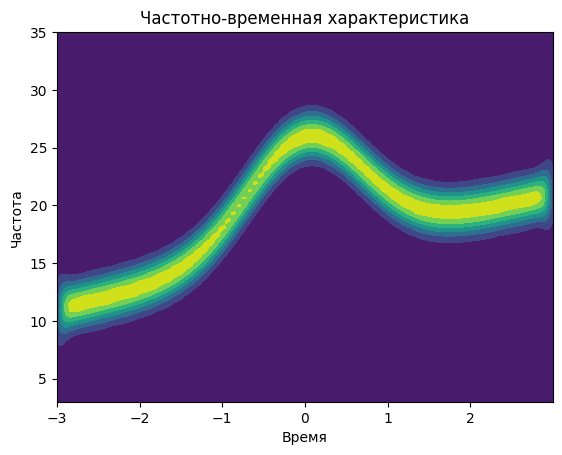

In [ ]:
spectrogram(3, 35, signal, t)

**Задание 6**

In [ ]:
def spectrogram(start, end, signal, time, mode = None):
    Freq1 = 50
    Freq2  = np.linspace(start, end, Freq1)
    fwhm  = .2
    pnts = len(time)
    Ws = np.zeros((Freq1, len(time)), dtype=complex)

    for wi in range(0, Freq1):
        if mode == 'morle':
            gauss = np.exp(-(4 * np.log(2) * time**2) / fwhm**2)
            Ws[wi, :] = np.exp(1j * 2 * np.pi * Freq2[wi] * time) * gauss
        if mode == 'mexh':
            gauss = np.exp(-(time * Freq2[wi])**2 / 2)
            Ws[wi, :] = (1 - (time * Freq2[wi])**2) * gauss
        if mode == 'haar':
            for i, x in enumerate(time):
                if 0 <= x and x < 0.5 / Freq2[wi]:
                    Ws[wi, i] = 1
                if 0.5 / Freq2[wi] <= x and x < 1/ Freq2[wi]:
                    Ws[wi, i] = -1

    conv = pnts * 2 - 1
    half = int(np.floor(pnts / 2) + 1)
    sigX = scipy.fftpack.fft(signal, conv)
    tf = np.zeros((Freq1, len(time)))

    for fi in range(0, Freq1):
        if mode == 'haar':
            for i, t in enumerate(time):
                tf[fi, i] = np.sum(signal[i : i + int(500 / Freq2[fi])])
                tf[fi, i] -= np.sum(signal[i + int(500 / Freq2[fi]) : i + int(1000 / Freq2[fi])])
        else:
            waveX = scipy.fftpack.fft(Ws[fi, :], conv)
            waveX = waveX / np.max(waveX)
            conv_res = scipy.fftpack.ifft(waveX * sigX)
            conv_res = conv_res[half - 2 : -half]
            tf[fi, :] = np.abs(conv_res)**2

    #print(np.min(tf))
    #print(np.max(tf))
    plt.contourf(time, Freq2, tf)
    #print(time.shape, Freq2.shape, tf.shape)
    plt.xlabel('Время')
    plt.ylabel('Частота')
    plt.title('Частотно-временная характеристика')
    plt.show()

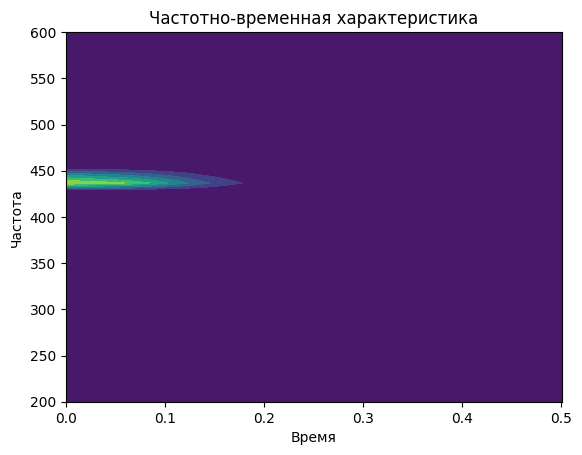

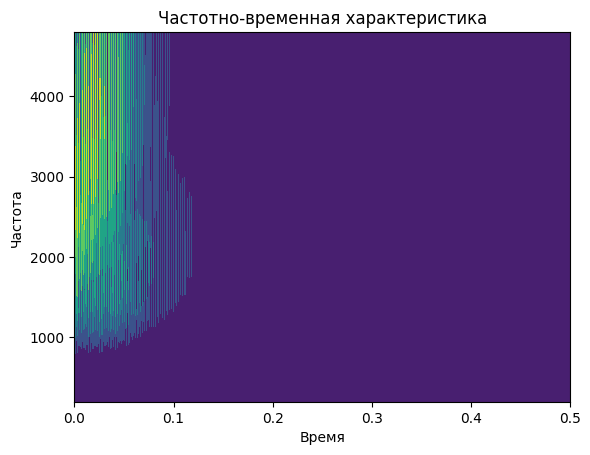

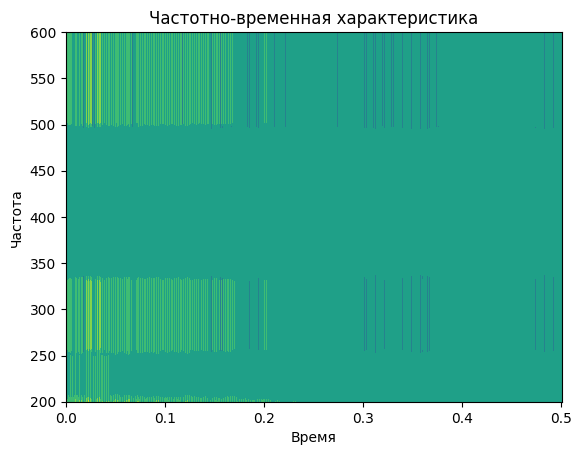

In [ ]:
rate, signal = wavfile.read('/content/zvuk-notyi-lya.wav')

if signal.ndim > 1:
    signal = signal.mean(axis=1)
signal = signal / np.max(np.abs(signal))
time = np.arange(len(signal)) / rate
start_freq = 200
end_freq = 600

spectrogram(start_freq, end_freq, signal, time, mode='morle')
spectrogram(start_freq, end_freq*8, signal, time, mode='mexh')
spectrogram(start_freq, end_freq, signal, time, mode='haar')

#Лабораторная 6

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft, ifft, fftfreq, ifftshift
from scipy import signal
import scipy.fftpack
import scipy.io.wavfile as wavfile

**Задание  1**

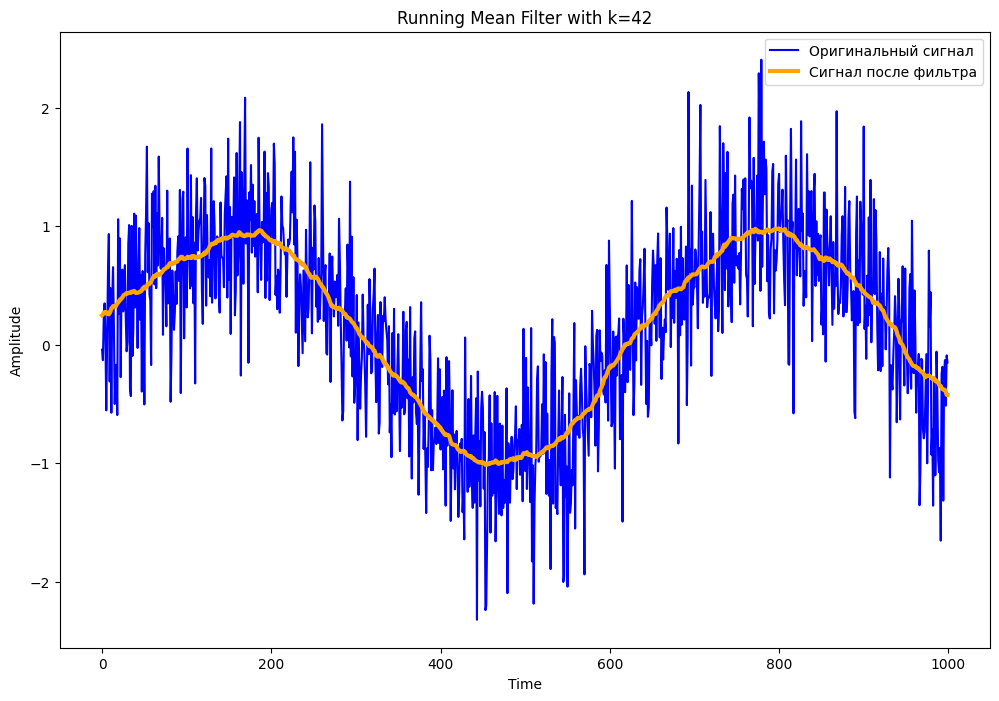

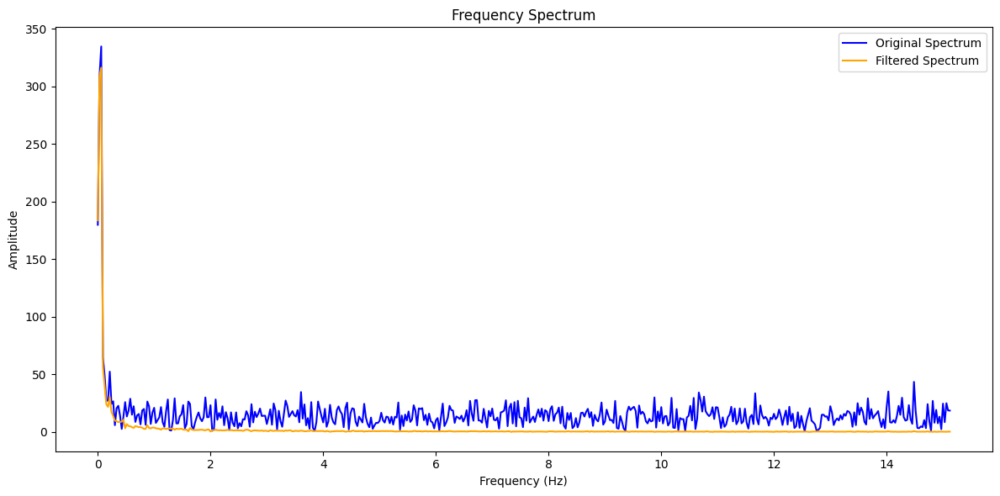

In [ ]:
x = np.sin(np.linspace(0, 10, 1000)) + np.random.normal(0, 0.5, 1000)

k = 42

def moving_average(x, t, k):
    start = max(0, t - k)
    end = min(len(x), t + k + 1)
    window = x[start:end]
    return np.mean(window)

smoothed_signal = [moving_average(x, t, k) for t in range(len(x))]

plt.figure(figsize=(12, 8))
plt.plot(x, label='Оригинальный сигнал', color='blue')
plt.plot(smoothed_signal, label='Сигнал после фильтра', color='orange', lw = 3)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.title('Running Mean Filter with k={}'.format(k))

freq = np.fft.fftfreq(len(x), d=0.033)
original_spectrum = np.abs(np.fft.fft(x))
smoothed_spectrum = np.abs(np.fft.fft(smoothed_signal))

plt.figure(figsize=(12, 6))
plt.plot(freq[:len(freq)//2], original_spectrum[:len(freq)//2],
         label='Original Spectrum', color='blue')
plt.plot(freq[:len(freq)//2], smoothed_spectrum[:len(freq)//2],
         label='Filtered Spectrum', color='orange')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend()
plt.title('Frequency Spectrum')
plt.tight_layout()
plt.show()


**Задание 2**

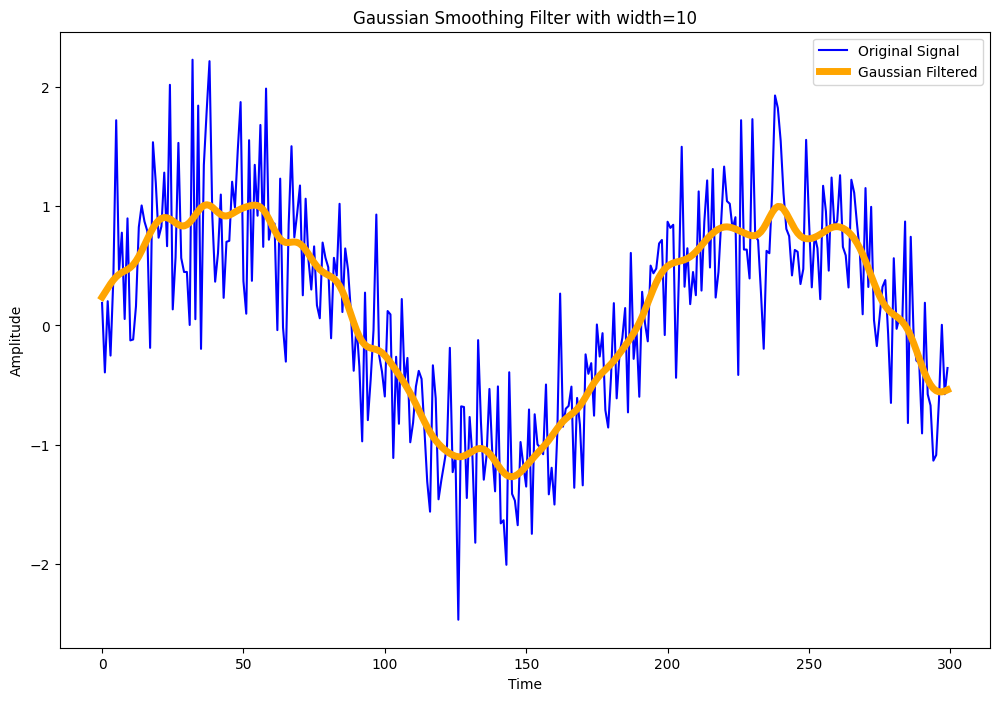

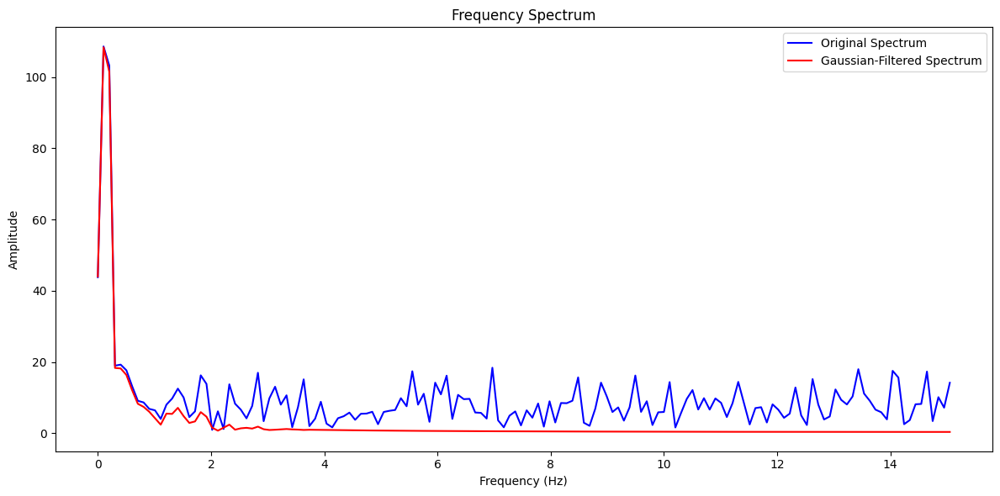

In [ ]:
x = np.sin(np.linspace(0, 10, 300)) + np.random.normal(0, 0.5, 300)

k = 20
w = 10

def gaussian_weight(t, w):
    return np.exp(-4 * np.log(2) * (t**2) / (w**2))

def gaussian_smoothing(x, k, w):
    smoothed = []
    for t in range(len(x)):
        window = x[max(0, t - k):min(len(x), t + k + 1)]
        weights = np.array([gaussian_weight(i - t, w) for i in range(t - k, t + k + 1) if 0 <= i < len(x)])
        smoothed.append(np.sum(window * weights) / np.sum(weights))
    return smoothed

smoothed_signal = gaussian_smoothing(x, k, w)

plt.figure(figsize=(12, 8))
plt.plot(x, label='Original Signal', color='blue')
plt.plot(smoothed_signal, label='Gaussian Filtered', color='orange', lw = 5)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.title('Gaussian Smoothing Filter with width={}'.format(w))

freq = np.fft.fftfreq(len(x), d=0.033)
original_spectrum = np.abs(np.fft.fft(x))
smoothed_spectrum = np.abs(np.fft.fft(smoothed_signal))

plt.figure(figsize=(12, 6))
plt.plot(freq[:len(freq)//2], original_spectrum[:len(freq)//2], label='Original Spectrum', color='blue')
plt.plot(freq[:len(freq)//2], smoothed_spectrum[:len(freq)//2], label='Gaussian-Filtered Spectrum', color='red')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend()
plt.title('Frequency Spectrum')
plt.tight_layout()
plt.show()


**Задание 3**

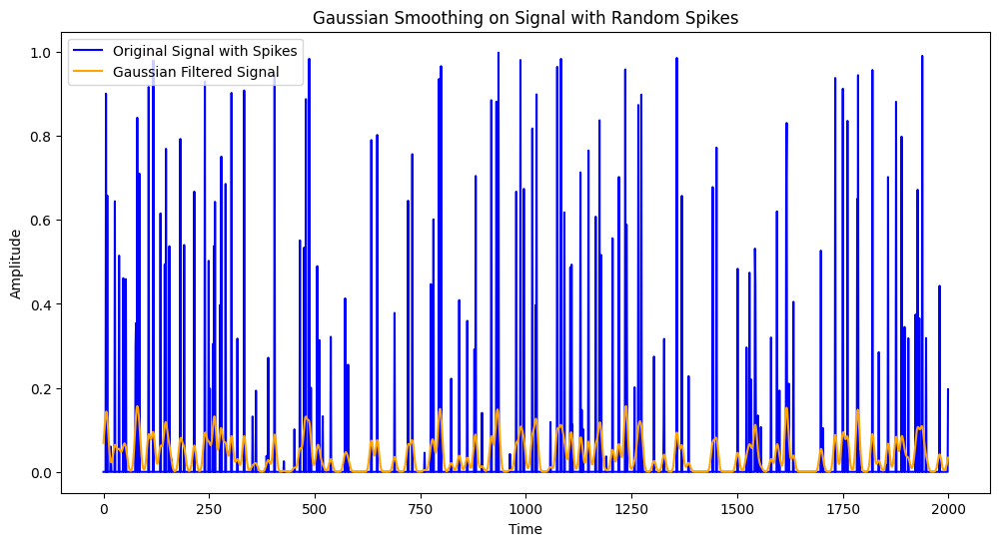

In [ ]:
num_points = 2000
amplitude = 1
k = 20
w = 10

np.random.seed(0)
signal = np.zeros(num_points)
peak_positions = np.random.choice(range(num_points), size=150, replace=False)
signal[peak_positions] = amplitude * np.random.rand(150)

def gaussian_weight(t, w):
    return np.exp(-4 * np.log(2) * (t**2) / (w**2))

def gaussian_smoothing(x, k, w):
    smoothed = []
    for t in range(len(x)):
        window = x[max(0, t - k):min(len(x), t + k + 1)]
        weights = np.array([gaussian_weight(i - t, w) for i in range(t - k, t + k + 1) if 0 <= i < len(x)])
        smoothed.append(np.sum(window * weights) / np.sum(weights))
    return smoothed

smoothed_signal = gaussian_smoothing(signal, k, w)

plt.figure(figsize=(12, 6))
plt.plot(signal, label='Original Signal with Spikes', color='blue')
plt.plot(smoothed_signal, label='Gaussian Filtered Signal', color='orange')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.title('Gaussian Smoothing on Signal with Random Spikes')
plt.show()


**Задание 4**

In [ ]:
fs = 1000
min_A = 10
max_A = 50

t = np.linspace(0, 10, fs)
signal = np.sin(2*np.pi * t)

num_points = len(t)
points = np.zeros(num_points)

peak_positions = np.random.choice(range(num_points), size=150, replace=False)
signal[peak_positions] = np.random.uniform(min_A, max_A, size=150)

threshold = 5
spike_mask = signal > threshold
cleaned_signal = np.where(spike_mask, np.nan, signal)

filled_signal = np.where(np.isnan(cleaned_signal), np.roll(cleaned_signal, 1), cleaned_signal)
filled_signal[0] = filled_signal[1]

filtered_signal = medfilt(filled_signal, kernel_size=5)

plt.figure(figsize=(14, 7))
plt.plot(t, signal, label='Original Signal', alpha=0.5)
plt.plot(t, filtered_signal, color='orange', label='Filtered Signal', linewidth=2)
plt.scatter(t[spike_mask], signal[spike_mask], color='red', label='Removed Spikes', alpha=0.5)
plt.title('Signal Cleaning with Median Filter')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.grid()
plt.show()

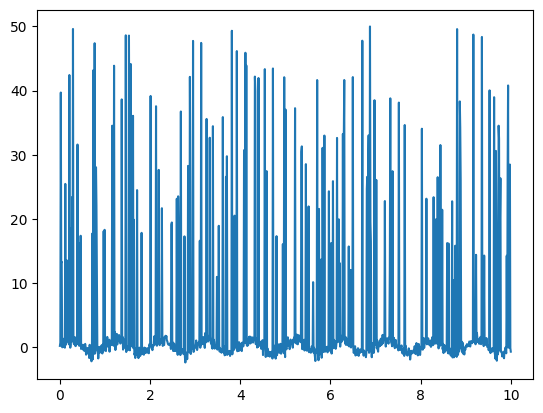

In [ ]:
plt.plot(t, signal)
plt.show()

In [ ]:
def median_filter_with_threshold(signal, kernel_size, threshold):
    n = len(signal)
    pad_width = kernel_size // 2
    padded_signal = np.pad(signal, pad_width, mode='edge')
    filtered_signal = np.zeros(n)

    for i in range(n):
        window = padded_signal[i:i + kernel_size]

        window_median = np.median(window)

        filtered_window = np.where(window > threshold, window_median, window)

        filtered_signal[i] = np.median(filtered_window)

    return filtered_signal

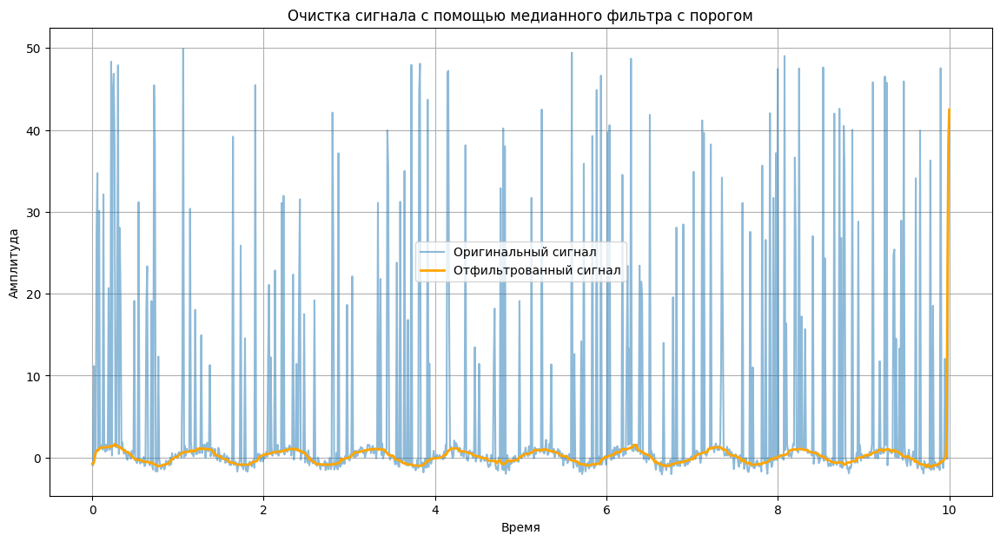

In [ ]:
fs = 1000
min_A = 10
max_A = 50

t = np.linspace(0, 10, fs)
signal = np.sin(2 * np.pi * t) + np.random.normal(0, 0.5, fs)

num_points = len(t)
peak_positions = np.random.choice(range(num_points), size=150, replace=False)
signal[peak_positions] = np.random.uniform(min_A, max_A, size=150)

threshold = 5

kernel_size = 20
filtered_signal = median_filter_with_threshold(signal, kernel_size, threshold)

plt.figure(figsize=(14, 7))
plt.plot(t, signal, label='Оригинальный сигнал', alpha=0.5)
plt.plot(t, filtered_signal, color='orange', label='Отфильтрованный сигнал', linewidth=2)
plt.title('Очистка сигнала с помощью медианного фильтра с порогом')
plt.xlabel('Время')
plt.ylabel('Амплитуда')
plt.legend()
plt.grid()
plt.show()


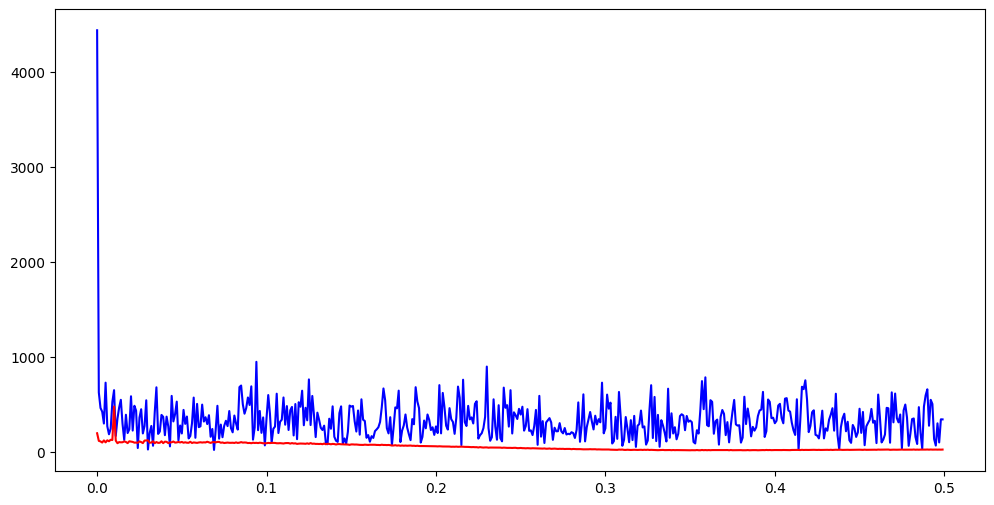

In [ ]:
freq = np.fft.fftfreq(len(t))
original_spectrum = np.abs(np.fft.fft(signal))
filtered_spectrum = np.abs(np.fft.fft(filtered_signal))

plt.figure(figsize=(12, 6))
plt.plot(freq[:len(freq)//2], original_spectrum[:len(freq)//2], label='Original Spectrum', color='blue')
plt.plot(freq[:len(freq)//2], filtered_spectrum[:len(freq)//2], color='red')

**Задание 5**

Линейный тренд был обнаружен и будет удален.


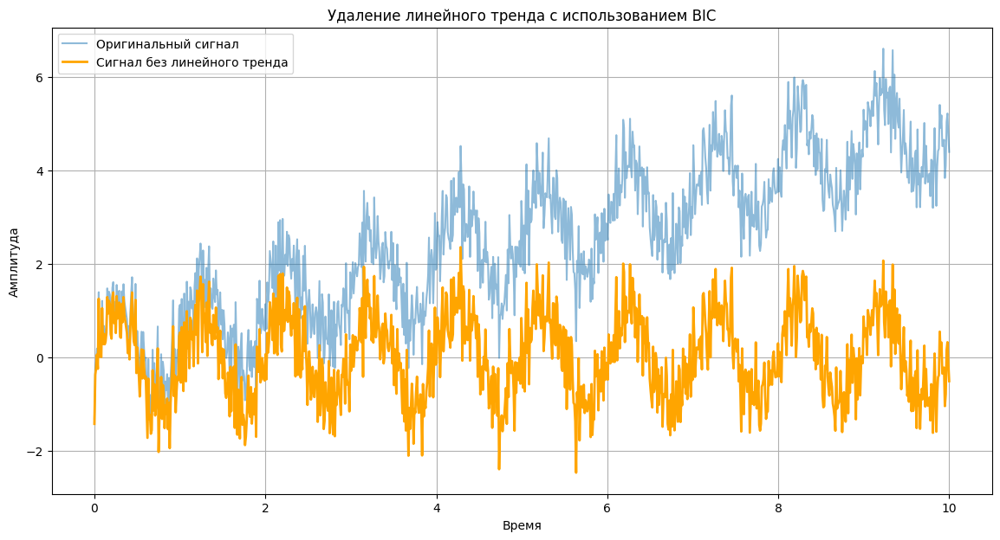

In [ ]:
from sklearn.linear_model import LinearRegression

def compute_bic(n, rss, k):
    return n * np.log(rss / n) + k * np.log(n)

def remove_linear_trend(signal):
    n = len(signal)

    mean_signal = np.mean(signal)
    rss_constant = np.sum((signal - mean_signal) ** 2)
    bic_constant = compute_bic(n, rss_constant, 1)

    x = np.arange(n).reshape(-1, 1)
    model = LinearRegression()
    model.fit(x, signal)
    trend = model.predict(x)
    rss_trend = np.sum((signal - trend) ** 2)
    bic_trend = compute_bic(n, rss_trend, 2)

    if bic_trend < bic_constant:
        print("Линейный тренд был обнаружен и будет удален.")
        return signal - trend
    else:
        print("Линейный тренд не обнаружен. Сигнал остается без изменений.")
        return signal

fs = 1000
t = np.linspace(0, 10, fs)
signal = 0.5 * t + np.sin(2 * np.pi * t) + np.random.normal(0, 0.5, fs)

detrended_signal = remove_linear_trend(signal)

plt.figure(figsize=(14, 7))
plt.plot(t, signal, label='Оригинальный сигнал', alpha=0.5)
plt.plot(t, detrended_signal, color='orange', label='Сигнал без линейного тренда',
         lw=2)
plt.title('Удаление линейного тренда с использованием BIC')
plt.xlabel('Время')
plt.ylabel('Амплитуда')
plt.legend()
plt.grid()
plt.show()


Линейный тренд был обнаружен и будет удален.


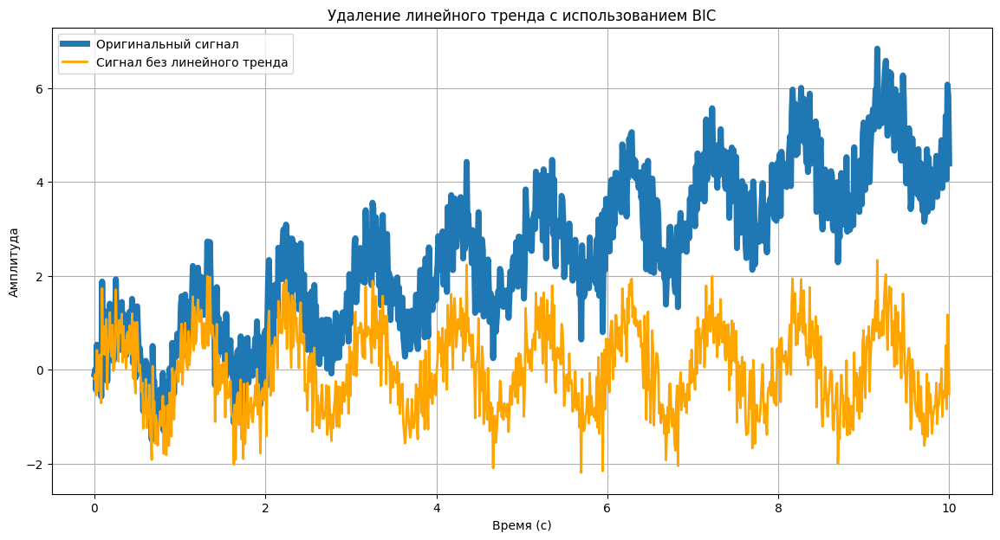

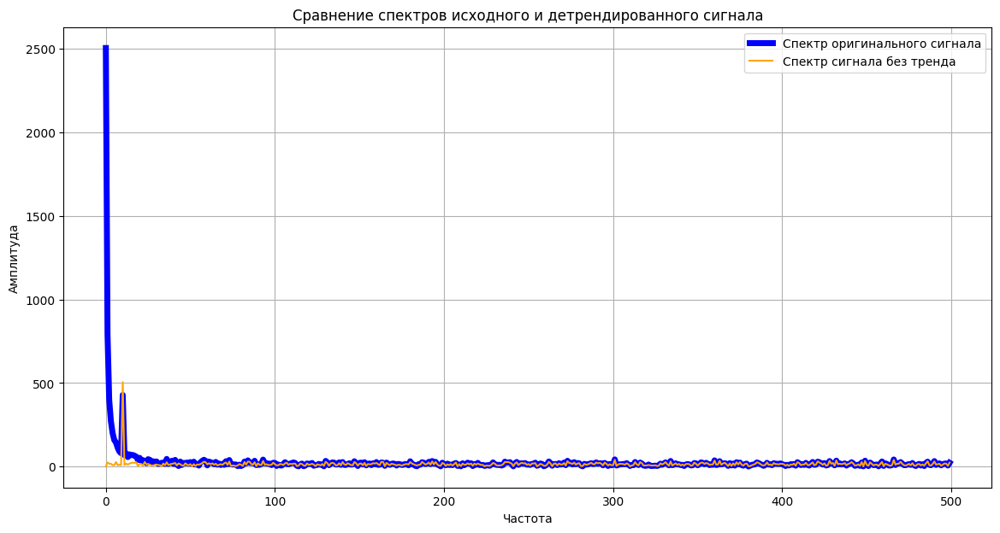

#Лабораторная 7

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft, ifft, fftfreq, ifftshift
from scipy import signal
import scipy.fftpack
import scipy.io.wavfile as wavfile

**Задание 1**

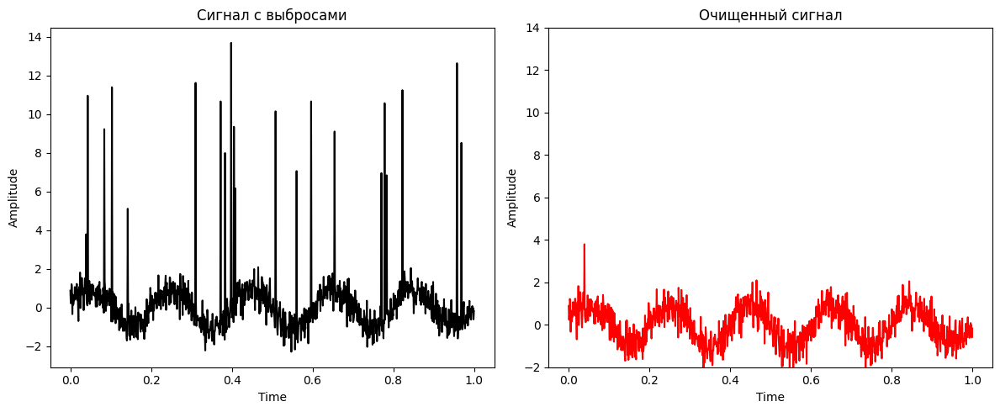

In [ ]:
np.random.seed(0)
t = np.linspace(0, 1, 1000)
signal = np.sin(2 * np.pi * 5 * t)
noise = np.random.normal(0, 0.5, t.shape)
outliers = np.random.poisson(10, t.shape) * (np.random.rand(*t.shape) < 0.02)

noisy_signal = signal + noise + outliers

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(t, noisy_signal, color='black')
plt.title("Сигнал с выбросами")
plt.xlabel("Time")
plt.ylabel("Amplitude")

std_dev = np.std(noisy_signal)
mean_val = np.mean(noisy_signal)
threshold = mean_val + 3 * std_dev
clean_signal = np.where(noisy_signal > threshold, mean_val, noisy_signal)

plt.subplot(1, 2, 2)
plt.plot(t, clean_signal, color='red')
plt.title("Очищенный сигнал")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.ylim(-2, 14)
plt.tight_layout()
plt.show()


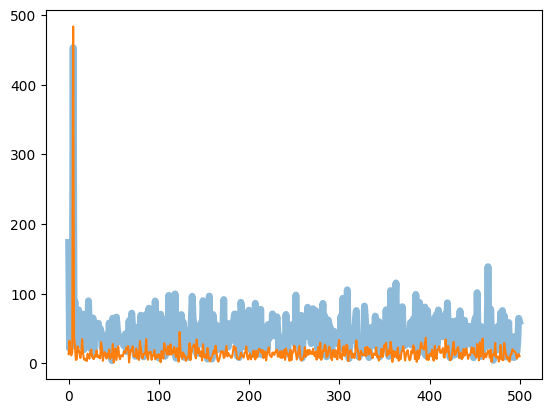

In [ ]:
freqs = np.fft.rfftfreq(len(t), d=(t[1] - t[0]))
fft_noisy = np.abs(np.fft.rfft(noisy_signal))
fft_clean = np.abs(np.fft.rfft(clean_signal))

plt.plot(freqs, fft_noisy, lw = 5, alpha = 0.5)
plt.plot(freqs, fft_clean)

plt.show()

**Задание 2**

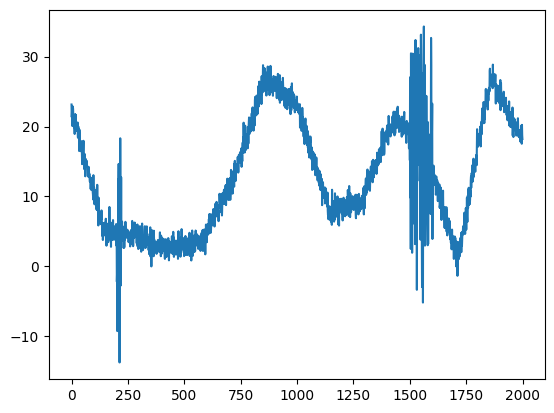

In [ ]:
n = 2000
p = 15

e = np.linspace(0, n, p)
amplitude_modulator = np.interp(np.arange(0, n), e, np.random.rand(p) * 30)
signal = amplitude_modulator + np.random.randn(n)

signal[200:221] = signal[200:221] + np.random.randn(21) * 9
signal[1500:1601] = signal[1500:1601] + np.random.randn(101) * 9

plt.plot(signal)


In [ ]:
def sliding_rms(signal, threshold):
    pct_win = 2
    k = int(n*(pct_win/2/100))

    k = int(n * (pct_win/2/100))

    rms_ts = np.zeros(n)

    for ti in range(0, n):
      low_bnd = max(0, ti - k)
      upp_bnd = min(n, ti+k)

      tmpsig = signal[range(low_bnd, upp_bnd)]
      tmpsig = tmpsig - np.mean(tmpsig)

      rms_ts[ti] = np.sqrt(np.sum(tmpsig**2))

    filtered_signal = signal.copy()
    filtered_signal[rms_ts > threshold] = threshold

    return rms_ts, filtered_signal

In [ ]:
rms_ts, filtered_signal = sliding_rms(signal, 15)

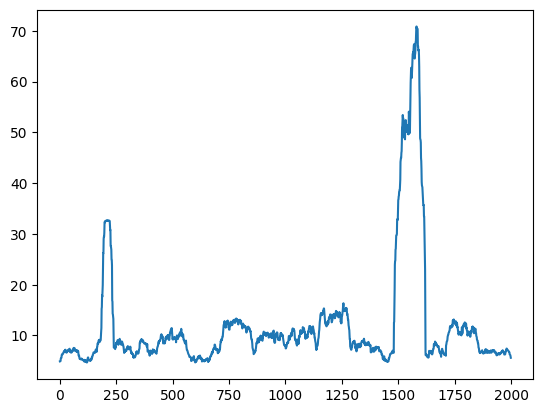

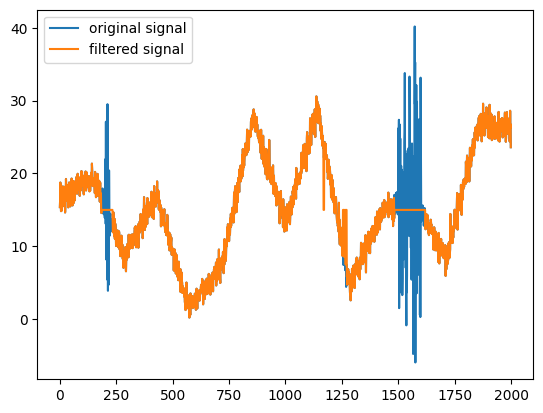

In [ ]:
plt.plot(rms_ts)
plt.show()

plt.plot(signal, label = 'original signal')
plt.plot(filtered_signal, label = 'filtered signal')
plt.legend()
plt.show()

**Задание 3**

In [ ]:
def reconstructed(signal, start = 4000, end = 5000, window_size = 1000):
    signal_with_gap = signal.copy()
    signal_with_gap[start:end] = 0

    left_window = signal_with_gap[start - window_size:start]
    right_window = signal_with_gap[end:end + window_size]

    left_spectrum = fft(left_window)
    right_spectrum = fft(right_window)

    mean_spectrum = (left_spectrum + right_spectrum) / 2

    reconstructed_gap = ifft(mean_spectrum).real

    gap_length = end - start

    reconstructed_gap = reconstructed_gap[:gap_length]

    reconstructed_signal = signal_with_gap.copy()
    reconstructed_signal[start:end] = reconstructed_gap

    return reconstructed_signal

In [ ]:
n = 10000
t = np.linspace(0, 1, n)

signal = 1 * t + np.sin(2 * np.pi * 50 * t) + np.random.normal(0, 0.2, n)

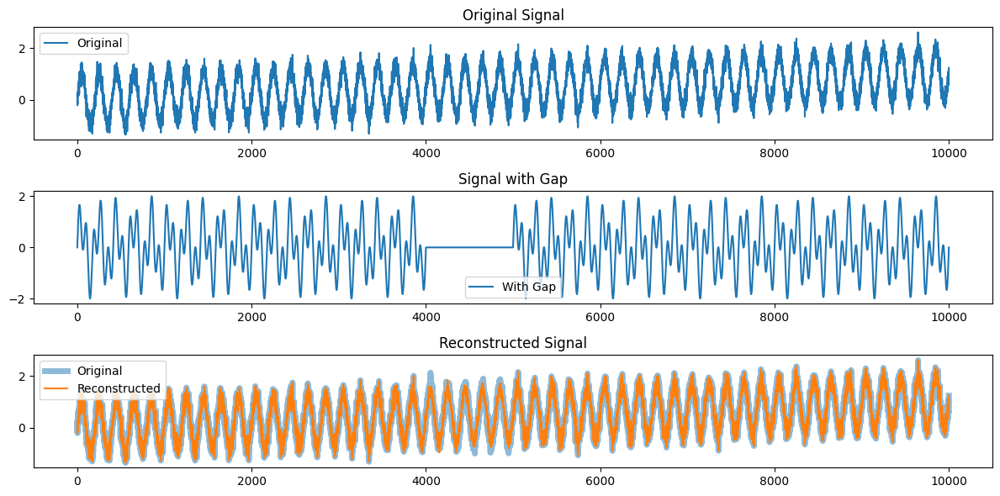

In [ ]:
reconstructed_signal = reconstructed(signal)

plt.figure(figsize=(12, 6))

plt.subplot(3, 1, 1)
plt.plot(signal, label="Original")
plt.title("Original Signal")
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(signal_with_gap, label="With Gap")
plt.title("Signal with Gap")
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(signal, label="Original", alpha=0.5, lw = 5)
plt.plot(reconstructed_signal, label="Reconstructed")
plt.title("Reconstructed Signal")
plt.legend()

plt.tight_layout()
plt.show()

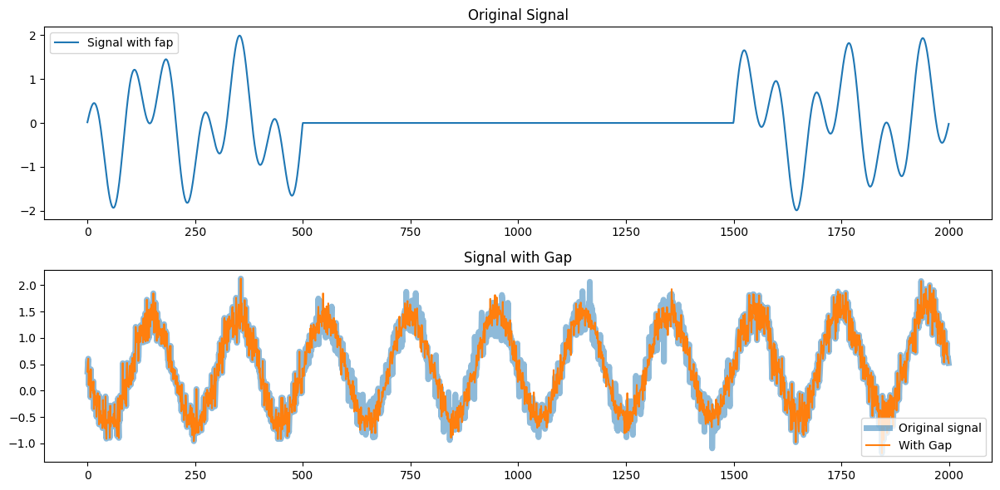

In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.plot(signal_with_gap[3500:5500], label="Signal with fap")
plt.title("Original Signal")
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(signal[3500:5500], label = 'Original signal', lw = 5, alpha = 0.5)
plt.plot(reconstructed_signal[3500:5500], label="With Gap")
plt.title("Signal with Gap")
plt.legend()

plt.tight_layout()
plt.show()

**Задание 4**

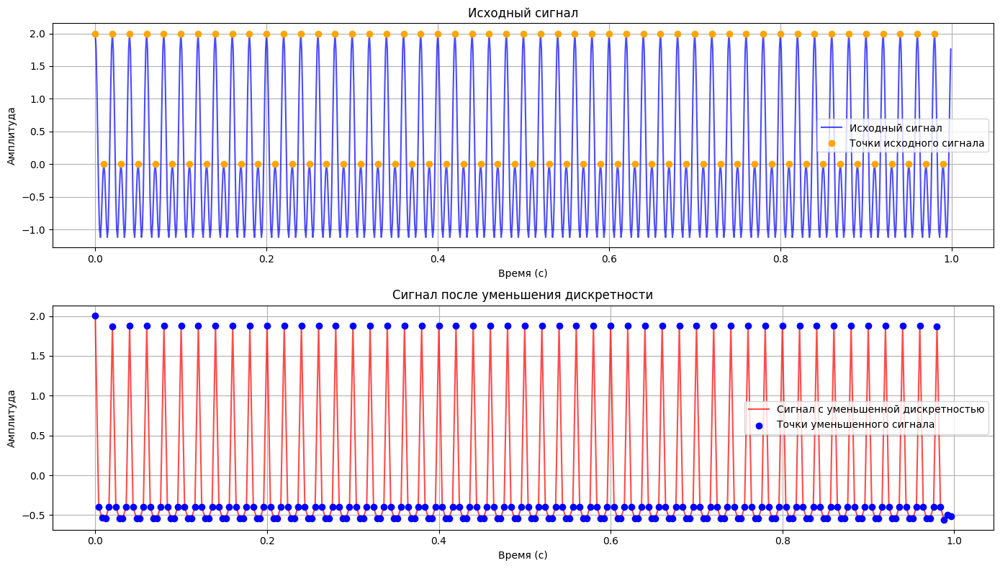

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt

fs_original = 1000
t = np.arange(0, 1, 1 / fs_original)
freq1, freq2 = 50, 100

signal = np.cos(2 * np.pi * freq1 * t) + np.cos(2 * np.pi * freq2 * t)

decimation_factor = 4
fs_new = fs_original // decimation_factor
nyquist_new = fs_new / 2

cutoff = nyquist_new / (fs_original / 2)
b, a = butter(4, cutoff, btype='low')
filtered_signal = filtfilt(b, a, signal)

downsampled_signal = filtered_signal[::decimation_factor]
t_downsampled = t[::decimation_factor]

plt.figure(figsize=(14, 8))

plt.subplot(2, 1, 1)
plt.plot(t, signal, label='Исходный сигнал', alpha=0.7, color='blue')
plt.scatter(t[::10], signal[::10], color='orange', label='Точки исходного сигнала', zorder=3)
plt.title("Исходный сигнал")
plt.xlabel("Время (с)")
plt.ylabel("Амплитуда")
plt.legend()
plt.grid()

plt.subplot(2, 1, 2)
plt.plot(t_downsampled, downsampled_signal, label='Сигнал с уменьшенной дискретностью', color='red', alpha=0.7)
plt.scatter(t_downsampled, downsampled_signal, color='blue', label='Точки уменьшенного сигнала', zorder=3)
plt.title("Сигнал после уменьшения дискретности")
plt.xlabel("Время (с)")
plt.ylabel("Амплитуда")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

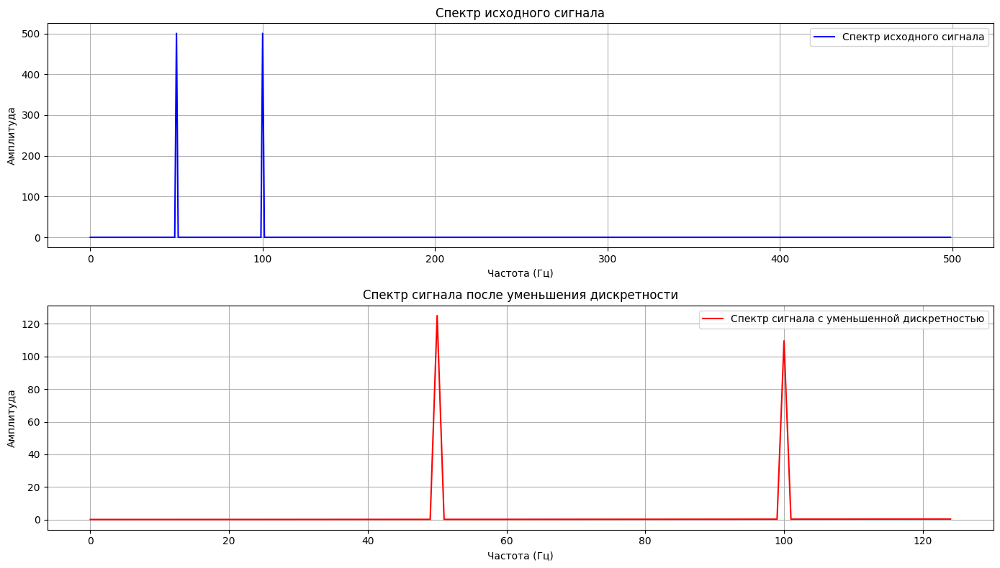

In [ ]:
def calculate_spectrum(signal, fs):
    N = len(signal)
    freq = np.fft.fftfreq(N, d=1/fs)
    spectrum = np.fft.fft(signal)
    return freq[:N // 2], np.abs(spectrum)[:N // 2]

freq_original, spectrum_original = calculate_spectrum(signal, fs_original)
freq_downsampled, spectrum_downsampled = calculate_spectrum(downsampled_signal, fs_new)

plt.figure(figsize=(14, 8))

plt.subplot(2, 1, 1)
plt.plot(freq_original, spectrum_original, label='Спектр исходного сигнала', color='blue')
plt.title("Спектр исходного сигнала")
plt.xlabel("Частота (Гц)")
plt.ylabel("Амплитуда")
plt.legend()
plt.grid()

plt.subplot(2, 1, 2)
plt.plot(freq_downsampled, spectrum_downsampled, label='Спектр сигнала с уменьшенной дискретностью', color='red')
plt.title("Спектр сигнала после уменьшения дискретности")
plt.xlabel("Частота (Гц)")
plt.ylabel("Амплитуда")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()


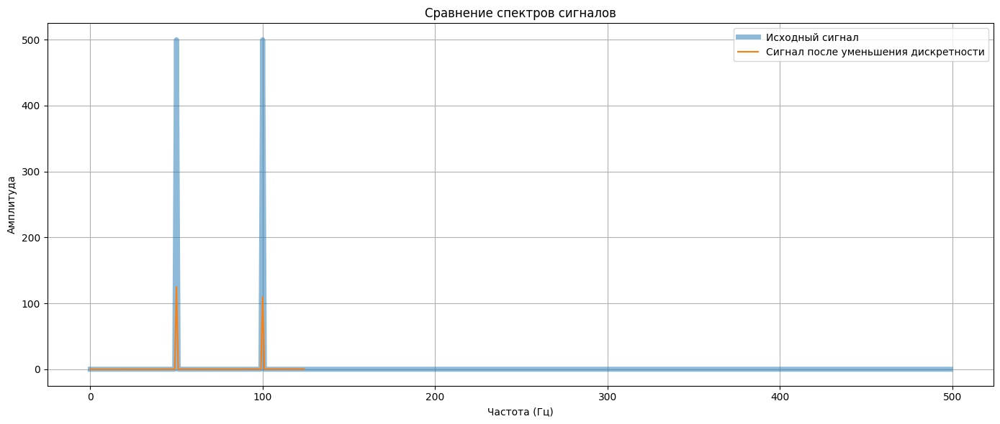

In [ ]:
plt.figure(figsize=(14, 6))

plt.plot(freq_original, spectrum_original, label='Исходный сигнал', alpha=0.5, lw = 5)

plt.plot(freq_downsampled, spectrum_downsampled, label='Сигнал после уменьшения дискретности')

plt.title("Сравнение спектров сигналов")
plt.xlabel("Частота (Гц)")
plt.ylabel("Амплитуда")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()


**Задание 5**

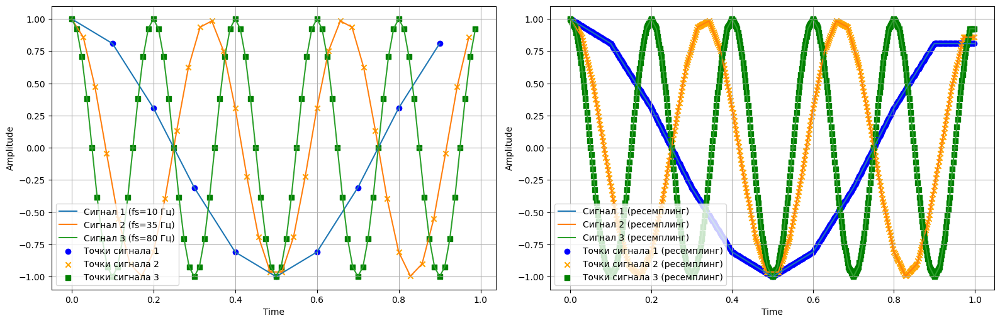

In [ ]:
fs1, fs2, fs3 = 10, 35, 80

t1 = np.arange(0, 1, 1 / fs1)
t2 = np.arange(0, 1, 1 / fs2)
t3 = np.arange(0, 1, 1 / fs3)

signal1 = np.cos(2 * np.pi * 1 * t1)
signal2 = np.cos(2 * np.pi * 3 * t2)
signal3 = np.cos(2 * np.pi * 5 * t3)

fs_common = np.lcm.reduce([fs1, fs2, fs3])
t_common = np.arange(0, 1, 1 / fs_common)

signal1_resampled = np.interp(t_common, t1, signal1)
signal2_resampled = np.interp(t_common, t2, signal2)
signal3_resampled = np.interp(t_common, t3, signal3)

plt.figure(figsize=(16, 15))

plt.subplot(3, 2, 3)
plt.plot(t1, signal1, label='Сигнал 1 (fs=10 Гц)')
plt.plot(t2, signal2, label='Сигнал 2 (fs=35 Гц)')
plt.plot(t3, signal3, label='Сигнал 3 (fs=80 Гц)')
plt.xlabel("Time")
plt.ylabel("Amplitude")

plt.scatter(t1, signal1, color='blue', marker='o', label='Точки сигнала 1')
plt.scatter(t2, signal2, color='orange', marker='x', label='Точки сигнала 2')
plt.scatter(t3, signal3, color='green', marker='s', label='Точки сигнала 3')
plt.legend(loc='lower left')
plt.grid()

plt.subplot(3, 2, 4)
plt.plot(t_common, signal1_resampled, label='Сигнал 1 (ресемплинг)')
plt.plot(t_common, signal2_resampled, label='Сигнал 2 (ресемплинг)')
plt.plot(t_common, signal3_resampled, label='Сигнал 3 (ресемплинг)')
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.scatter(t_common, signal1_resampled, color='blue', marker='o', label='Точки сигнала 1 (ресемплинг)')
plt.scatter(t_common, signal2_resampled, color='orange', marker='x', label='Точки сигнала 2 (ресемплинг)')
plt.scatter(t_common, signal3_resampled, color='green', marker='s', label='Точки сигнала 3 (ресемплинг)')
plt.legend(loc='lower left')
plt.grid()

plt.tight_layout()
plt.show()

#Лабораторная 8

In [ ]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
import math

**Задание 1**

<ipython-input-13-60365e8777f0>:26: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  A[i, j] -= w[j] * K(x[i], x[j])


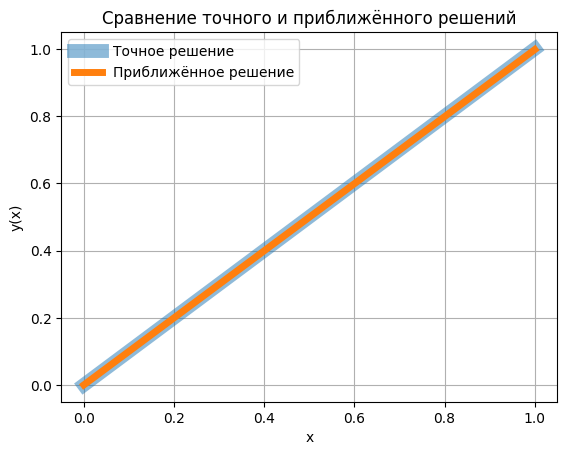

In [ ]:
a = 0.0
b = 1.0
N = 100
h = (b - a) / (N - 1)
x = np.linspace(a, b, N).reshape(N, 1)

def K(x1, s):
    return 0.5 * x1 * s

def f(x1):
    return (5 / 6) * x1

def solve_integral_eq(K, f, a, b, h):
    n = int((b - a) / h) + 1
    x = np.linspace(a, b, n).reshape(n, 1)

    #Заполнение весов
    w = np.ones(n)
    w[0] = 0.5
    w[-1] = 0.5
    w *= h

    A = np.eye(n)
    for i in range(n):
        for j in range(n):
            A[i, j] -= w[j] * K(x[i], x[j])

    #Правая часть системы
    B = f(x).reshape(n, 1)

    y = np.linalg.solve(A, B)
    return x, y

x, y_approx = solve_integral_eq(K, f, a, b, h)

y_exact = x

plt.plot(x, y_exact, label="Точное решение", lw = 10, alpha = 0.5)
plt.plot(x, y_approx, label="Приближённое решение", lw = 5)
plt.legend()
plt.xlabel("x")
plt.ylabel("y(x)")
plt.title("Сравнение точного и приближённого решений")
plt.grid(True)
plt.show()


**Задание 2**